## Attempting data analysis for P1
TODO:
1. merge relevant datasets
2. extract all gestures with mappings to text descriptions
3. preliminary attemps to classify gesture
4. generate visualizations

In [312]:
import pandas as pd
import numpy as np
import glob
import os
import cv2
from PIL import Image as im

### 1. merge relevant datasets

In [313]:
cwd = os.getcwd()
all_flat = sorted(glob.glob(os.path.join(cwd, "data/P1*FLAT*csv")))
all_pillow = sorted(glob.glob(os.path.join(cwd, "data/P1*PILLOW*.csv")))

In [314]:
ascii_to_gesture = {
    109: "massage",
    114: "rub",
    100: "drag",
    115: "slide",
    112: "poke",
    97: "pat",
    101: "press",
    116: "tap",
    110: "pinch",
    107: "knead",
    119: "twist",
    111: "no",
    99: "constant",
    102: "fist",
    108: "type",
    104: "karate",
    117: "drums",
    103: "outward_caress",
    122: "scratch",
    49: "flat_topleft",
    50: "flat_topright",
    51: "flat_bottomright",
    52: "flat_bottomleft",
    53: "flat_center",
    54: "curve_topleft",
    55: "curve_topright",
    56: "curve_bottomright",
    57: "curve_bottomleft",
    58: "curve_center"
}

In [315]:
def normalize(arr):
    arr = arr.astype('float')
    for i in range(3):
        minval = minmaxvals[0]['min']
        maxval = minmaxvals[0]['max']
        if minval != maxval:
            arr[..., i] -= minval
            arr[..., i] *= (255.0 / (maxval - minval))
    return arr

In [316]:
class Gesture:
    def __init__(self, timestamps, pressure, shear_x, shear_y, label):
        self.timestamps = timestamps
        self.pressure = pressure
        self.shear_x = shear_x
        self.shear_y = shear_y
        self.label = label
        self.combined_data = [np.dstack((self.pressure[:,:,i], self.shear_x[:,:,i], self.shear_y[:, :, i])) for i in range(self.shear_y.shape[2])]
    
    def to_video(self):
        width = 600
        height = 600
        channel = 3

        fps = self.timestamps.size/12.0

        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        video = cv2.VideoWriter(self.label+'2.mp4', fourcc, float(fps), (width, height))

        for d in self.combined_data:
            img = normalize(d).astype(np.uint8)
            img = img.repeat(100, 0).repeat(100, 1)
            print(img.shape)
            print(img)
            video.write(img)
        video.release()

    def to_img(self):
        avg_data = sum(self.combined_data)
        avg_data_100 = avg_data.repeat(100, 0).repeat(100, 1)
        print(np.round(normalize(avg_data_100)))
        img = im.fromarray(normalize(avg_data_100).astype('uint8'),'RGB')
        img.save(self.label+"2.jpg")
    

In [317]:
pressure_idx = list(filter(lambda n:n%5==3, range(1, 181)))
shear_up_idx = list(filter(lambda n:n%5==1, range(1, 181)))
shear_down_idx = list(filter(lambda n:n%5==0, range(1, 181)))
shear_left_idx = list(filter(lambda n:n%5==2, range(1, 181)))
shear_right_idx = list(filter(lambda n:n%5==4, range(1, 181)))

def transform_raw_data(df):
    def find_shear_x(l, r, l_avg, r_avg):
        return (l*r_avg - r*l_avg)/(l_avg + r_avg)

    def find_shear_y(u, d, u_avg, d_avg):
        return (u*d_avg - d*u_avg)/(u_avg + d_avg)
    
    def decompose_data(name, df, avg):
        # re-align time stamps to start at 0
        time_stamps = df.pop(df.columns[0]).to_numpy()
        time_stamps = time_stamps - time_stamps[0]

        # convert labels to respective gestures
        label = ascii_to_gesture.get(name)

        # extract specific channel data from each taxel
        pressure = df[pressure_idx].to_numpy()
        shear_up = df[shear_up_idx].to_numpy()
        shear_down = df[shear_down_idx].to_numpy()
        shear_left = df[shear_left_idx].to_numpy()
        shear_right = df[shear_right_idx].to_numpy()

        # calculate shear
        shear_y = np.zeros(shear_up.shape)
        shear_x = np.zeros(shear_up.shape)

        for i in range(0, shear_up.shape[0]):
            for j in range(0, 36):
                shear_y[i][j] = find_shear_y(shear_up[i][j], shear_down[i][j], avg[5*j], avg[5*j+4])
                shear_x[i][j] = find_shear_x(shear_left[i][j], shear_right[i][j], avg[5*j+1], avg[5*j+3])
        
        # reshape and clean
        shear_y_3d = shear_y.reshape(6, 6, shear_y.shape[0])
        shear_x_3d = shear_x.reshape(6, 6, shear_y.shape[0])
        pressure_3d = pressure.reshape(6, 6, shear_y.shape[0])

        shear_y_3d[np.where(np.isnan(shear_y_3d))] = 0
        shear_x_3d[np.where(np.isnan(shear_x_3d))] = 0
        pressure_3d[np.where(np.isnan(pressure_3d))] = 0
        
        return Gesture(time_stamps, pressure_3d, shear_x_3d, shear_y_3d, label)

    # average of the first 100 rows
    avg = df.iloc[0, 1:181].to_numpy()
    
    # remove unlablled data
    df = df[df[182] != 0]
    grouped_df = df.groupby(df.columns[-1])
    gestures = []
    for name, group in grouped_df:
        gestures.append(decompose_data(name, group, avg))
    return gestures
    

In [318]:
gestures = []
for f in sorted(all_flat):
    df = pd.read_csv(f, header=None, skiprows=[0])
    gestures.extend(transform_raw_data(df))

In [319]:
for g in gestures:
    g.to_img()
    g.to_video()

[[[285735.   -397.   -411.]
  [285735.   -397.   -411.]
  [285735.   -397.   -411.]
  ...
  [285890.   -428.   -426.]
  [285890.   -428.   -426.]
  [285890.   -428.   -426.]]

 [[285735.   -397.   -411.]
  [285735.   -397.   -411.]
  [285735.   -397.   -411.]
  ...
  [285890.   -428.   -426.]
  [285890.   -428.   -426.]
  [285890.   -428.   -426.]]

 [[285735.   -397.   -411.]
  [285735.   -397.   -411.]
  [285735.   -397.   -411.]
  ...
  [285890.   -428.   -426.]
  [285890.   -428.   -426.]
  [285890.   -428.   -426.]]

 ...

 [[285717.   -454.   -407.]
  [285717.   -454.   -407.]
  [285717.   -454.   -407.]
  ...
  [285708.   -441.   -441.]
  [285708.   -441.   -441.]
  [285708.   -441.   -441.]]

 [[285717.   -454.   -407.]
  [285717.   -454.   -407.]
  [285717.   -454.   -407.]
  ...
  [285708.   -441.   -441.]
  [285708.   -441.   -441.]
  [285708.   -441.   -441.]]

 [[285717.   -454.   -407.]
  [285717.   -454.   -407.]
  [285717.   -454.   -407.]
  ...
  [285708.   -441.   -44

(600, 600, 3)
[[[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 ...

 [[191 113 114]
  [191 113 114]
  [191 113 114]
  ...
  [116 113 113]
  [116 113 113]
  [116 113 113]]

 [[191 113 114]
  [191 113 114]
  [191 113 114]
  ...
  [116 113 113]
  [116 113 113]
  [116 113 113]]

 [[191 113 114]
  [191 113 114]
  [191 113 114]
  ...
  [116 113 113]
  [116 113 113]
  [116 113 113]]]
(600, 600, 3)
[[[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [152 113 114]
  [152 113 114]
  [152 113 114]]

 [[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [152 113 114]
  [152 113 114]
  [152 113 114]]

 [[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [152 113 114]
  [152 113 114]
  [152 113 114]]

 ...

 [[212 114 114]
  [212 1

(600, 600, 3)
[[[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 ...

 [[227 113 114]
  [227 113 114]
  [227 113 114]
  ...
  [191 114 113]
  [191 114 113]
  [191 114 113]]

 [[227 113 114]
  [227 113 114]
  [227 113 114]
  ...
  [191 114 113]
  [191 114 113]
  [191 114 113]]

 [[227 113 114]
  [227 113 114]
  [227 113 114]
  ...
  [191 114 113]
  [191 114 113]
  [191 114 113]]]
(600, 600, 3)
[[[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 114 114]
  [211 114 114]
  [211 114 114]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 114 114]
  [211 114 114]
  [211 114 114]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 114 114]
  [211 114 114]
  [211 114 114]]

 ...

 [[147 113 113]
  [147 1

(600, 600, 3)
[[[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [153 113 113]
  [153 113 113]
  [153 113 113]]

 [[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [153 113 113]
  [153 113 113]
  [153 113 113]]

 [[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [153 113 113]
  [153 113 113]
  [153 113 113]]

 ...

 [[211 112 114]
  [211 112 114]
  [211 112 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[211 112 114]
  [211 112 114]
  [211 112 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[211 112 114]
  [211 112 114]
  [211 112 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]]
(600, 600, 3)
[[[237 113 114]
  [237 113 114]
  [237 113 114]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 [[237 113 114]
  [237 113 114]
  [237 113 114]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 [[237 113 114]
  [237 113 114]
  [237 113 114]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 ...

 [[228 114 114]
  [228 1

(600, 600, 3)
[[[143 113 113]
  [143 113 113]
  [143 113 113]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[143 113 113]
  [143 113 113]
  [143 113 113]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[143 113 113]
  [143 113 113]
  [143 113 113]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 ...

 [[155 114 113]
  [155 114 113]
  [155 114 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[155 114 113]
  [155 114 113]
  [155 114 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[155 114 113]
  [155 114 113]
  [155 114 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]]
(600, 600, 3)
[[[190 114 114]
  [190 114 114]
  [190 114 114]
  ...
  [147 114 112]
  [147 114 112]
  [147 114 112]]

 [[190 114 114]
  [190 114 114]
  [190 114 114]
  ...
  [147 114 112]
  [147 114 112]
  [147 114 112]]

 [[190 114 114]
  [190 114 114]
  [190 114 114]
  ...
  [147 114 112]
  [147 114 112]
  [147 114 112]]

 ...

 [[194 113 114]
  [194 1

(600, 600, 3)
[[[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [149 113 112]
  [149 113 112]
  [149 113 112]]

 [[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [149 113 112]
  [149 113 112]
  [149 113 112]]

 [[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [149 113 112]
  [149 113 112]
  [149 113 112]]

 ...

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [147 112 113]
  [147 112 113]
  [147 112 113]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [147 112 113]
  [147 112 113]
  [147 112 113]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [147 112 113]
  [147 112 113]
  [147 112 113]]]
(600, 600, 3)
[[[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 ...

 [[192 113 113]
  [192 1

(600, 600, 3)
[[[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 ...

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [157 114 114]
  [157 114 114]
  [157 114 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [157 114 114]
  [157 114 114]
  [157 114 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [157 114 114]
  [157 114 114]
  [157 114 114]]]
(600, 600, 3)
[[[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [116 114 113]
  [116 114 113]
  [116 114 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [116 114 113]
  [116 114 113]
  [116 114 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [116 114 113]
  [116 114 113]
  [116 114 113]]

 ...

 [[191 114 113]
  [191 1

(600, 600, 3)
[[[144 114 114]
  [144 114 114]
  [144 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[144 114 114]
  [144 114 114]
  [144 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[144 114 114]
  [144 114 114]
  [144 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 ...

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [235 114 113]
  [235 114 113]
  [235 114 113]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [235 114 113]
  [235 114 113]
  [235 114 113]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [235 114 113]
  [235 114 113]
  [235 114 113]]]
(600, 600, 3)
[[[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 ...

 [[150 114 114]
  [150 1

(600, 600, 3)
[[[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [231 114 114]
  [231 114 114]
  [231 114 114]]

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [231 114 114]
  [231 114 114]
  [231 114 114]]

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [231 114 114]
  [231 114 114]
  [231 114 114]]

 ...

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 113]
  [238 114 113]
  [238 114 113]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 113]
  [238 114 113]
  [238 114 113]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 113]
  [238 114 113]
  [238 114 113]]]
(600, 600, 3)
[[[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 ...

 [[152 113 114]
  [152 1

(600, 600, 3)
[[[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 ...

 [[144 112 114]
  [144 112 114]
  [144 112 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[144 112 114]
  [144 112 114]
  [144 112 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[144 112 114]
  [144 112 114]
  [144 112 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]]
(600, 600, 3)
[[[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [147 112 113]
  [147 112 113]
  [147 112 113]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [147 112 113]
  [147 112 113]
  [147 112 113]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [147 112 113]
  [147 112 113]
  [147 112 113]]

 ...

 [[153 112 114]
  [153 1

(600, 600, 3)
[[[116 113 113]
  [116 113 113]
  [116 113 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[116 113 113]
  [116 113 113]
  [116 113 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[116 113 113]
  [116 113 113]
  [116 113 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 ...

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [230 114 113]
  [230 114 113]
  [230 114 113]]

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [230 114 113]
  [230 114 113]
  [230 114 113]]

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [230 114 113]
  [230 114 113]
  [230 114 113]]]
(600, 600, 3)
[[[143 113 113]
  [143 113 113]
  [143 113 113]
  ...
  [155 115 113]
  [155 115 113]
  [155 115 113]]

 [[143 113 113]
  [143 113 113]
  [143 113 113]
  ...
  [155 115 113]
  [155 115 113]
  [155 115 113]]

 [[143 113 113]
  [143 113 113]
  [143 113 113]
  ...
  [155 115 113]
  [155 115 113]
  [155 115 113]]

 ...

 [[155 114 113]
  [155 1

(600, 600, 3)
[[[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [149 113 112]
  [149 113 112]
  [149 113 112]]

 [[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [149 113 112]
  [149 113 112]
  [149 113 112]]

 [[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [149 113 112]
  [149 113 112]
  [149 113 112]]

 ...

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [147 112 113]
  [147 112 113]
  [147 112 113]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [147 112 113]
  [147 112 113]
  [147 112 113]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [147 112 113]
  [147 112 113]
  [147 112 113]]]
(600, 600, 3)
[[[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 ...

 [[192 113 113]
  [192 1

[[[ 2.92962e+05 -3.96000e+02 -3.63000e+02]
  [ 2.92962e+05 -3.96000e+02 -3.63000e+02]
  [ 2.92962e+05 -3.96000e+02 -3.63000e+02]
  ...
  [ 2.92342e+05 -1.81000e+02 -3.47000e+02]
  [ 2.92342e+05 -1.81000e+02 -3.47000e+02]
  [ 2.92342e+05 -1.81000e+02 -3.47000e+02]]

 [[ 2.92962e+05 -3.96000e+02 -3.63000e+02]
  [ 2.92962e+05 -3.96000e+02 -3.63000e+02]
  [ 2.92962e+05 -3.96000e+02 -3.63000e+02]
  ...
  [ 2.92342e+05 -1.81000e+02 -3.47000e+02]
  [ 2.92342e+05 -1.81000e+02 -3.47000e+02]
  [ 2.92342e+05 -1.81000e+02 -3.47000e+02]]

 [[ 2.92962e+05 -3.96000e+02 -3.63000e+02]
  [ 2.92962e+05 -3.96000e+02 -3.63000e+02]
  [ 2.92962e+05 -3.96000e+02 -3.63000e+02]
  ...
  [ 2.92342e+05 -1.81000e+02 -3.47000e+02]
  [ 2.92342e+05 -1.81000e+02 -3.47000e+02]
  [ 2.92342e+05 -1.81000e+02 -3.47000e+02]]

 ...

 [[ 2.92211e+05 -3.67000e+02 -4.19000e+02]
  [ 2.92211e+05 -3.67000e+02 -4.19000e+02]
  [ 2.92211e+05 -3.67000e+02 -4.19000e+02]
  ...
  [ 2.92343e+05 -3.73000e+02 -3.83000e+02]
  [ 2.92343e+05 -3

(600, 600, 3)
[[[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [117 114 113]
  [117 114 113]
  [117 114 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [117 114 113]
  [117 114 113]
  [117 114 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [117 114 113]
  [117 114 113]
  [117 114 113]]

 ...

 [[192 113 116]
  [192 113 116]
  [192 113 116]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[192 113 116]
  [192 113 116]
  [192 113 116]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[192 113 116]
  [192 113 116]
  [192 113 116]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]]
(600, 600, 3)
[[[217 113 114]
  [217 113 114]
  [217 113 114]
  ...
  [136 125 122]
  [136 125 122]
  [136 125 122]]

 [[217 113 114]
  [217 113 114]
  [217 113 114]
  ...
  [136 125 122]
  [136 125 122]
  [136 125 122]]

 [[217 113 114]
  [217 113 114]
  [217 113 114]
  ...
  [136 125 122]
  [136 125 122]
  [136 125 122]]

 ...

 [[213 114 113]
  [213 1

(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [151 114 114]
  [151 114 114]
  [151 114 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [151 114 114]
  [151 114 114]
  [151 114 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [151 114 114]
  [151 114 114]
  [151 114 114]]

 ...

 [[132 113 111]
  [132 113 111]
  [132 113 111]
  ...
  [152 113 113]
  [152 113 113]
  [152 113 113]]

 [[132 113 111]
  [132 113 111]
  [132 113 111]
  ...
  [152 113 113]
  [152 113 113]
  [152 113 113]]

 [[132 113 111]
  [132 113 111]
  [132 113 111]
  ...
  [152 113 113]
  [152 113 113]
  [152 113 113]]]
(600, 600, 3)
[[[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [146 113 113]
  [146 113 113]
  [146 113 113]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [146 113 113]
  [146 113 113]
  [146 113 113]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [146 113 113]
  [146 113 113]
  [146 113 113]]

 ...

 [[193 113 114]
  [193 1

(600, 600, 3)
[[[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [224 111 117]
  [224 111 117]
  [224 111 117]]

 [[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [224 111 117]
  [224 111 117]
  [224 111 117]]

 [[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [224 111 117]
  [224 111 117]
  [224 111 117]]

 ...

 [[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [241 113 115]
  [241 113 115]
  [241 113 115]]

 [[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [241 113 115]
  [241 113 115]
  [241 113 115]]

 [[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [241 113 115]
  [241 113 115]
  [241 113 115]]]
(600, 600, 3)
[[[144 114 113]
  [144 114 113]
  [144 114 113]
  ...
  [154 115 113]
  [154 115 113]
  [154 115 113]]

 [[144 114 113]
  [144 114 113]
  [144 114 113]
  ...
  [154 115 113]
  [154 115 113]
  [154 115 113]]

 [[144 114 113]
  [144 114 113]
  [144 114 113]
  ...
  [154 115 113]
  [154 115 113]
  [154 115 113]]

 ...

 [[157 113 114]
  [157 1

(600, 600, 3)
[[[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [149 114 112]
  [149 114 112]
  [149 114 112]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [149 114 112]
  [149 114 112]
  [149 114 112]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [149 114 112]
  [149 114 112]
  [149 114 112]]

 ...

 [[194 114 114]
  [194 114 114]
  [194 114 114]
  ...
  [117 114 112]
  [117 114 112]
  [117 114 112]]

 [[194 114 114]
  [194 114 114]
  [194 114 114]
  ...
  [117 114 112]
  [117 114 112]
  [117 114 112]]

 [[194 114 114]
  [194 114 114]
  [194 114 114]
  ...
  [117 114 112]
  [117 114 112]
  [117 114 112]]]
(600, 600, 3)
[[[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [139 108 113]
  [139 108 113]
  [139 108 113]]

 [[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [139 108 113]
  [139 108 113]
  [139 108 113]]

 [[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [139 108 113]
  [139 108 113]
  [139 108 113]]

 ...

 [[218 113 113]
  [218 1

(600, 600, 3)
[[[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [122 116 113]
  [122 116 113]
  [122 116 113]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [122 116 113]
  [122 116 113]
  [122 116 113]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [122 116 113]
  [122 116 113]
  [122 116 113]]

 ...

 [[218 118 113]
  [218 118 113]
  [218 118 113]
  ...
  [153 115 112]
  [153 115 112]
  [153 115 112]]

 [[218 118 113]
  [218 118 113]
  [218 118 113]
  ...
  [153 115 112]
  [153 115 112]
  [153 115 112]]

 [[218 118 113]
  [218 118 113]
  [218 118 113]
  ...
  [153 115 112]
  [153 115 112]
  [153 115 112]]]
(600, 600, 3)
[[[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [193 113 114]
  [193 113 114]
  [193 113 114]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [193 113 114]
  [193 113 114]
  [193 113 114]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [193 113 114]
  [193 113 114]
  [193 113 114]]

 ...

 [[241 113 115]
  [241 1

(600, 600, 3)
[[[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 ...

 [[134 123 119]
  [134 123 119]
  [134 123 119]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[134 123 119]
  [134 123 119]
  [134 123 119]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[134 123 119]
  [134 123 119]
  [134 123 119]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]]
(600, 600, 3)
[[[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 ...

 [[189 115 108]
  [189 1

(600, 600, 3)
[[[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [236 113 114]
  [236 113 114]
  [236 113 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [236 113 114]
  [236 113 114]
  [236 113 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [236 113 114]
  [236 113 114]
  [236 113 114]]

 ...

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [229 113 113]
  [229 113 113]
  [229 113 113]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [229 113 113]
  [229 113 113]
  [229 113 113]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [229 113 113]
  [229 113 113]
  [229 113 113]]]
(600, 600, 3)
[[[154 113 113]
  [154 113 113]
  [154 113 113]
  ...
  [151 113 114]
  [151 113 114]
  [151 113 114]]

 [[154 113 113]
  [154 113 113]
  [154 113 113]
  ...
  [151 113 114]
  [151 113 114]
  [151 113 114]]

 [[154 113 113]
  [154 113 113]
  [154 113 113]
  ...
  [151 113 114]
  [151 113 114]
  [151 113 114]]

 ...

 [[152 115 111]
  [152 1

(600, 600, 3)
[[[157 113 113]
  [157 113 113]
  [157 113 113]
  ...
  [218 122 114]
  [218 122 114]
  [218 122 114]]

 [[157 113 113]
  [157 113 113]
  [157 113 113]
  ...
  [218 122 114]
  [218 122 114]
  [218 122 114]]

 [[157 113 113]
  [157 113 113]
  [157 113 113]
  ...
  [218 122 114]
  [218 122 114]
  [218 122 114]]

 ...

 [[154 115 113]
  [154 115 113]
  [154 115 113]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 [[154 115 113]
  [154 115 113]
  [154 115 113]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 [[154 115 113]
  [154 115 113]
  [154 115 113]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]]
(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [241 113 115]
  [241 113 115]
  [241 113 115]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [241 113 115]
  [241 113 115]
  [241 113 115]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [241 113 115]
  [241 113 115]
  [241 113 115]]

 ...

 [[148 114 112]
  [148 1

(600, 600, 3)
[[[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [188 117 105]
  [188 117 105]
  [188 117 105]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [188 117 105]
  [188 117 105]
  [188 117 105]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [188 117 105]
  [188 117 105]
  [188 117 105]]

 ...

 [[229 114 113]
  [229 114 113]
  [229 114 113]
  ...
  [194 113 114]
  [194 113 114]
  [194 113 114]]

 [[229 114 113]
  [229 114 113]
  [229 114 113]
  ...
  [194 113 114]
  [194 113 114]
  [194 113 114]]

 [[229 114 113]
  [229 114 113]
  [229 114 113]
  ...
  [194 113 114]
  [194 113 114]
  [194 113 114]]]
(600, 600, 3)
[[[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [197 111 113]
  [197 111 113]
  [197 111 113]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [197 111 113]
  [197 111 113]
  [197 111 113]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [197 111 113]
  [197 111 113]
  [197 111 113]]

 ...

 [[148 113 114]
  [148 1

(600, 600, 3)
[[[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [152 116 112]
  [152 116 112]
  [152 116 112]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [152 116 112]
  [152 116 112]
  [152 116 112]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [152 116 112]
  [152 116 112]
  [152 116 112]]

 ...

 [[213 113 114]
  [213 113 114]
  [213 113 114]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]

 [[213 113 114]
  [213 113 114]
  [213 113 114]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]

 [[213 113 114]
  [213 113 114]
  [213 113 114]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]]
(600, 600, 3)
[[[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [191 113 114]
  [191 113 114]
  [191 113 114]]

 [[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [191 113 114]
  [191 113 114]
  [191 113 114]]

 [[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [191 113 114]
  [191 113 114]
  [191 113 114]]

 ...

 [[228 114 113]
  [228 1

(600, 600, 3)
[[[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [135 108 113]
  [135 108 113]
  [135 108 113]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [135 108 113]
  [135 108 113]
  [135 108 113]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [135 108 113]
  [135 108 113]
  [135 108 113]]

 ...

 [[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [133 124 120]
  [133 124 120]
  [133 124 120]]

 [[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [133 124 120]
  [133 124 120]
  [133 124 120]]

 [[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [133 124 120]
  [133 124 120]
  [133 124 120]]]
(600, 600, 3)
[[[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [195 114 116]
  [195 114 116]
  [195 114 116]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [195 114 116]
  [195 114 116]
  [195 114 116]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [195 114 116]
  [195 114 116]
  [195 114 116]]

 ...

 [[236 113 114]
  [236 1

(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 ...

 [[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]]
(600, 600, 3)
[[[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 ...

 [[193 113 113]
  [193 1

(600, 600, 3)
[[[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 ...

 [[117 114 114]
  [117 114 114]
  [117 114 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[117 114 114]
  [117 114 114]
  [117 114 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[117 114 114]
  [117 114 114]
  [117 114 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]]
(600, 600, 3)
[[[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [147 114 113]
  [147 114 113]
  [147 114 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [147 114 113]
  [147 114 113]
  [147 114 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [147 114 113]
  [147 114 113]
  [147 114 113]]

 ...

 [[140 116 116]
  [140 1

(600, 600, 3)
[[[213 114 114]
  [213 114 114]
  [213 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[213 114 114]
  [213 114 114]
  [213 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[213 114 114]
  [213 114 114]
  [213 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 ...

 [[213 114 116]
  [213 114 116]
  [213 114 116]
  ...
  [191 113 115]
  [191 113 115]
  [191 113 115]]

 [[213 114 116]
  [213 114 116]
  [213 114 116]
  ...
  [191 113 115]
  [191 113 115]
  [191 113 115]]

 [[213 114 116]
  [213 114 116]
  [213 114 116]
  ...
  [191 113 115]
  [191 113 115]
  [191 113 115]]]
(600, 600, 3)
[[[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 ...

 [[231 115 115]
  [231 1

(600, 600, 3)
[[[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [217 114 114]
  [217 114 114]
  [217 114 114]]

 [[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [217 114 114]
  [217 114 114]
  [217 114 114]]

 [[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [217 114 114]
  [217 114 114]
  [217 114 114]]

 ...

 [[232 114 114]
  [232 114 114]
  [232 114 114]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]

 [[232 114 114]
  [232 114 114]
  [232 114 114]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]

 [[232 114 114]
  [232 114 114]
  [232 114 114]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]]
(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 113 114]
  [238 113 114]
  [238 113 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 113 114]
  [238 113 114]
  [238 113 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 113 114]
  [238 113 114]
  [238 113 114]]

 ...

 [[154 114 114]
  [154 1

(600, 600, 3)
[[[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [212 114 116]
  [212 114 116]
  [212 114 116]]

 [[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [212 114 116]
  [212 114 116]
  [212 114 116]]

 [[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [212 114 116]
  [212 114 116]
  [212 114 116]]

 ...

 [[237 115 115]
  [237 115 115]
  [237 115 115]
  ...
  [218 114 114]
  [218 114 114]
  [218 114 114]]

 [[237 115 115]
  [237 115 115]
  [237 115 115]
  ...
  [218 114 114]
  [218 114 114]
  [218 114 114]]

 [[237 115 115]
  [237 115 115]
  [237 115 115]
  ...
  [218 114 114]
  [218 114 114]
  [218 114 114]]]
(600, 600, 3)
[[[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [229 114 116]
  [229 114 116]
  [229 114 116]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [229 114 116]
  [229 114 116]
  [229 114 116]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [229 114 116]
  [229 114 116]
  [229 114 116]]

 ...

 [[148 113 113]
  [148 1

[[[234 113 114]
  [234 113 114]
  [234 113 114]
  ...
  [213 114 115]
  [213 114 115]
  [213 114 115]]

 [[234 113 114]
  [234 113 114]
  [234 113 114]
  ...
  [213 114 115]
  [213 114 115]
  [213 114 115]]

 [[234 113 114]
  [234 113 114]
  [234 113 114]
  ...
  [213 114 115]
  [213 114 115]
  [213 114 115]]

 ...

 [[227 113 114]
  [227 113 114]
  [227 113 114]
  ...
  [212 115 117]
  [212 115 117]
  [212 115 117]]

 [[227 113 114]
  [227 113 114]
  [227 113 114]
  ...
  [212 115 117]
  [212 115 117]
  [212 115 117]]

 [[227 113 114]
  [227 113 114]
  [227 113 114]
  ...
  [212 115 117]
  [212 115 117]
  [212 115 117]]]
(600, 600, 3)
[[[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [232 114 114]
  [232 114 114]
  [232 114 114]]

 [[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [232 114 114]
  [232 114 114]
  [232 114 114]]

 [[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [232 114 114]
  [232 114 114]
  [232 114 114]]

 ...

 [[157 114 113]
  [157 114 113]
  [157

(600, 600, 3)
[[[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [231 113 114]
  [231 113 114]
  [231 113 114]]

 [[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [231 113 114]
  [231 113 114]
  [231 113 114]]

 [[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [231 113 114]
  [231 113 114]
  [231 113 114]]

 ...

 [[151 114 113]
  [151 114 113]
  [151 114 113]
  ...
  [232 114 116]
  [232 114 116]
  [232 114 116]]

 [[151 114 113]
  [151 114 113]
  [151 114 113]
  ...
  [232 114 116]
  [232 114 116]
  [232 114 116]]

 [[151 114 113]
  [151 114 113]
  [151 114 113]
  ...
  [232 114 116]
  [232 114 116]
  [232 114 116]]]
(600, 600, 3)
[[[117 113 113]
  [117 113 113]
  [117 113 113]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[117 113 113]
  [117 113 113]
  [117 113 113]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[117 113 113]
  [117 113 113]
  [117 113 113]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 ...

 [[141 113 114]
  [141 1

(600, 600, 3)
[[[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 ...

 [[118 114 114]
  [118 114 114]
  [118 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[118 114 114]
  [118 114 114]
  [118 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[118 114 114]
  [118 114 114]
  [118 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]]
(600, 600, 3)
[[[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 ...

 [[142 115 116]
  [142 1

(600, 600, 3)
[[[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]

 [[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]

 [[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]

 ...

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]]
(600, 600, 3)
[[[152 113 114]
  [152 113 114]
  [152 113 114]
  ...
  [141 114 114]
  [141 114 114]
  [141 114 114]]

 [[152 113 114]
  [152 113 114]
  [152 113 114]
  ...
  [141 114 114]
  [141 114 114]
  [141 114 114]]

 [[152 113 114]
  [152 113 114]
  [152 113 114]
  ...
  [141 114 114]
  [141 114 114]
  [141 114 114]]

 ...

 [[150 114 115]
  [150 1

(600, 600, 3)
[[[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [116 115 114]
  [116 115 114]
  [116 115 114]]

 [[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [116 115 114]
  [116 115 114]
  [116 115 114]]

 [[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [116 115 114]
  [116 115 114]
  [116 115 114]]

 ...

 [[161 114 114]
  [161 114 114]
  [161 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[161 114 114]
  [161 114 114]
  [161 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[161 114 114]
  [161 114 114]
  [161 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]]
(600, 600, 3)
[[[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 ...

 [[199 113 115]
  [199 1

(600, 600, 3)
[[[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [191 113 115]
  [191 113 115]
  [191 113 115]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [191 113 115]
  [191 113 115]
  [191 113 115]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [191 113 115]
  [191 113 115]
  [191 113 115]]

 ...

 [[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [190 114 114]
  [190 114 114]
  [190 114 114]]

 [[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [190 114 114]
  [190 114 114]
  [190 114 114]]

 [[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [190 114 114]
  [190 114 114]
  [190 114 114]]]
(600, 600, 3)
[[[234 113 114]
  [234 113 114]
  [234 113 114]
  ...
  [213 114 115]
  [213 114 115]
  [213 114 115]]

 [[234 113 114]
  [234 113 114]
  [234 113 114]
  ...
  [213 114 115]
  [213 114 115]
  [213 114 115]]

 [[234 113 114]
  [234 113 114]
  [234 113 114]
  ...
  [213 114 115]
  [213 114 115]
  [213 114 115]]

 ...

 [[227 113 115]
  [227 1

(600, 600, 3)
[[[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [213 114 113]
  [213 114 113]
  [213 114 113]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [213 114 113]
  [213 114 113]
  [213 114 113]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [213 114 113]
  [213 114 113]
  [213 114 113]]

 ...

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [212 115 115]
  [212 115 115]
  [212 115 115]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [212 115 115]
  [212 115 115]
  [212 115 115]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [212 115 115]
  [212 115 115]
  [212 115 115]]]
(600, 600, 3)
[[[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [230 113 114]
  [230 113 114]
  [230 113 114]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [230 113 114]
  [230 113 114]
  [230 113 114]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [230 113 114]
  [230 113 114]
  [230 113 114]]

 ...

 [[151 114 113]
  [151 1

(600, 600, 3)
[[[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 ...

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]]
(600, 600, 3)
[[[190 114 113]
  [190 114 113]
  [190 114 113]
  ...
  [153 113 115]
  [153 113 115]
  [153 113 115]]

 [[190 114 113]
  [190 114 113]
  [190 114 113]
  ...
  [153 113 115]
  [153 113 115]
  [153 113 115]]

 [[190 114 113]
  [190 114 113]
  [190 114 113]
  ...
  [153 113 115]
  [153 113 115]
  [153 113 115]]

 ...

 [[191 116 114]
  [191 1

(600, 600, 3)
[[[228 114 113]
  [228 114 113]
  [228 114 113]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 [[228 114 113]
  [228 114 113]
  [228 114 113]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 [[228 114 113]
  [228 114 113]
  [228 114 113]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 ...

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]]
(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [124 115 133]
  [124 115 133]
  [124 115 133]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [124 115 133]
  [124 115 133]
  [124 115 133]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [124 115 133]
  [124 115 133]
  [124 115 133]]

 ...

 [[157 113 113]
  [157 1

[[[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [157 113 113]
  [157 113 113]
  [157 113 113]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [157 113 113]
  [157 113 113]
  [157 113 113]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [157 113 113]
  [157 113 113]
  [157 113 113]]

 ...

 [[237 113 114]
  [237 113 114]
  [237 113 114]
  ...
  [149 113 112]
  [149 113 112]
  [149 113 112]]

 [[237 113 114]
  [237 113 114]
  [237 113 114]
  ...
  [149 113 112]
  [149 113 112]
  [149 113 112]]

 [[237 113 114]
  [237 113 114]
  [237 113 114]
  ...
  [149 113 112]
  [149 113 112]
  [149 113 112]]]
(600, 600, 3)
[[[157 114 114]
  [157 114 114]
  [157 114 114]
  ...
  [151 113 110]
  [151 113 110]
  [151 113 110]]

 [[157 114 114]
  [157 114 114]
  [157 114 114]
  ...
  [151 113 110]
  [151 113 110]
  [151 113 110]]

 [[157 114 114]
  [157 114 114]
  [157 114 114]
  ...
  [151 113 110]
  [151 113 110]
  [151 113 110]]

 ...

 [[150 114 113]
  [150 114 113]
  [150

(600, 600, 3)
[[[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [145 113 114]
  [145 113 114]
  [145 113 114]]

 [[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [145 113 114]
  [145 113 114]
  [145 113 114]]

 [[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [145 113 114]
  [145 113 114]
  [145 113 114]]

 ...

 [[146 114 112]
  [146 114 112]
  [146 114 112]
  ...
  [  4 121  86]
  [  4 121  86]
  [  4 121  86]]

 [[146 114 112]
  [146 114 112]
  [146 114 112]
  ...
  [  4 121  86]
  [  4 121  86]
  [  4 121  86]]

 [[146 114 112]
  [146 114 112]
  [146 114 112]
  ...
  [  4 121  86]
  [  4 121  86]
  [  4 121  86]]]
(600, 600, 3)
[[[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [ 69  68 144]
  [ 69  68 144]
  [ 69  68 144]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [ 69  68 144]
  [ 69  68 144]
  [ 69  68 144]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [ 69  68 144]
  [ 69  68 144]
  [ 69  68 144]]

 ...

 [[  4 120  89]
  [  4 1

(600, 600, 3)
[[[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [  2 113 112]
  [  2 113 112]
  [  2 113 112]]

 [[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [  2 113 112]
  [  2 113 112]
  [  2 113 112]]

 [[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [  2 113 112]
  [  2 113 112]
  [  2 113 112]]

 ...

 [[150 114 112]
  [150 114 112]
  [150 114 112]
  ...
  [149 118 113]
  [149 118 113]
  [149 118 113]]

 [[150 114 112]
  [150 114 112]
  [150 114 112]
  ...
  [149 118 113]
  [149 118 113]
  [149 118 113]]

 [[150 114 112]
  [150 114 112]
  [150 114 112]
  ...
  [149 118 113]
  [149 118 113]
  [149 118 113]]]
(600, 600, 3)
[[[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [146 114 115]
  [146 114 115]
  [146 114 115]]

 [[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [146 114 115]
  [146 114 115]
  [146 114 115]]

 [[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [146 114 115]
  [146 114 115]
  [146 114 115]]

 ...

 [[149 118 113]
  [149 1

(600, 600, 3)
[[[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [147 121 112]
  [147 121 112]
  [147 121 112]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [147 121 112]
  [147 121 112]
  [147 121 112]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [147 121 112]
  [147 121 112]
  [147 121 112]]

 ...

 [[154 115 111]
  [154 115 111]
  [154 115 111]
  ...
  [128 108 108]
  [128 108 108]
  [128 108 108]]

 [[154 115 111]
  [154 115 111]
  [154 115 111]
  ...
  [128 108 108]
  [128 108 108]
  [128 108 108]]

 [[154 115 111]
  [154 115 111]
  [154 115 111]
  ...
  [128 108 108]
  [128 108 108]
  [128 108 108]]]
(600, 600, 3)
[[[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [151 115 114]
  [151 115 114]
  [151 115 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [151 115 114]
  [151 115 114]
  [151 115 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [151 115 114]
  [151 115 114]
  [151 115 114]]

 ...

 [[134 108 108]
  [134 1

(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [154 114 114]
  [154 114 114]
  [154 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [154 114 114]
  [154 114 114]
  [154 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [154 114 114]
  [154 114 114]
  [154 114 114]]

 ...

 [[125 114 134]
  [125 114 134]
  [125 114 134]
  ...
  [140 115 109]
  [140 115 109]
  [140 115 109]]

 [[125 114 134]
  [125 114 134]
  [125 114 134]
  ...
  [140 115 109]
  [140 115 109]
  [140 115 109]]

 [[125 114 134]
  [125 114 134]
  [125 114 134]
  ...
  [140 115 109]
  [140 115 109]
  [140 115 109]]]
(600, 600, 3)
[[[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 ...

 [[141 116 109]
  [141 1

(600, 600, 3)
[[[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 [[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 [[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 ...

 [[157 110 112]
  [157 110 112]
  [157 110 112]
  ...
  [195 111 115]
  [195 111 115]
  [195 111 115]]

 [[157 110 112]
  [157 110 112]
  [157 110 112]
  ...
  [195 111 115]
  [195 111 115]
  [195 111 115]]

 [[157 110 112]
  [157 110 112]
  [157 110 112]
  ...
  [195 111 115]
  [195 111 115]
  [195 111 115]]]
(600, 600, 3)
[[[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 [[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 [[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 ...

 [[195 111 115]
  [195 1

(600, 600, 3)
[[[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 ...

 [[193 113 109]
  [193 113 109]
  [193 113 109]
  ...
  [217 114 112]
  [217 114 112]
  [217 114 112]]

 [[193 113 109]
  [193 113 109]
  [193 113 109]
  ...
  [217 114 112]
  [217 114 112]
  [217 114 112]]

 [[193 113 109]
  [193 113 109]
  [193 113 109]
  ...
  [217 114 112]
  [217 114 112]
  [217 114 112]]]
(600, 600, 3)
[[[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [237 113 113]
  [237 113 113]
  [237 113 113]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [237 113 113]
  [237 113 113]
  [237 113 113]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [237 113 113]
  [237 113 113]
  [237 113 113]]

 ...

 [[217 114 112]
  [217 1

(600, 600, 3)
[[[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [147 114 113]
  [147 114 113]
  [147 114 113]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [147 114 113]
  [147 114 113]
  [147 114 113]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [147 114 113]
  [147 114 113]
  [147 114 113]]

 ...

 [[226 110 117]
  [226 110 117]
  [226 110 117]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[226 110 117]
  [226 110 117]
  [226 110 117]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[226 110 117]
  [226 110 117]
  [226 110 117]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]]
(600, 600, 3)
[[[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [  2 114 112]
  [  2 114 112]
  [  2 114 112]]

 [[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [  2 114 112]
  [  2 114 112]
  [  2 114 112]]

 [[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [  2 114 112]
  [  2 114 112]
  [  2 114 112]]

 ...

 [[150 114 112]
  [150 1

(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [147 121 112]
  [147 121 112]
  [147 121 112]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [147 121 112]
  [147 121 112]
  [147 121 112]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [147 121 112]
  [147 121 112]
  [147 121 112]]

 ...

 [[153 115 111]
  [153 115 111]
  [153 115 111]
  ...
  [128 108 109]
  [128 108 109]
  [128 108 109]]

 [[153 115 111]
  [153 115 111]
  [153 115 111]
  ...
  [128 108 109]
  [128 108 109]
  [128 108 109]]

 [[153 115 111]
  [153 115 111]
  [153 115 111]
  ...
  [128 108 109]
  [128 108 109]
  [128 108 109]]]
(600, 600, 3)
[[[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [151 115 114]
  [151 115 114]
  [151 115 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [151 115 114]
  [151 115 114]
  [151 115 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [151 115 114]
  [151 115 114]
  [151 115 114]]

 ...

 [[132 108 108]
  [132 1

(600, 600, 3)
[[[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [133 106 110]
  [133 106 110]
  [133 106 110]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [133 106 110]
  [133 106 110]
  [133 106 110]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [133 106 110]
  [133 106 110]
  [133 106 110]]

 ...

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [126 114 132]
  [126 114 132]
  [126 114 132]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [126 114 132]
  [126 114 132]
  [126 114 132]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [126 114 132]
  [126 114 132]
  [126 114 132]]]
(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [154 114 114]
  [154 114 114]
  [154 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [154 114 114]
  [154 114 114]
  [154 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [154 114 114]
  [154 114 114]
  [154 114 114]]

 ...

 [[125 114 134]
  [125 1

[[[ 2.92903e+05 -3.88000e+02 -4.41000e+02]
  [ 2.92903e+05 -3.88000e+02 -4.41000e+02]
  [ 2.92903e+05 -3.88000e+02 -4.41000e+02]
  ...
  [ 2.89899e+05 -3.19000e+02 -3.54000e+02]
  [ 2.89899e+05 -3.19000e+02 -3.54000e+02]
  [ 2.89899e+05 -3.19000e+02 -3.54000e+02]]

 [[ 2.92903e+05 -3.88000e+02 -4.41000e+02]
  [ 2.92903e+05 -3.88000e+02 -4.41000e+02]
  [ 2.92903e+05 -3.88000e+02 -4.41000e+02]
  ...
  [ 2.89899e+05 -3.19000e+02 -3.54000e+02]
  [ 2.89899e+05 -3.19000e+02 -3.54000e+02]
  [ 2.89899e+05 -3.19000e+02 -3.54000e+02]]

 [[ 2.92903e+05 -3.88000e+02 -4.41000e+02]
  [ 2.92903e+05 -3.88000e+02 -4.41000e+02]
  [ 2.92903e+05 -3.88000e+02 -4.41000e+02]
  ...
  [ 2.89899e+05 -3.19000e+02 -3.54000e+02]
  [ 2.89899e+05 -3.19000e+02 -3.54000e+02]
  [ 2.89899e+05 -3.19000e+02 -3.54000e+02]]

 ...

 [[ 2.91995e+05 -6.94000e+02 -3.76000e+02]
  [ 2.91995e+05 -6.94000e+02 -3.76000e+02]
  [ 2.91995e+05 -6.94000e+02 -3.76000e+02]
  ...
  [ 2.91343e+05 -8.20000e+01  3.52000e+02]
  [ 2.91343e+05 -8

(600, 600, 3)
[[[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [110  99 110]
  [110  99 110]
  [110  99 110]]

 [[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [110  99 110]
  [110  99 110]
  [110  99 110]]

 [[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [110  99 110]
  [110  99 110]
  [110  99 110]]

 ...

 [[221 117 116]
  [221 117 116]
  [221 117 116]
  ...
  [157 113 113]
  [157 113 113]
  [157 113 113]]

 [[221 117 116]
  [221 117 116]
  [221 117 116]
  ...
  [157 113 113]
  [157 113 113]
  [157 113 113]]

 [[221 117 116]
  [221 117 116]
  [221 117 116]
  ...
  [157 113 113]
  [157 113 113]
  [157 113 113]]]
(600, 600, 3)
[[[235 113 113]
  [235 113 113]
  [235 113 113]
  ...
  [183 104 115]
  [183 104 115]
  [183 104 115]]

 [[235 113 113]
  [235 113 113]
  [235 113 113]
  ...
  [183 104 115]
  [183 104 115]
  [183 104 115]]

 [[235 113 113]
  [235 113 113]
  [235 113 113]
  ...
  [183 104 115]
  [183 104 115]
  [183 104 115]]

 ...

 [[240 114 118]
  [240 1

(600, 600, 3)
[[[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [144 114 112]
  [144 114 112]
  [144 114 112]]

 [[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [144 114 112]
  [144 114 112]
  [144 114 112]]

 [[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [144 114 112]
  [144 114 112]
  [144 114 112]]

 ...

 [[194 115 113]
  [194 115 113]
  [194 115 113]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]

 [[194 115 113]
  [194 115 113]
  [194 115 113]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]

 [[194 115 113]
  [194 115 113]
  [194 115 113]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]]
(600, 600, 3)
[[[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [107 108 117]
  [107 108 117]
  [107 108 117]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [107 108 117]
  [107 108 117]
  [107 108 117]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [107 108 117]
  [107 108 117]
  [107 108 117]]

 ...

 [[212 113 114]
  [212 1

(600, 600, 3)
[[[144 114 114]
  [144 114 114]
  [144 114 114]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[144 114 114]
  [144 114 114]
  [144 114 114]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[144 114 114]
  [144 114 114]
  [144 114 114]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 ...

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]]
(600, 600, 3)
[[[191 114 112]
  [191 114 112]
  [191 114 112]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[191 114 112]
  [191 114 112]
  [191 114 112]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[191 114 112]
  [191 114 112]
  [191 114 112]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 ...

 [[196 113 113]
  [196 1

(600, 600, 3)
[[[240 113 114]
  [240 113 114]
  [240 113 114]
  ...
  [147 117 117]
  [147 117 117]
  [147 117 117]]

 [[240 113 114]
  [240 113 114]
  [240 113 114]
  ...
  [147 117 117]
  [147 117 117]
  [147 117 117]]

 [[240 113 114]
  [240 113 114]
  [240 113 114]
  ...
  [147 117 117]
  [147 117 117]
  [147 117 117]]

 ...

 [[227 113 115]
  [227 113 115]
  [227 113 115]
  ...
  [192 113 112]
  [192 113 112]
  [192 113 112]]

 [[227 113 115]
  [227 113 115]
  [227 113 115]
  ...
  [192 113 112]
  [192 113 112]
  [192 113 112]]

 [[227 113 115]
  [227 113 115]
  [227 113 115]
  ...
  [192 113 112]
  [192 113 112]
  [192 113 112]]]
(600, 600, 3)
[[[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [191 121 117]
  [191 121 117]
  [191 121 117]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [191 121 117]
  [191 121 117]
  [191 121 117]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [191 121 117]
  [191 121 117]
  [191 121 117]]

 ...

 [[156 114 114]
  [156 1

(600, 600, 3)
[[[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [149 110 114]
  [149 110 114]
  [149 110 114]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [149 110 114]
  [149 110 114]
  [149 110 114]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [149 110 114]
  [149 110 114]
  [149 110 114]]

 ...

 [[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [127 120 122]
  [127 120 122]
  [127 120 122]]

 [[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [127 120 122]
  [127 120 122]
  [127 120 122]]

 [[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [127 120 122]
  [127 120 122]
  [127 120 122]]]
(600, 600, 3)
[[[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [167 115 118]
  [167 115 118]
  [167 115 118]]

 [[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [167 115 118]
  [167 115 118]
  [167 115 118]]

 [[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [167 115 118]
  [167 115 118]
  [167 115 118]]

 ...

 [[236 113 114]
  [236 1

(600, 600, 3)
[[[192 113 113]
  [192 113 113]
  [192 113 113]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[192 113 113]
  [192 113 113]
  [192 113 113]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[192 113 113]
  [192 113 113]
  [192 113 113]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 ...

 [[178 110 109]
  [178 110 109]
  [178 110 109]
  ...
  [145 113 112]
  [145 113 112]
  [145 113 112]]

 [[178 110 109]
  [178 110 109]
  [178 110 109]
  ...
  [145 113 112]
  [145 113 112]
  [145 113 112]]

 [[178 110 109]
  [178 110 109]
  [178 110 109]
  ...
  [145 113 112]
  [145 113 112]
  [145 113 112]]]
(600, 600, 3)
[[[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 ...

 [[219 113 114]
  [219 1

(600, 600, 3)
[[[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 ...

 [[122 111 111]
  [122 111 111]
  [122 111 111]
  ...
  [153 115 114]
  [153 115 114]
  [153 115 114]]

 [[122 111 111]
  [122 111 111]
  [122 111 111]
  ...
  [153 115 114]
  [153 115 114]
  [153 115 114]]

 [[122 111 111]
  [122 111 111]
  [122 111 111]
  ...
  [153 115 114]
  [153 115 114]
  [153 115 114]]]
(600, 600, 3)
[[[191 114 114]
  [191 114 114]
  [191 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[191 114 114]
  [191 114 114]
  [191 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[191 114 114]
  [191 114 114]
  [191 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 ...

 [[180 102 112]
  [180 1

(600, 600, 3)
[[[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 ...

 [[131 113 115]
  [131 113 115]
  [131 113 115]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[131 113 115]
  [131 113 115]
  [131 113 115]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[131 113 115]
  [131 113 115]
  [131 113 115]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]]
(600, 600, 3)
[[[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]

 [[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]

 [[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]

 ...

 [[164 106 115]
  [164 1

(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [241 113 115]
  [241 113 115]
  [241 113 115]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [241 113 115]
  [241 113 115]
  [241 113 115]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [241 113 115]
  [241 113 115]
  [241 113 115]]

 ...

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [227 111 117]
  [227 111 117]
  [227 111 117]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [227 111 117]
  [227 111 117]
  [227 111 117]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [227 111 117]
  [227 111 117]
  [227 111 117]]]
(600, 600, 3)
[[[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 ...

 [[159 114 114]
  [159 1

(600, 600, 3)
[[[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 ...

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [218 113 113]
  [218 113 113]
  [218 113 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [218 113 113]
  [218 113 113]
  [218 113 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [218 113 113]
  [218 113 113]
  [218 113 113]]]
(600, 600, 3)
[[[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [233 114 114]
  [233 114 114]
  [233 114 114]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [233 114 114]
  [233 114 114]
  [233 114 114]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [233 114 114]
  [233 114 114]
  [233 114 114]]

 ...

 [[144 113 113]
  [144 1

(600, 600, 3)
[[[240 113 114]
  [240 113 114]
  [240 113 114]
  ...
  [142 118 117]
  [142 118 117]
  [142 118 117]]

 [[240 113 114]
  [240 113 114]
  [240 113 114]
  ...
  [142 118 117]
  [142 118 117]
  [142 118 117]]

 [[240 113 114]
  [240 113 114]
  [240 113 114]
  ...
  [142 118 117]
  [142 118 117]
  [142 118 117]]

 ...

 [[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [172 110 102]
  [172 110 102]
  [172 110 102]]

 [[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [172 110 102]
  [172 110 102]
  [172 110 102]]

 [[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [172 110 102]
  [172 110 102]
  [172 110 102]]]
(600, 600, 3)
[[[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [197 121 115]
  [197 121 115]
  [197 121 115]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [197 121 115]
  [197 121 115]
  [197 121 115]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [197 121 115]
  [197 121 115]
  [197 121 115]]

 ...

 [[156 114 113]
  [156 1

(600, 600, 3)
[[[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [141 109 118]
  [141 109 118]
  [141 109 118]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [141 109 118]
  [141 109 118]
  [141 109 118]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [141 109 118]
  [141 109 118]
  [141 109 118]]

 ...

 [[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [124 111 124]
  [124 111 124]
  [124 111 124]]

 [[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [124 111 124]
  [124 111 124]
  [124 111 124]]

 [[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [124 111 124]
  [124 111 124]
  [124 111 124]]]
(600, 600, 3)
[[[233 114 113]
  [233 114 113]
  [233 114 113]
  ...
  [165 119 118]
  [165 119 118]
  [165 119 118]]

 [[233 114 113]
  [233 114 113]
  [233 114 113]
  ...
  [165 119 118]
  [165 119 118]
  [165 119 118]]

 [[233 114 113]
  [233 114 113]
  [233 114 113]
  ...
  [165 119 118]
  [165 119 118]
  [165 119 118]]

 ...

 [[236 113 114]
  [236 1

(600, 600, 3)
[[[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 [[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 [[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 ...

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [192 114 113]
  [192 114 113]
  [192 114 113]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [192 114 113]
  [192 114 113]
  [192 114 113]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [192 114 113]
  [192 114 113]
  [192 114 113]]]
(600, 600, 3)
[[[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [211 114 113]
  [211 114 113]
  [211 114 113]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [211 114 113]
  [211 114 113]
  [211 114 113]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [211 114 113]
  [211 114 113]
  [211 114 113]]

 ...

 [[240 113 115]
  [240 1

(600, 600, 3)
[[[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [155 115 114]
  [155 115 114]
  [155 115 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [155 115 114]
  [155 115 114]
  [155 115 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [155 115 114]
  [155 115 114]
  [155 115 114]]

 ...

 [[189 115 113]
  [189 115 113]
  [189 115 113]
  ...
  [155 114 113]
  [155 114 113]
  [155 114 113]]

 [[189 115 113]
  [189 115 113]
  [189 115 113]
  ...
  [155 114 113]
  [155 114 113]
  [155 114 113]]

 [[189 115 113]
  [189 115 113]
  [189 115 113]
  ...
  [155 114 113]
  [155 114 113]
  [155 114 113]]]
(600, 600, 3)
[[[213 113 114]
  [213 113 114]
  [213 113 114]
  ...
  [195 113 114]
  [195 113 114]
  [195 113 114]]

 [[213 113 114]
  [213 113 114]
  [213 113 114]
  ...
  [195 113 114]
  [195 113 114]
  [195 113 114]]

 [[213 113 114]
  [213 113 114]
  [213 113 114]
  ...
  [195 113 114]
  [195 113 114]
  [195 113 114]]

 ...

 [[215 117 114]
  [215 1

(600, 600, 3)
[[[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [142 113 114]
  [142 113 114]
  [142 113 114]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [142 113 114]
  [142 113 114]
  [142 113 114]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [142 113 114]
  [142 113 114]
  [142 113 114]]

 ...

 [[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [148 113 112]
  [148 113 112]
  [148 113 112]]

 [[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [148 113 112]
  [148 113 112]
  [148 113 112]]

 [[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [148 113 112]
  [148 113 112]
  [148 113 112]]]
(600, 600, 3)
[[[191 114 114]
  [191 114 114]
  [191 114 114]
  ...
  [150 113 113]
  [150 113 113]
  [150 113 113]]

 [[191 114 114]
  [191 114 114]
  [191 114 114]
  ...
  [150 113 113]
  [150 113 113]
  [150 113 113]]

 [[191 114 114]
  [191 114 114]
  [191 114 114]
  ...
  [150 113 113]
  [150 113 113]
  [150 113 113]]

 ...

 [[191 113 113]
  [191 1

(600, 600, 3)
[[[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 ...

 [[150 113 112]
  [150 113 112]
  [150 113 112]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[150 113 112]
  [150 113 112]
  [150 113 112]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[150 113 112]
  [150 113 112]
  [150 113 112]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]]
(600, 600, 3)
[[[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [142 115 115]
  [142 115 115]
  [142 115 115]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [142 115 115]
  [142 115 115]
  [142 115 115]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [142 115 115]
  [142 115 115]
  [142 115 115]]

 ...

 [[193 114 113]
  [193 1

(600, 600, 3)
[[[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [141 112 112]
  [141 112 112]
  [141 112 112]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [141 112 112]
  [141 112 112]
  [141 112 112]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [141 112 112]
  [141 112 112]
  [141 112 112]]

 ...

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [116 114 112]
  [116 114 112]
  [116 114 112]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [116 114 112]
  [116 114 112]
  [116 114 112]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [116 114 112]
  [116 114 112]
  [116 114 112]]]
(600, 600, 3)
[[[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [150 115 114]
  [150 115 114]
  [150 115 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [150 115 114]
  [150 115 114]
  [150 115 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [150 115 114]
  [150 115 114]
  [150 115 114]]

 ...

 [[192 114 113]
  [192 1

(600, 600, 3)
[[[150 113 112]
  [150 113 112]
  [150 113 112]
  ...
  [231 113 115]
  [231 113 115]
  [231 113 115]]

 [[150 113 112]
  [150 113 112]
  [150 113 112]
  ...
  [231 113 115]
  [231 113 115]
  [231 113 115]]

 [[150 113 112]
  [150 113 112]
  [150 113 112]
  ...
  [231 113 115]
  [231 113 115]
  [231 113 115]]

 ...

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]]
(600, 600, 3)
[[[141 114 113]
  [141 114 113]
  [141 114 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[141 114 113]
  [141 114 113]
  [141 114 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[141 114 113]
  [141 114 113]
  [141 114 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 ...

 [[149 113 112]
  [149 1

(600, 600, 3)
[[[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [216 115 113]
  [216 115 113]
  [216 115 113]]

 [[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [216 115 113]
  [216 115 113]
  [216 115 113]]

 [[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [216 115 113]
  [216 115 113]
  [216 115 113]]

 ...

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [214 113 116]
  [214 113 116]
  [214 113 116]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [214 113 116]
  [214 113 116]
  [214 113 116]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [214 113 116]
  [214 113 116]
  [214 113 116]]]
(600, 600, 3)
[[[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 ...

 [[150 114 113]
  [150 1

(600, 600, 3)
[[[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [192 114 113]
  [192 114 113]
  [192 114 113]]

 [[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [192 114 113]
  [192 114 113]
  [192 114 113]]

 [[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [192 114 113]
  [192 114 113]
  [192 114 113]]

 ...

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [192 114 113]
  [192 114 113]
  [192 114 113]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [192 114 113]
  [192 114 113]
  [192 114 113]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [192 114 113]
  [192 114 113]
  [192 114 113]]]
(600, 600, 3)
[[[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [211 113 113]
  [211 113 113]
  [211 113 113]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [211 113 113]
  [211 113 113]
  [211 113 113]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [211 113 113]
  [211 113 113]
  [211 113 113]]

 ...

 [[240 113 115]
  [240 1

(600, 600, 3)
[[[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[150 114 113]
  [150 114 113]
  [150 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 ...

 [[141 112 112]
  [141 112 112]
  [141 112 112]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]

 [[141 112 112]
  [141 112 112]
  [141 112 112]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]

 [[141 112 112]
  [141 112 112]
  [141 112 112]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]]
(600, 600, 3)
[[[188 112 106]
  [188 112 106]
  [188 112 106]
  ...
  [155 114 114]
  [155 114 114]
  [155 114 114]]

 [[188 112 106]
  [188 112 106]
  [188 112 106]
  ...
  [155 114 114]
  [155 114 114]
  [155 114 114]]

 [[188 112 106]
  [188 112 106]
  [188 112 106]
  ...
  [155 114 114]
  [155 114 114]
  [155 114 114]]

 ...

 [[189 114 113]
  [189 1

(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [151 113 112]
  [151 113 112]
  [151 113 112]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [151 113 112]
  [151 113 112]
  [151 113 112]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [151 113 112]
  [151 113 112]
  [151 113 112]]

 ...

 [[140 114 110]
  [140 114 110]
  [140 114 110]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[140 114 110]
  [140 114 110]
  [140 114 110]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[140 114 110]
  [140 114 110]
  [140 114 110]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]]
(600, 600, 3)
[[[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 ...

 [[149 114 113]
  [149 1

(600, 600, 3)
[[[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [240 113 115]
  [240 113 115]
  [240 113 115]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [240 113 115]
  [240 113 115]
  [240 113 115]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [240 113 115]
  [240 113 115]
  [240 113 115]]

 ...

 [[153 114 112]
  [153 114 112]
  [153 114 112]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[153 114 112]
  [153 114 112]
  [153 114 112]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[153 114 112]
  [153 114 112]
  [153 114 112]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]]
(600, 600, 3)
[[[144 114 114]
  [144 114 114]
  [144 114 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[144 114 114]
  [144 114 114]
  [144 114 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[144 114 114]
  [144 114 114]
  [144 114 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 ...

 [[148 115 114]
  [148 1

(600, 600, 3)
[[[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [232 113 115]
  [232 113 115]
  [232 113 115]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [232 113 115]
  [232 113 115]
  [232 113 115]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [232 113 115]
  [232 113 115]
  [232 113 115]]

 ...

 [[147 114 113]
  [147 114 113]
  [147 114 113]
  ...
  [240 113 115]
  [240 113 115]
  [240 113 115]]

 [[147 114 113]
  [147 114 113]
  [147 114 113]
  ...
  [240 113 115]
  [240 113 115]
  [240 113 115]]

 [[147 114 113]
  [147 114 113]
  [147 114 113]
  ...
  [240 113 115]
  [240 113 115]
  [240 113 115]]]
(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 ...

 [[143 112 113]
  [143 1

(600, 600, 3)
[[[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 ...

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]]
(600, 600, 3)
[[[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 ...

 [[193 113 113]
  [193 1

(600, 600, 3)
[[[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [154 113 113]
  [154 113 113]
  [154 113 113]]

 [[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [154 113 113]
  [154 113 113]
  [154 113 113]]

 [[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [154 113 113]
  [154 113 113]
  [154 113 113]]

 ...

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [148 112 118]
  [148 112 118]
  [148 112 118]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [148 112 118]
  [148 112 118]
  [148 112 118]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [148 112 118]
  [148 112 118]
  [148 112 118]]]
(600, 600, 3)
[[[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 ...

 [[216 113 114]
  [216 1

(600, 600, 3)
[[[213 114 113]
  [213 114 113]
  [213 114 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]

 [[213 114 113]
  [213 114 113]
  [213 114 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]

 [[213 114 113]
  [213 114 113]
  [213 114 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]

 ...

 [[214 113 114]
  [214 113 114]
  [214 113 114]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 [[214 113 114]
  [214 113 114]
  [214 113 114]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 [[214 113 114]
  [214 113 114]
  [214 113 114]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]]
(600, 600, 3)
[[[229 113 114]
  [229 113 114]
  [229 113 114]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]

 [[229 113 114]
  [229 113 114]
  [229 113 114]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]

 [[229 113 114]
  [229 113 114]
  [229 113 114]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]

 ...

 [[232 113 113]
  [232 1

(600, 600, 3)
[[[211 113 115]
  [211 113 115]
  [211 113 115]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[211 113 115]
  [211 113 115]
  [211 113 115]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[211 113 115]
  [211 113 115]
  [211 113 115]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 ...

 [[213 115 113]
  [213 115 113]
  [213 115 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]

 [[213 115 113]
  [213 115 113]
  [213 115 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]

 [[213 115 113]
  [213 115 113]
  [213 115 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]]
(600, 600, 3)
[[[228 113 115]
  [228 113 115]
  [228 113 115]
  ...
  [218 113 113]
  [218 113 113]
  [218 113 113]]

 [[228 113 115]
  [228 113 115]
  [228 113 115]
  ...
  [218 113 113]
  [218 113 113]
  [218 113 113]]

 [[228 113 115]
  [228 113 115]
  [228 113 115]
  ...
  [218 113 113]
  [218 113 113]
  [218 113 113]]

 ...

 [[229 113 113]
  [229 1

(600, 600, 3)
[[[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 ...

 [[157 114 113]
  [157 114 113]
  [157 114 113]
  ...
  [240 113 115]
  [240 113 115]
  [240 113 115]]

 [[157 114 113]
  [157 114 113]
  [157 114 113]
  ...
  [240 113 115]
  [240 113 115]
  [240 113 115]]

 [[157 114 113]
  [157 114 113]
  [157 114 113]
  ...
  [240 113 115]
  [240 113 115]
  [240 113 115]]]
(600, 600, 3)
[[[142 113 114]
  [142 113 114]
  [142 113 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[142 113 114]
  [142 113 114]
  [142 113 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[142 113 114]
  [142 113 114]
  [142 113 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 ...

 [[149 113 113]
  [149 1

(600, 600, 3)
[[[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 ...

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [145 113 112]
  [145 113 112]
  [145 113 112]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [145 113 112]
  [145 113 112]
  [145 113 112]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [145 113 112]
  [145 113 112]
  [145 113 112]]]
(600, 600, 3)
[[[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 ...

 [[193 113 113]
  [193 1

(600, 600, 3)
[[[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 ...

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [172 119 115]
  [172 119 115]
  [172 119 115]]

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [172 119 115]
  [172 119 115]
  [172 119 115]]

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [172 119 115]
  [172 119 115]
  [172 119 115]]]
(600, 600, 3)
[[[233 113 113]
  [233 113 113]
  [233 113 113]
  ...
  [209 113 115]
  [209 113 115]
  [209 113 115]]

 [[233 113 113]
  [233 113 113]
  [233 113 113]
  ...
  [209 113 115]
  [209 113 115]
  [209 113 115]]

 [[233 113 113]
  [233 113 113]
  [233 113 113]
  ...
  [209 113 115]
  [209 113 115]
  [209 113 115]]

 ...

 [[232 113 114]
  [232 1

(600, 600, 3)
[[[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 ...

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [226 113 115]
  [226 113 115]
  [226 113 115]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [226 113 115]
  [226 113 115]
  [226 113 115]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [226 113 115]
  [226 113 115]
  [226 113 115]]]
(600, 600, 3)
[[[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [151 114 113]
  [151 114 113]
  [151 114 113]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [151 114 113]
  [151 114 113]
  [151 114 113]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [151 114 113]
  [151 114 113]
  [151 114 113]]

 ...

 [[149 114 113]
  [149 1

(600, 600, 3)
[[[195 113 113]
  [195 113 113]
  [195 113 113]
  ...
  [140 115 113]
  [140 115 113]
  [140 115 113]]

 [[195 113 113]
  [195 113 113]
  [195 113 113]
  ...
  [140 115 113]
  [140 115 113]
  [140 115 113]]

 [[195 113 113]
  [195 113 113]
  [195 113 113]
  ...
  [140 115 113]
  [140 115 113]
  [140 115 113]]

 ...

 [[191 115 115]
  [191 115 115]
  [191 115 115]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[191 115 115]
  [191 115 115]
  [191 115 115]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[191 115 115]
  [191 115 115]
  [191 115 115]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]]
(600, 600, 3)
[[[217 113 114]
  [217 113 114]
  [217 113 114]
  ...
  [191 114 113]
  [191 114 113]
  [191 114 113]]

 [[217 113 114]
  [217 113 114]
  [217 113 114]
  ...
  [191 114 113]
  [191 114 113]
  [191 114 113]]

 [[217 113 114]
  [217 113 114]
  [217 113 114]
  ...
  [191 114 113]
  [191 114 113]
  [191 114 113]]

 ...

 [[210 113 114]
  [210 1

(600, 600, 3)
[[[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [233 113 113]
  [233 113 113]
  [233 113 113]]

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [233 113 113]
  [233 113 113]
  [233 113 113]]

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [233 113 113]
  [233 113 113]
  [233 113 113]]

 ...

 [[151 114 113]
  [151 114 113]
  [151 114 113]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[151 114 113]
  [151 114 113]
  [151 114 113]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[151 114 113]
  [151 114 113]
  [151 114 113]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]]
(600, 600, 3)
[[[117 113 114]
  [117 113 114]
  [117 113 114]
  ...
  [154 114 113]
  [154 114 113]
  [154 114 113]]

 [[117 113 114]
  [117 113 114]
  [117 113 114]
  ...
  [154 114 113]
  [154 114 113]
  [154 114 113]]

 [[117 113 114]
  [117 113 114]
  [117 113 114]
  ...
  [154 114 113]
  [154 114 113]
  [154 114 113]]

 ...

 [[142 113 114]
  [142 1

(600, 600, 3)
[[[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [154 113 113]
  [154 113 113]
  [154 113 113]]

 [[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [154 113 113]
  [154 113 113]
  [154 113 113]]

 [[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [154 113 113]
  [154 113 113]
  [154 113 113]]

 ...

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [148 112 120]
  [148 112 120]
  [148 112 120]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [148 112 120]
  [148 112 120]
  [148 112 120]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [148 112 120]
  [148 112 120]
  [148 112 120]]]
(600, 600, 3)
[[[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 ...

 [[216 114 114]
  [216 1

(600, 600, 3)
[[[229 113 114]
  [229 113 114]
  [229 113 114]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]

 [[229 113 114]
  [229 113 114]
  [229 113 114]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]

 [[229 113 114]
  [229 113 114]
  [229 113 114]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]

 ...

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [209 112 115]
  [209 112 115]
  [209 112 115]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [209 112 115]
  [209 112 115]
  [209 112 115]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [209 112 115]
  [209 112 115]
  [209 112 115]]]
(600, 600, 3)
[[[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 ...

 [[153 114 113]
  [153 1

(600, 600, 3)
[[[155 113 114]
  [155 113 114]
  [155 113 114]
  ...
  [227 113 115]
  [227 113 115]
  [227 113 115]]

 [[155 113 114]
  [155 113 114]
  [155 113 114]
  ...
  [227 113 115]
  [227 113 115]
  [227 113 115]]

 [[155 113 114]
  [155 113 114]
  [155 113 114]
  ...
  [227 113 115]
  [227 113 115]
  [227 113 115]]

 ...

 [[149 115 113]
  [149 115 113]
  [149 115 113]
  ...
  [221 106 118]
  [221 106 118]
  [221 106 118]]

 [[149 115 113]
  [149 115 113]
  [149 115 113]
  ...
  [221 106 118]
  [221 106 118]
  [221 106 118]]

 [[149 115 113]
  [149 115 113]
  [149 115 113]
  ...
  [221 106 118]
  [221 106 118]
  [221 106 118]]]
(600, 600, 3)
[[[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 ...

 [[161 132 104]
  [161 1

(600, 600, 3)
[[[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [157 114 114]
  [157 114 114]
  [157 114 114]]

 [[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [157 114 114]
  [157 114 114]
  [157 114 114]]

 [[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [157 114 114]
  [157 114 114]
  [157 114 114]]

 ...

 [[177 123 116]
  [177 123 116]
  [177 123 116]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[177 123 116]
  [177 123 116]
  [177 123 116]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[177 123 116]
  [177 123 116]
  [177 123 116]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]]
(600, 600, 3)
[[[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 ...

 [[214 114 115]
  [214 1

(600, 600, 3)
[[[204 122 112]
  [204 122 112]
  [204 122 112]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[204 122 112]
  [204 122 112]
  [204 122 112]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[204 122 112]
  [204 122 112]
  [204 122 112]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 ...

 [[213 114 114]
  [213 114 114]
  [213 114 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[213 114 114]
  [213 114 114]
  [213 114 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[213 114 114]
  [213 114 114]
  [213 114 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]]
(600, 600, 3)
[[[231 112 114]
  [231 112 114]
  [231 112 114]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]

 [[231 112 114]
  [231 112 114]
  [231 112 114]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]

 [[231 112 114]
  [231 112 114]
  [231 112 114]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]

 ...

 [[228 114 114]
  [228 1

(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 ...

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [180 120 126]
  [180 120 126]
  [180 120 126]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [180 120 126]
  [180 120 126]
  [180 120 126]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [180 120 126]
  [180 120 126]
  [180 120 126]]]
(600, 600, 3)
[[[145 114 113]
  [145 114 113]
  [145 114 113]
  ...
  [211 113 116]
  [211 113 116]
  [211 113 116]]

 [[145 114 113]
  [145 114 113]
  [145 114 113]
  ...
  [211 113 116]
  [211 113 116]
  [211 113 116]]

 [[145 114 113]
  [145 114 113]
  [145 114 113]
  ...
  [211 113 116]
  [211 113 116]
  [211 113 116]]

 ...

 [[148 113 114]
  [148 1

(600, 600, 3)
[[[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [223 113 117]
  [223 113 117]
  [223 113 117]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [223 113 117]
  [223 113 117]
  [223 113 117]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [223 113 117]
  [223 113 117]
  [223 113 117]]

 ...

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [228 114 115]
  [228 114 115]
  [228 114 115]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [228 114 115]
  [228 114 115]
  [228 114 115]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [228 114 115]
  [228 114 115]
  [228 114 115]]]
(600, 600, 3)
[[[190 113 113]
  [190 113 113]
  [190 113 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[190 113 113]
  [190 113 113]
  [190 113 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[190 113 113]
  [190 113 113]
  [190 113 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 ...

 [[194 113 115]
  [194 1

(600, 600, 3)
[[[191 112 114]
  [191 112 114]
  [191 112 114]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]

 [[191 112 114]
  [191 112 114]
  [191 112 114]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]

 [[191 112 114]
  [191 112 114]
  [191 112 114]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]

 ...

 [[171 118 115]
  [171 118 115]
  [171 118 115]
  ...
  [151 113 114]
  [151 113 114]
  [151 113 114]]

 [[171 118 115]
  [171 118 115]
  [171 118 115]
  ...
  [151 113 114]
  [151 113 114]
  [151 113 114]]

 [[171 118 115]
  [171 118 115]
  [171 118 115]
  ...
  [151 113 114]
  [151 113 114]
  [151 113 114]]]
(600, 600, 3)
[[[210 111 115]
  [210 111 115]
  [210 111 115]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[210 111 115]
  [210 111 115]
  [210 111 115]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[210 111 115]
  [210 111 115]
  [210 111 115]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 ...

 [[211 116 118]
  [211 1

(600, 600, 3)
[[[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 ...

 [[209 121 116]
  [209 121 116]
  [209 121 116]
  ...
  [117 113 113]
  [117 113 113]
  [117 113 113]]

 [[209 121 116]
  [209 121 116]
  [209 121 116]
  ...
  [117 113 113]
  [117 113 113]
  [117 113 113]]

 [[209 121 116]
  [209 121 116]
  [209 121 116]
  ...
  [117 113 113]
  [117 113 113]
  [117 113 113]]]
(600, 600, 3)
[[[236 113 114]
  [236 113 114]
  [236 113 114]
  ...
  [153 113 113]
  [153 113 113]
  [153 113 113]]

 [[236 113 114]
  [236 113 114]
  [236 113 114]
  ...
  [153 113 113]
  [153 113 113]
  [153 113 113]]

 [[236 113 114]
  [236 113 114]
  [236 113 114]
  ...
  [153 113 113]
  [153 113 113]
  [153 113 113]]

 ...

 [[234 114 115]
  [234 1

(600, 600, 3)
[[[238 113 114]
  [238 113 114]
  [238 113 114]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[238 113 114]
  [238 113 114]
  [238 113 114]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[238 113 114]
  [238 113 114]
  [238 113 114]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 ...

 [[230 114 115]
  [230 114 115]
  [230 114 115]
  ...
  [149 114 113]
  [149 114 113]
  [149 114 113]]

 [[230 114 115]
  [230 114 115]
  [230 114 115]
  ...
  [149 114 113]
  [149 114 113]
  [149 114 113]]

 [[230 114 115]
  [230 114 115]
  [230 114 115]
  ...
  [149 114 113]
  [149 114 113]
  [149 114 113]]]
(600, 600, 3)
[[[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [194 113 112]
  [194 113 112]
  [194 113 112]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [194 113 112]
  [194 113 112]
  [194 113 112]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [194 113 112]
  [194 113 112]
  [194 113 112]]

 ...

 [[147 113 114]
  [147 1

(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 ...

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [184 119 122]
  [184 119 122]
  [184 119 122]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [184 119 122]
  [184 119 122]
  [184 119 122]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [184 119 122]
  [184 119 122]
  [184 119 122]]]
(600, 600, 3)
[[[145 114 113]
  [145 114 113]
  [145 114 113]
  ...
  [213 114 116]
  [213 114 116]
  [213 114 116]]

 [[145 114 113]
  [145 114 113]
  [145 114 113]
  ...
  [213 114 116]
  [213 114 116]
  [213 114 116]]

 [[145 114 113]
  [145 114 113]
  [145 114 113]
  ...
  [213 114 116]
  [213 114 116]
  [213 114 116]]

 ...

 [[148 113 113]
  [148 1

(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [204 117 116]
  [204 117 116]
  [204 117 116]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [204 117 116]
  [204 117 116]
  [204 117 116]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [204 117 116]
  [204 117 116]
  [204 117 116]]

 ...

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [208 114 113]
  [208 114 113]
  [208 114 113]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [208 114 113]
  [208 114 113]
  [208 114 113]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [208 114 113]
  [208 114 113]
  [208 114 113]]]
(600, 600, 3)
[[[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [218 114 121]
  [218 114 121]
  [218 114 121]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [218 114 121]
  [218 114 121]
  [218 114 121]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [218 114 121]
  [218 114 121]
  [218 114 121]]

 ...

 [[150 114 114]
  [150 1

(600, 600, 3)
[[[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [229 114 116]
  [229 114 116]
  [229 114 116]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [229 114 116]
  [229 114 116]
  [229 114 116]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [229 114 116]
  [229 114 116]
  [229 114 116]]

 ...

 [[143 114 113]
  [143 114 113]
  [143 114 113]
  ...
  [236 111 115]
  [236 111 115]
  [236 111 115]]

 [[143 114 113]
  [143 114 113]
  [143 114 113]
  ...
  [236 111 115]
  [236 111 115]
  [236 111 115]]

 [[143 114 113]
  [143 114 113]
  [143 114 113]
  ...
  [236 111 115]
  [236 111 115]
  [236 111 115]]]
(600, 600, 3)
[[[191 110 114]
  [191 110 114]
  [191 110 114]
  ...
  [153 115 114]
  [153 115 114]
  [153 115 114]]

 [[191 110 114]
  [191 110 114]
  [191 110 114]
  ...
  [153 115 114]
  [153 115 114]
  [153 115 114]]

 [[191 110 114]
  [191 110 114]
  [191 110 114]
  ...
  [153 115 114]
  [153 115 114]
  [153 115 114]]

 ...

 [[178 117 114]
  [178 1

(600, 600, 3)
[[[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 ...

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]]
(600, 600, 3)
[[[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 ...

 [[213 114 114]
  [213 1

(600, 600, 3)
[[[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [146 113 113]
  [146 113 113]
  [146 113 113]]

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [146 113 113]
  [146 113 113]
  [146 113 113]]

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [146 113 113]
  [146 113 113]
  [146 113 113]]

 ...

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]]
(600, 600, 3)
[[[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [147 116 113]
  [147 116 113]
  [147 116 113]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [147 116 113]
  [147 116 113]
  [147 116 113]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [147 116 113]
  [147 116 113]
  [147 116 113]]

 ...

 [[228 113 113]
  [228 1

(600, 600, 3)
[[[233 113 113]
  [233 113 113]
  [233 113 113]
  ...
  [154 114 114]
  [154 114 114]
  [154 114 114]]

 [[233 113 113]
  [233 113 113]
  [233 113 113]
  ...
  [154 114 114]
  [154 114 114]
  [154 114 114]]

 [[233 113 113]
  [233 113 113]
  [233 113 113]
  ...
  [154 114 114]
  [154 114 114]
  [154 114 114]]

 ...

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]]
(600, 600, 3)
[[[154 115 113]
  [154 115 113]
  [154 115 113]
  ...
  [193 115 114]
  [193 115 114]
  [193 115 114]]

 [[154 115 113]
  [154 115 113]
  [154 115 113]
  ...
  [193 115 114]
  [193 115 114]
  [193 115 114]]

 [[154 115 113]
  [154 115 113]
  [154 115 113]
  ...
  [193 115 114]
  [193 115 114]
  [193 115 114]]

 ...

 [[152 113 114]
  [152 1

(600, 600, 3)
[[[230 113 114]
  [230 113 114]
  [230 113 114]
  ...
  [151 111 114]
  [151 111 114]
  [151 111 114]]

 [[230 113 114]
  [230 113 114]
  [230 113 114]
  ...
  [151 111 114]
  [151 111 114]
  [151 111 114]]

 [[230 113 114]
  [230 113 114]
  [230 113 114]
  ...
  [151 111 114]
  [151 111 114]
  [151 111 114]]

 ...

 [[241 113 114]
  [241 113 114]
  [241 113 114]
  ...
  [140 114 115]
  [140 114 115]
  [140 114 115]]

 [[241 113 114]
  [241 113 114]
  [241 113 114]
  ...
  [140 114 115]
  [140 114 115]
  [140 114 115]]

 [[241 113 114]
  [241 113 114]
  [241 113 114]
  ...
  [140 114 115]
  [140 114 115]
  [140 114 115]]]
(600, 600, 3)
[[[148 112 113]
  [148 112 113]
  [148 112 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[148 112 113]
  [148 112 113]
  [148 112 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[148 112 113]
  [148 112 113]
  [148 112 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 ...

 [[148 113 115]
  [148 1

(600, 600, 3)
[[[157 114 113]
  [157 114 113]
  [157 114 113]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[157 114 113]
  [157 114 113]
  [157 114 113]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[157 114 113]
  [157 114 113]
  [157 114 113]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 ...

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]]
(600, 600, 3)
[[[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 [[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 [[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 ...

 [[146 113 113]
  [146 1

(600, 600, 3)
[[[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [218 114 113]
  [218 114 113]
  [218 114 113]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [218 114 113]
  [218 114 113]
  [218 114 113]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [218 114 113]
  [218 114 113]
  [218 114 113]]

 ...

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]]
(600, 600, 3)
[[[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [240 113 114]
  [240 113 114]
  [240 113 114]]

 [[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [240 113 114]
  [240 113 114]
  [240 113 114]]

 [[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [240 113 114]
  [240 113 114]
  [240 113 114]]

 ...

 [[150 112 114]
  [150 1

(600, 600, 3)
[[[143 113 113]
  [143 113 113]
  [143 113 113]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[143 113 113]
  [143 113 113]
  [143 113 113]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[143 113 113]
  [143 113 113]
  [143 113 113]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 ...

 [[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[153 113 114]
  [153 113 114]
  [153 113 114]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]]
(600, 600, 3)
[[[192 114 113]
  [192 114 113]
  [192 114 113]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[192 114 113]
  [192 114 113]
  [192 114 113]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[192 114 113]
  [192 114 113]
  [192 114 113]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 ...

 [[194 114 114]
  [194 1

(600, 600, 3)
[[[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 ...

 [[195 113 114]
  [195 113 114]
  [195 113 114]
  ...
  [152 113 113]
  [152 113 113]
  [152 113 113]]

 [[195 113 114]
  [195 113 114]
  [195 113 114]
  ...
  [152 113 113]
  [152 113 113]
  [152 113 113]]

 [[195 113 114]
  [195 113 114]
  [195 113 114]
  ...
  [152 113 113]
  [152 113 113]
  [152 113 113]]]
(600, 600, 3)
[[[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [149 114 113]
  [149 114 113]
  [149 114 113]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [149 114 113]
  [149 114 113]
  [149 114 113]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [149 114 113]
  [149 114 113]
  [149 114 113]]

 ...

 [[217 113 114]
  [217 1

(600, 600, 3)
[[[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 ...

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]]
(600, 600, 3)
[[[213 114 114]
  [213 114 114]
  [213 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[213 114 114]
  [213 114 114]
  [213 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[213 114 114]
  [213 114 114]
  [213 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 ...

 [[217 114 114]
  [217 1

(600, 600, 3)
[[[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 ...

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]]
(600, 600, 3)
[[[227 113 114]
  [227 113 114]
  [227 113 114]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[227 113 114]
  [227 113 114]
  [227 113 114]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[227 113 114]
  [227 113 114]
  [227 113 114]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 ...

 [[233 114 113]
  [233 1

(600, 600, 3)
[[[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [150 113 113]
  [150 113 113]
  [150 113 113]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [150 113 113]
  [150 113 113]
  [150 113 113]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [150 113 113]
  [150 113 113]
  [150 113 113]]

 ...

 [[233 113 113]
  [233 113 113]
  [233 113 113]
  ...
  [152 113 114]
  [152 113 114]
  [152 113 114]]

 [[233 113 113]
  [233 113 113]
  [233 113 113]
  ...
  [152 113 114]
  [152 113 114]
  [152 113 114]]

 [[233 113 113]
  [233 113 113]
  [233 113 113]
  ...
  [152 113 114]
  [152 113 114]
  [152 113 114]]]
(600, 600, 3)
[[[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 ...

 [[153 115 114]
  [153 1

(600, 600, 3)
[[[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 ...

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]]
(600, 600, 3)
[[[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [118 114 112]
  [118 114 112]
  [118 114 112]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [118 114 112]
  [118 114 112]
  [118 114 112]]

 [[218 114 114]
  [218 114 114]
  [218 114 114]
  ...
  [118 114 112]
  [118 114 112]
  [118 114 112]]

 ...

 [[213 114 114]
  [213 1

(600, 600, 3)
[[[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [215 115 113]
  [215 115 113]
  [215 115 113]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [215 115 113]
  [215 115 113]
  [215 115 113]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [215 115 113]
  [215 115 113]
  [215 115 113]]

 ...

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [212 114 115]
  [212 114 115]
  [212 114 115]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [212 114 115]
  [212 114 115]
  [212 114 115]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [212 114 115]
  [212 114 115]
  [212 114 115]]]
(600, 600, 3)
[[[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [230 113 114]
  [230 113 114]
  [230 113 114]]

 [[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [230 113 114]
  [230 113 114]
  [230 113 114]]

 [[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [230 113 114]
  [230 113 114]
  [230 113 114]]

 ...

 [[228 113 114]
  [228 1

(600, 600, 3)
[[[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [231 114 113]
  [231 114 113]
  [231 114 113]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [231 114 113]
  [231 114 113]
  [231 114 113]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [231 114 113]
  [231 114 113]
  [231 114 113]]

 ...

 [[242 114 114]
  [242 114 114]
  [242 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[242 114 114]
  [242 114 114]
  [242 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[242 114 114]
  [242 114 114]
  [242 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]]
(600, 600, 3)
[[[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [150 113 114]
  [150 113 114]
  [150 113 114]]

 [[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [150 113 114]
  [150 113 114]
  [150 113 114]]

 [[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [150 113 114]
  [150 113 114]
  [150 113 114]]

 ...

 [[151 113 113]
  [151 1

(600, 600, 3)
[[[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 ...

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]]
(600, 600, 3)
[[[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [141 113 115]
  [141 113 115]
  [141 113 115]]

 [[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [141 113 115]
  [141 113 115]
  [141 113 115]]

 [[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [141 113 115]
  [141 113 115]
  [141 113 115]]

 ...

 [[116 113 111]
  [116 1

(600, 600, 3)
[[[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [156 113 112]
  [156 113 112]
  [156 113 112]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [156 113 112]
  [156 113 112]
  [156 113 112]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [156 113 112]
  [156 113 112]
  [156 113 112]]

 ...

 [[149 115 113]
  [149 115 113]
  [149 115 113]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 [[149 115 113]
  [149 115 113]
  [149 115 113]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 [[149 115 113]
  [149 115 113]
  [149 115 113]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]]
(600, 600, 3)
[[[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [148 113 112]
  [148 113 112]
  [148 113 112]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [148 113 112]
  [148 113 112]
  [148 113 112]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [148 113 112]
  [148 113 112]
  [148 113 112]]

 ...

 [[145 113 113]
  [145 1

(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [140 114 113]
  [140 114 113]
  [140 114 113]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [140 114 113]
  [140 114 113]
  [140 114 113]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [140 114 113]
  [140 114 113]
  [140 114 113]]

 ...

 [[145 112 115]
  [145 112 115]
  [145 112 115]
  ...
  [142 114 114]
  [142 114 114]
  [142 114 114]]

 [[145 112 115]
  [145 112 115]
  [145 112 115]
  ...
  [142 114 114]
  [142 114 114]
  [142 114 114]]

 [[145 112 115]
  [145 112 115]
  [145 112 115]
  ...
  [142 114 114]
  [142 114 114]
  [142 114 114]]]
(600, 600, 3)
[[[152 114 114]
  [152 114 114]
  [152 114 114]
  ...
  [141 114 112]
  [141 114 112]
  [141 114 112]]

 [[152 114 114]
  [152 114 114]
  [152 114 114]
  ...
  [141 114 112]
  [141 114 112]
  [141 114 112]]

 [[152 114 114]
  [152 114 114]
  [152 114 114]
  ...
  [141 114 112]
  [141 114 112]
  [141 114 112]]

 ...

 [[156 114 114]
  [156 1

(600, 600, 3)
[[[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [113 114 113]
  [113 114 113]
  [113 114 113]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [113 114 113]
  [113 114 113]
  [113 114 113]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [113 114 113]
  [113 114 113]
  [113 114 113]]

 ...

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [117 109 112]
  [117 109 112]
  [117 109 112]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [117 109 112]
  [117 109 112]
  [117 109 112]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [117 109 112]
  [117 109 112]
  [117 109 112]]]
(600, 600, 3)
[[[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 ...

 [[153 112 115]
  [153 1

(600, 600, 3)
[[[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 ...

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [151 113 115]
  [151 113 115]
  [151 113 115]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [151 113 115]
  [151 113 115]
  [151 113 115]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [151 113 115]
  [151 113 115]
  [151 113 115]]]
(600, 600, 3)
[[[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [190 113 114]
  [190 113 114]
  [190 113 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [190 113 114]
  [190 113 114]
  [190 113 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [190 113 114]
  [190 113 114]
  [190 113 114]]

 ...

 [[194 115 113]
  [194 1

(600, 600, 3)
[[[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [198 114 113]
  [198 114 113]
  [198 114 113]]

 [[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [198 114 113]
  [198 114 113]
  [198 114 113]]

 [[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [198 114 113]
  [198 114 113]
  [198 114 113]]

 ...

 [[188 109 115]
  [188 109 115]
  [188 109 115]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]

 [[188 109 115]
  [188 109 115]
  [188 109 115]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]

 [[188 109 115]
  [188 109 115]
  [188 109 115]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]]
(600, 600, 3)
[[[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [218 114 113]
  [218 114 113]
  [218 114 113]]

 [[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [218 114 113]
  [218 114 113]
  [218 114 113]]

 [[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [218 114 113]
  [218 114 113]
  [218 114 113]]

 ...

 [[217 114 113]
  [217 1

(600, 600, 3)
[[[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [211 113 113]
  [211 113 113]
  [211 113 113]]

 [[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [211 113 113]
  [211 113 113]
  [211 113 113]]

 [[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [211 113 113]
  [211 113 113]
  [211 113 113]]

 ...

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [211 113 113]
  [211 113 113]
  [211 113 113]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [211 113 113]
  [211 113 113]
  [211 113 113]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [211 113 113]
  [211 113 113]
  [211 113 113]]]
(600, 600, 3)
[[[231 113 114]
  [231 113 114]
  [231 113 114]
  ...
  [227 114 114]
  [227 114 114]
  [227 114 114]]

 [[231 113 114]
  [231 113 114]
  [231 113 114]
  ...
  [227 114 114]
  [227 114 114]
  [227 114 114]]

 [[231 113 114]
  [231 113 114]
  [231 113 114]
  ...
  [227 114 114]
  [227 114 114]
  [227 114 114]]

 ...

 [[225 113 116]
  [225 1

(600, 600, 3)
[[[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [240 113 113]
  [240 113 113]
  [240 113 113]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [240 113 113]
  [240 113 113]
  [240 113 113]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [240 113 113]
  [240 113 113]
  [240 113 113]]

 ...

 [[231 112 114]
  [231 112 114]
  [231 112 114]
  ...
  [237 113 114]
  [237 113 114]
  [237 113 114]]

 [[231 112 114]
  [231 112 114]
  [231 112 114]
  ...
  [237 113 114]
  [237 113 114]
  [237 113 114]]

 [[231 112 114]
  [231 112 114]
  [231 112 114]
  ...
  [237 113 114]
  [237 113 114]
  [237 113 114]]]
(600, 600, 3)
[[[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 ...

 [[150 114 112]
  [150 1

(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [146 114 114]
  [146 114 114]
  [146 114 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [146 114 114]
  [146 114 114]
  [146 114 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [146 114 114]
  [146 114 114]
  [146 114 114]]

 ...

 [[149 113 113]
  [149 113 113]
  [149 113 113]
  ...
  [146 114 113]
  [146 114 113]
  [146 114 113]]

 [[149 113 113]
  [149 113 113]
  [149 113 113]
  ...
  [146 114 113]
  [146 114 113]
  [146 114 113]]

 [[149 113 113]
  [149 113 113]
  [149 113 113]
  ...
  [146 114 113]
  [146 114 113]
  [146 114 113]]]
(600, 600, 3)
[[[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [113 111 113]
  [113 111 113]
  [113 111 113]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [113 111 113]
  [113 111 113]
  [113 111 113]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [113 111 113]
  [113 111 113]
  [113 111 113]]

 ...

 [[142 112 114]
  [142 1

(600, 600, 3)
[[[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [147 109 115]
  [147 109 115]
  [147 109 115]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [147 109 115]
  [147 109 115]
  [147 109 115]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [147 109 115]
  [147 109 115]
  [147 109 115]]

 ...

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]]
(600, 600, 3)
[[[231 114 114]
  [231 114 114]
  [231 114 114]
  ...
  [190 114 114]
  [190 114 114]
  [190 114 114]]

 [[231 114 114]
  [231 114 114]
  [231 114 114]
  ...
  [190 114 114]
  [190 114 114]
  [190 114 114]]

 [[231 114 114]
  [231 114 114]
  [231 114 114]
  ...
  [190 114 114]
  [190 114 114]
  [190 114 114]]

 ...

 [[235 114 114]
  [235 1

(600, 600, 3)
[[[213 114 113]
  [213 114 113]
  [213 114 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[213 114 113]
  [213 114 113]
  [213 114 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[213 114 113]
  [213 114 113]
  [213 114 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 ...

 [[215 122 112]
  [215 122 112]
  [215 122 112]
  ...
  [144 113 115]
  [144 113 115]
  [144 113 115]]

 [[215 122 112]
  [215 122 112]
  [215 122 112]
  ...
  [144 113 115]
  [144 113 115]
  [144 113 115]]

 [[215 122 112]
  [215 122 112]
  [215 122 112]
  ...
  [144 113 115]
  [144 113 115]
  [144 113 115]]]
(600, 600, 3)
[[[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 ...

 [[237 114 113]
  [237 1

(600, 600, 3)
[[[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 ...

 [[230 114 112]
  [230 114 112]
  [230 114 112]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]

 [[230 114 112]
  [230 114 112]
  [230 114 112]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]

 [[230 114 112]
  [230 114 112]
  [230 114 112]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]]
(600, 600, 3)
[[[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 [[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 [[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 ...

 [[150 114 114]
  [150 1

(600, 600, 3)
[[[211 113 113]
  [211 113 113]
  [211 113 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[211 113 113]
  [211 113 113]
  [211 113 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[211 113 113]
  [211 113 113]
  [211 113 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 ...

 [[214 115 114]
  [214 115 114]
  [214 115 114]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[214 115 114]
  [214 115 114]
  [214 115 114]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[214 115 114]
  [214 115 114]
  [214 115 114]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]]
(600, 600, 3)
[[[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 ...

 [[232 114 113]
  [232 1

(600, 600, 3)
[[[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 ...

 [[212 114 113]
  [212 114 113]
  [212 114 113]
  ...
  [154 113 113]
  [154 113 113]
  [154 113 113]]

 [[212 114 113]
  [212 114 113]
  [212 114 113]
  ...
  [154 113 113]
  [154 113 113]
  [154 113 113]]

 [[212 114 113]
  [212 114 113]
  [212 114 113]
  ...
  [154 113 113]
  [154 113 113]
  [154 113 113]]]
(600, 600, 3)
[[[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 ...

 [[228 114 114]
  [228 1

(600, 600, 3)
[[[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [144 110 120]
  [144 110 120]
  [144 110 120]]

 [[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [144 110 120]
  [144 110 120]
  [144 110 120]]

 [[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [144 110 120]
  [144 110 120]
  [144 110 120]]

 ...

 [[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]]
(600, 600, 3)
[[[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [190 114 111]
  [190 114 111]
  [190 114 111]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [190 114 111]
  [190 114 111]
  [190 114 111]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [190 114 111]
  [190 114 111]
  [190 114 111]]

 ...

 [[227 114 114]
  [227 1

(600, 600, 3)
[[[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [146 109 117]
  [146 109 117]
  [146 109 117]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [146 109 117]
  [146 109 117]
  [146 109 117]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [146 109 117]
  [146 109 117]
  [146 109 117]]

 ...

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [150 113 114]
  [150 113 114]
  [150 113 114]]

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [150 113 114]
  [150 113 114]
  [150 113 114]]

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [150 113 114]
  [150 113 114]
  [150 113 114]]]
(600, 600, 3)
[[[231 113 114]
  [231 113 114]
  [231 113 114]
  ...
  [187 112 112]
  [187 112 112]
  [187 112 112]]

 [[231 113 114]
  [231 113 114]
  [231 113 114]
  ...
  [187 112 112]
  [187 112 112]
  [187 112 112]]

 [[231 113 114]
  [231 113 114]
  [231 113 114]
  ...
  [187 112 112]
  [187 112 112]
  [187 112 112]]

 ...

 [[235 114 114]
  [235 1

(600, 600, 3)
[[[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 ...

 [[237 114 113]
  [237 114 113]
  [237 114 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[237 114 113]
  [237 114 113]
  [237 114 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[237 114 113]
  [237 114 113]
  [237 114 113]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]]
(600, 600, 3)
[[[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]

 ...

 [[147 114 115]
  [147 1

(600, 600, 3)
[[[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 [[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 [[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 ...

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [217 113 112]
  [217 113 112]
  [217 113 112]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [217 113 112]
  [217 113 112]
  [217 113 112]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [217 113 112]
  [217 113 112]
  [217 113 112]]]
(600, 600, 3)
[[[144 113 114]
  [144 113 114]
  [144 113 114]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 [[144 113 114]
  [144 113 114]
  [144 113 114]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 [[144 113 114]
  [144 113 114]
  [144 113 114]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 ...

 [[145 113 114]
  [145 1

(600, 600, 3)
[[[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 ...

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]]
(600, 600, 3)
[[[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [246 114 113]
  [246 114 113]
  [246 114 113]]

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [246 114 113]
  [246 114 113]
  [246 114 113]]

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [246 114 113]
  [246 114 113]
  [246 114 113]]

 ...

 [[148 114 114]
  [148 1

(600, 600, 3)
[[[141 114 113]
  [141 114 113]
  [141 114 113]
  ...
  [235 115 113]
  [235 115 113]
  [235 115 113]]

 [[141 114 113]
  [141 114 113]
  [141 114 113]
  ...
  [235 115 113]
  [235 115 113]
  [235 115 113]]

 [[141 114 113]
  [141 114 113]
  [141 114 113]
  ...
  [235 115 113]
  [235 115 113]
  [235 115 113]]

 ...

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]]
(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 ...

 [[153 114 113]
  [153 1

(600, 600, 3)
[[[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 ...

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [211 114 114]
  [211 114 114]
  [211 114 114]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [211 114 114]
  [211 114 114]
  [211 114 114]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [211 114 114]
  [211 114 114]
  [211 114 114]]]
(600, 600, 3)
[[[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [229 114 114]
  [229 114 114]
  [229 114 114]]

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [229 114 114]
  [229 114 114]
  [229 114 114]]

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [229 114 114]
  [229 114 114]
  [229 114 114]]

 ...

 [[217 113 114]
  [217 1

(600, 600, 3)
[[[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 ...

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]]
(600, 600, 3)
[[[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 ...

 [[145 114 113]
  [145 1

(600, 600, 3)
[[[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [116 114 113]
  [116 114 113]
  [116 114 113]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [116 114 113]
  [116 114 113]
  [116 114 113]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [116 114 113]
  [116 114 113]
  [116 114 113]]

 ...

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]]
(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 ...

 [[143 113 114]
  [143 1

(600, 600, 3)
[[[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 ...

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]]
(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 ...

 [[141 113 114]
  [141 1

(600, 600, 3)
[[[237 113 115]
  [237 113 115]
  [237 113 115]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[237 113 115]
  [237 113 115]
  [237 113 115]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[237 113 115]
  [237 113 115]
  [237 113 115]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 ...

 [[231 113 113]
  [231 113 113]
  [231 113 113]
  ...
  [150 113 113]
  [150 113 113]
  [150 113 113]]

 [[231 113 113]
  [231 113 113]
  [231 113 113]
  ...
  [150 113 113]
  [150 113 113]
  [150 113 113]]

 [[231 113 113]
  [231 113 113]
  [231 113 113]
  ...
  [150 113 113]
  [150 113 113]
  [150 113 113]]]
(600, 600, 3)
[[[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 ...

 [[149 114 114]
  [149 1

(600, 600, 3)
[[[153 114 112]
  [153 114 112]
  [153 114 112]
  ...
  [116 114 113]
  [116 114 113]
  [116 114 113]]

 [[153 114 112]
  [153 114 112]
  [153 114 112]
  ...
  [116 114 113]
  [116 114 113]
  [116 114 113]]

 [[153 114 112]
  [153 114 112]
  [153 114 112]
  ...
  [116 114 113]
  [116 114 113]
  [116 114 113]]

 ...

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]]
(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 ...

 [[143 113 114]
  [143 1

(600, 600, 3)
[[[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 ...

 [[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]]
(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 ...

 [[141 113 114]
  [141 1

(600, 600, 3)
[[[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 ...

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]]
(600, 600, 3)
[[[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [155 113 113]
  [155 113 113]
  [155 113 113]]

 [[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [155 113 113]
  [155 113 113]
  [155 113 113]]

 [[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [155 113 113]
  [155 113 113]
  [155 113 113]]

 ...

 [[145 114 113]
  [145 1

(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 ...

 [[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]]
(600, 600, 3)
[[[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [191 114 113]
  [191 114 113]
  [191 114 113]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [191 114 113]
  [191 114 113]
  [191 114 113]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [191 114 113]
  [191 114 113]
  [191 114 113]]

 ...

 [[153 114 114]
  [153 1

(600, 600, 3)
[[[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]

 ...

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [192 114 114]
  [192 114 114]
  [192 114 114]]]
(600, 600, 3)
[[[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [212 114 114]
  [212 114 114]
  [212 114 114]]

 ...

 [[193 114 114]
  [193 1

(600, 600, 3)
[[[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 ...

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [136 120 112]
  [136 120 112]
  [136 120 112]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [136 120 112]
  [136 120 112]
  [136 120 112]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [136 120 112]
  [136 120 112]
  [136 120 112]]]
(600, 600, 3)
[[[142 114 114]
  [142 114 114]
  [142 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[142 114 114]
  [142 114 114]
  [142 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[142 114 114]
  [142 114 114]
  [142 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 ...

 [[145 113 113]
  [145 1

(600, 600, 3)
[[[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [142 113 113]
  [142 113 113]
  [142 113 113]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [142 113 113]
  [142 113 113]
  [142 113 113]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [142 113 113]
  [142 113 113]
  [142 113 113]]

 ...

 [[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [146 114 113]
  [146 114 113]
  [146 114 113]]

 [[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [146 114 113]
  [146 114 113]
  [146 114 113]]

 [[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [146 114 113]
  [146 114 113]
  [146 114 113]]]
(600, 600, 3)
[[[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 ...

 [[153 115 114]
  [153 1

(600, 600, 3)
[[[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [117 114 112]
  [117 114 112]
  [117 114 112]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [117 114 112]
  [117 114 112]
  [117 114 112]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [117 114 112]
  [117 114 112]
  [117 114 112]]

 ...

 [[228 114 114]
  [228 114 114]
  [228 114 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[228 114 114]
  [228 114 114]
  [228 114 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[228 114 114]
  [228 114 114]
  [228 114 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]]
(600, 600, 3)
[[[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [143 114 114]
  [143 114 114]
  [143 114 114]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [143 114 114]
  [143 114 114]
  [143 114 114]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [143 114 114]
  [143 114 114]
  [143 114 114]]

 ...

 [[148 113 114]
  [148 1

(600, 600, 3)
[[[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 ...

 [[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[227 114 114]
  [227 114 114]
  [227 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]]
(600, 600, 3)
[[[153 115 114]
  [153 115 114]
  [153 115 114]
  ...
  [142 109 113]
  [142 109 113]
  [142 109 113]]

 [[153 115 114]
  [153 115 114]
  [153 115 114]
  ...
  [142 109 113]
  [142 109 113]
  [142 109 113]]

 [[153 115 114]
  [153 115 114]
  [153 115 114]
  ...
  [142 109 113]
  [142 109 113]
  [142 109 113]]

 ...

 [[156 114 114]
  [156 1

(600, 600, 3)
[[[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 ...

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]]
(600, 600, 3)
[[[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 ...

 [[235 114 114]
  [235 1

(600, 600, 3)
[[[211 113 114]
  [211 113 114]
  [211 113 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[211 113 114]
  [211 113 114]
  [211 113 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[211 113 114]
  [211 113 114]
  [211 113 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 ...

 [[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [151 114 114]
  [151 114 114]
  [151 114 114]]

 [[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [151 114 114]
  [151 114 114]
  [151 114 114]]

 [[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [151 114 114]
  [151 114 114]
  [151 114 114]]]
(600, 600, 3)
[[[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [144 113 113]
  [144 113 113]
  [144 113 113]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [144 113 113]
  [144 113 113]
  [144 113 113]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [144 113 113]
  [144 113 113]
  [144 113 113]]

 ...

 [[239 113 114]
  [239 1

(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 ...

 [[117 114 112]
  [117 114 112]
  [117 114 112]
  ...
  [188 115 105]
  [188 115 105]
  [188 115 105]]

 [[117 114 112]
  [117 114 112]
  [117 114 112]
  ...
  [188 115 105]
  [188 115 105]
  [188 115 105]]

 [[117 114 112]
  [117 114 112]
  [117 114 112]
  ...
  [188 115 105]
  [188 115 105]
  [188 115 105]]]
(600, 600, 3)
[[[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 ...

 [[120 121 120]
  [120 1

[[[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[150 113 113]
  [150 113 113]
  [150 113 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 ...

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [140 118 113]
  [140 118 113]
  [140 118 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [140 118 113]
  [140 118 113]
  [140 118 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [140 118 113]
  [140 118 113]
  [140 118 113]]]
(600, 600, 3)
[[[142 114 114]
  [142 114 114]
  [142 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[142 114 114]
  [142 114 114]
  [142 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[142 114 114]
  [142 114 114]
  [142 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 ...

 [[146 113 113]
  [146 113 113]
  [146

(600, 600, 3)
[[[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 ...

 [[153 115 114]
  [153 115 114]
  [153 115 114]
  ...
  [149 112 112]
  [149 112 112]
  [149 112 112]]

 [[153 115 114]
  [153 115 114]
  [153 115 114]
  ...
  [149 112 112]
  [149 112 112]
  [149 112 112]]

 [[153 115 114]
  [153 115 114]
  [153 115 114]
  ...
  [149 112 112]
  [149 112 112]
  [149 112 112]]]
(600, 600, 3)
[[[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[117 114 113]
  [117 114 113]
  [117 114 113]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 ...

 [[148 114 114]
  [148 1

(600, 600, 3)
[[[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [239 114 114]
  [239 114 114]
  [239 114 114]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [239 114 114]
  [239 114 114]
  [239 114 114]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [239 114 114]
  [239 114 114]
  [239 114 114]]

 ...

 [[191 113 114]
  [191 113 114]
  [191 113 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[191 113 114]
  [191 113 114]
  [191 113 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[191 113 114]
  [191 113 114]
  [191 113 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]]
(600, 600, 3)
[[[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 ...

 [[212 114 113]
  [212 1

(600, 600, 3)
[[[191 113 114]
  [191 113 114]
  [191 113 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[191 113 114]
  [191 113 114]
  [191 113 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[191 113 114]
  [191 113 114]
  [191 113 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 ...

 [[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [228 114 114]
  [228 114 114]
  [228 114 114]]

 [[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [228 114 114]
  [228 114 114]
  [228 114 114]]

 [[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [228 114 114]
  [228 114 114]
  [228 114 114]]]
(600, 600, 3)
[[[213 114 113]
  [213 114 113]
  [213 114 113]
  ...
  [151 114 114]
  [151 114 114]
  [151 114 114]]

 [[213 114 113]
  [213 114 113]
  [213 114 113]
  ...
  [151 114 114]
  [151 114 114]
  [151 114 114]]

 [[213 114 113]
  [213 114 113]
  [213 114 113]
  ...
  [151 114 114]
  [151 114 114]
  [151 114 114]]

 ...

 [[212 113 114]
  [212 1

(600, 600, 3)
[[[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 ...

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [227 114 113]
  [227 114 113]
  [227 114 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [227 114 113]
  [227 114 113]
  [227 114 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [227 114 113]
  [227 114 113]
  [227 114 113]]]
(600, 600, 3)
[[[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 ...

 [[216 113 114]
  [216 1

(600, 600, 3)
[[[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [152 113 113]
  [152 113 113]
  [152 113 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [152 113 113]
  [152 113 113]
  [152 113 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [152 113 113]
  [152 113 113]
  [152 113 113]]

 ...

 [[191 112 114]
  [191 112 114]
  [191 112 114]
  ...
  [154 114 113]
  [154 114 113]
  [154 114 113]]

 [[191 112 114]
  [191 112 114]
  [191 112 114]
  ...
  [154 114 113]
  [154 114 113]
  [154 114 113]]

 [[191 112 114]
  [191 112 114]
  [191 112 114]
  ...
  [154 114 113]
  [154 114 113]
  [154 114 113]]]
(600, 600, 3)
[[[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [138 114 113]
  [138 114 113]
  [138 114 113]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [138 114 113]
  [138 114 113]
  [138 114 113]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [138 114 113]
  [138 114 113]
  [138 114 113]]

 ...

 [[212 113 114]
  [212 1

(600, 600, 3)
[[[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[193 113 113]
  [193 113 113]
  [193 113 113]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 ...

 [[192 113 113]
  [192 113 113]
  [192 113 113]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[192 113 113]
  [192 113 113]
  [192 113 113]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[192 113 113]
  [192 113 113]
  [192 113 113]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]]
(600, 600, 3)
[[[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [118 113 112]
  [118 113 112]
  [118 113 112]]

 [[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [118 113 112]
  [118 113 112]
  [118 113 112]]

 [[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [118 113 112]
  [118 113 112]
  [118 113 112]]

 ...

 [[213 114 114]
  [213 1

(600, 600, 3)
[[[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [138 110 114]
  [138 110 114]
  [138 110 114]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [138 110 114]
  [138 110 114]
  [138 110 114]]

 [[215 114 114]
  [215 114 114]
  [215 114 114]
  ...
  [138 110 114]
  [138 110 114]
  [138 110 114]]

 ...

 [[210 112 114]
  [210 112 114]
  [210 112 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[210 112 114]
  [210 112 114]
  [210 112 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[210 112 114]
  [210 112 114]
  [210 112 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]]
(600, 600, 3)
[[[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [150 115 114]
  [150 115 114]
  [150 115 114]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [150 115 114]
  [150 115 114]
  [150 115 114]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [150 115 114]
  [150 115 114]
  [150 115 114]]

 ...

 [[226 113 114]
  [226 1

(600, 600, 3)
[[[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [155 113 114]
  [155 113 114]
  [155 113 114]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [155 113 114]
  [155 113 114]
  [155 113 114]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [155 113 114]
  [155 113 114]
  [155 113 114]]

 ...

 [[236 113 113]
  [236 113 113]
  [236 113 113]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[236 113 113]
  [236 113 113]
  [236 113 113]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[236 113 113]
  [236 113 113]
  [236 113 113]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]]
(600, 600, 3)
[[[154 114 114]
  [154 114 114]
  [154 114 114]
  ...
  [195 114 114]
  [195 114 114]
  [195 114 114]]

 [[154 114 114]
  [154 114 114]
  [154 114 114]
  ...
  [195 114 114]
  [195 114 114]
  [195 114 114]]

 [[154 114 114]
  [154 114 114]
  [154 114 114]
  ...
  [195 114 114]
  [195 114 114]
  [195 114 114]]

 ...

 [[151 113 113]
  [151 1

(600, 600, 3)
[[[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [151 110 115]
  [151 110 115]
  [151 110 115]]

 [[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [151 110 115]
  [151 110 115]
  [151 110 115]]

 [[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [151 110 115]
  [151 110 115]
  [151 110 115]]

 ...

 [[236 115 114]
  [236 115 114]
  [236 115 114]
  ...
  [143 113 113]
  [143 113 113]
  [143 113 113]]

 [[236 115 114]
  [236 115 114]
  [236 115 114]
  ...
  [143 113 113]
  [143 113 113]
  [143 113 113]]

 [[236 115 114]
  [236 115 114]
  [236 115 114]
  ...
  [143 113 113]
  [143 113 113]
  [143 113 113]]]
(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [192 113 112]
  [192 113 112]
  [192 113 112]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [192 113 112]
  [192 113 112]
  [192 113 112]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [192 113 112]
  [192 113 112]
  [192 113 112]]

 ...

 [[147 114 112]
  [147 1

(600, 600, 3)
[[[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 ...

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [149 112 114]
  [149 112 114]
  [149 112 114]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [149 112 114]
  [149 112 114]
  [149 112 114]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [149 112 114]
  [149 112 114]
  [149 112 114]]]
(600, 600, 3)
[[[157 114 113]
  [157 114 113]
  [157 114 113]
  ...
  [194 116 112]
  [194 116 112]
  [194 116 112]]

 [[157 114 113]
  [157 114 113]
  [157 114 113]
  ...
  [194 116 112]
  [194 116 112]
  [194 116 112]]

 [[157 114 113]
  [157 114 113]
  [157 114 113]
  ...
  [194 116 112]
  [194 116 112]
  [194 116 112]]

 ...

 [[151 113 113]
  [151 1

(600, 600, 3)
[[[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [188 111 112]
  [188 111 112]
  [188 111 112]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [188 111 112]
  [188 111 112]
  [188 111 112]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [188 111 112]
  [188 111 112]
  [188 111 112]]

 ...

 [[154 114 113]
  [154 114 113]
  [154 114 113]
  ...
  [191 111 114]
  [191 111 114]
  [191 111 114]]

 [[154 114 113]
  [154 114 113]
  [154 114 113]
  ...
  [191 111 114]
  [191 111 114]
  [191 111 114]]

 [[154 114 113]
  [154 114 113]
  [154 114 113]
  ...
  [191 111 114]
  [191 111 114]
  [191 111 114]]]
(600, 600, 3)
[[[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [217 115 113]
  [217 115 113]
  [217 115 113]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [217 115 113]
  [217 115 113]
  [217 115 113]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [217 115 113]
  [217 115 113]
  [217 115 113]]

 ...

 [[149 113 114]
  [149 1

(600, 600, 3)
[[[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [190 114 112]
  [190 114 112]
  [190 114 112]]

 [[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [190 114 112]
  [190 114 112]
  [190 114 112]]

 [[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [190 114 112]
  [190 114 112]
  [190 114 112]]

 ...

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]]
(600, 600, 3)
[[[117 113 114]
  [117 113 114]
  [117 113 114]
  ...
  [215 114 114]
  [215 114 114]
  [215 114 114]]

 [[117 113 114]
  [117 113 114]
  [117 113 114]
  ...
  [215 114 114]
  [215 114 114]
  [215 114 114]]

 [[117 113 114]
  [117 113 114]
  [117 113 114]
  ...
  [215 114 114]
  [215 114 114]
  [215 114 114]]

 ...

 [[146 113 113]
  [146 1

(600, 600, 3)
[[[146 113 114]
  [146 113 114]
  [146 113 114]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 [[146 113 114]
  [146 113 114]
  [146 113 114]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 [[146 113 114]
  [146 113 114]
  [146 113 114]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 ...

 [[149 114 112]
  [149 114 112]
  [149 114 112]
  ...
  [210 116 111]
  [210 116 111]
  [210 116 111]]

 [[149 114 112]
  [149 114 112]
  [149 114 112]
  ...
  [210 116 111]
  [210 116 111]
  [210 116 111]]

 [[149 114 112]
  [149 114 112]
  [149 114 112]
  ...
  [210 116 111]
  [210 116 111]
  [210 116 111]]]
(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [232 113 113]
  [232 113 113]
  [232 113 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [232 113 113]
  [232 113 113]
  [232 113 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [232 113 113]
  [232 113 113]
  [232 113 113]]

 ...

 [[156 114 114]
  [156 1

(600, 600, 3)
[[[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [232 113 113]
  [232 113 113]
  [232 113 113]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [232 113 113]
  [232 113 113]
  [232 113 113]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [232 113 113]
  [232 113 113]
  [232 113 113]]

 ...

 [[144 109 113]
  [144 109 113]
  [144 109 113]
  ...
  [233 114 114]
  [233 114 114]
  [233 114 114]]

 [[144 109 113]
  [144 109 113]
  [144 109 113]
  ...
  [233 114 114]
  [233 114 114]
  [233 114 114]]

 [[144 109 113]
  [144 109 113]
  [144 109 113]
  ...
  [233 114 114]
  [233 114 114]
  [233 114 114]]]
(600, 600, 3)
[[[191 113 113]
  [191 113 113]
  [191 113 113]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]

 [[191 113 113]
  [191 113 113]
  [191 113 113]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]

 [[191 113 113]
  [191 113 113]
  [191 113 113]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]

 ...

 [[184 114 112]
  [184 1

(600, 600, 3)
[[[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 ...

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]]
(600, 600, 3)
[[[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [149 114 112]
  [149 114 112]
  [149 114 112]]

 [[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [149 114 112]
  [149 114 112]
  [149 114 112]]

 [[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [149 114 112]
  [149 114 112]
  [149 114 112]]

 ...

 [[216 114 114]
  [216 1

(600, 600, 3)
[[[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [138 115 114]
  [138 115 114]
  [138 115 114]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [138 115 114]
  [138 115 114]
  [138 115 114]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [138 115 114]
  [138 115 114]
  [138 115 114]]

 ...

 [[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[212 113 114]
  [212 113 114]
  [212 113 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]]
(600, 600, 3)
[[[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [150 115 113]
  [150 115 113]
  [150 115 113]]

 [[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [150 115 113]
  [150 115 113]
  [150 115 113]]

 [[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [150 115 113]
  [150 115 113]
  [150 115 113]]

 ...

 [[232 113 113]
  [232 1

(600, 600, 3)
[[[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 ...

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]]
(600, 600, 3)
[[[148 112 114]
  [148 112 114]
  [148 112 114]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[148 112 114]
  [148 112 114]
  [148 112 114]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[148 112 114]
  [148 112 114]
  [148 112 114]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 ...

 [[147 114 114]
  [147 1

(600, 600, 3)
[[[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [153 113 114]
  [153 113 114]
  [153 113 114]]

 [[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [153 113 114]
  [153 113 114]
  [153 113 114]]

 [[228 113 114]
  [228 113 114]
  [228 113 114]
  ...
  [153 113 114]
  [153 113 114]
  [153 113 114]]

 ...

 [[232 114 114]
  [232 114 114]
  [232 114 114]
  ...
  [143 114 114]
  [143 114 114]
  [143 114 114]]

 [[232 114 114]
  [232 114 114]
  [232 114 114]
  ...
  [143 114 114]
  [143 114 114]
  [143 114 114]]

 [[232 114 114]
  [232 114 114]
  [232 114 114]
  ...
  [143 114 114]
  [143 114 114]
  [143 114 114]]]
(600, 600, 3)
[[[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 ...

 [[150 114 114]
  [150 1

(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 ...

 [[155 113 114]
  [155 113 114]
  [155 113 114]
  ...
  [226 113 114]
  [226 113 114]
  [226 113 114]]

 [[155 113 114]
  [155 113 114]
  [155 113 114]
  ...
  [226 113 114]
  [226 113 114]
  [226 113 114]]

 [[155 113 114]
  [155 113 114]
  [155 113 114]
  ...
  [226 113 114]
  [226 113 114]
  [226 113 114]]]
(600, 600, 3)
[[[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 ...

 [[193 114 113]
  [193 1

(600, 600, 3)
[[[153 113 113]
  [153 113 113]
  [153 113 113]
  ...
  [232 114 114]
  [232 114 114]
  [232 114 114]]

 [[153 113 113]
  [153 113 113]
  [153 113 113]
  ...
  [232 114 114]
  [232 114 114]
  [232 114 114]]

 [[153 113 113]
  [153 113 113]
  [153 113 113]
  ...
  [232 114 114]
  [232 114 114]
  [232 114 114]]

 ...

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]]
(600, 600, 3)
[[[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 ...

 [[192 114 113]
  [192 1

(600, 600, 3)
[[[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 ...

 [[143 114 114]
  [143 114 114]
  [143 114 114]
  ...
  [238 113 114]
  [238 113 114]
  [238 113 114]]

 [[143 114 114]
  [143 114 114]
  [143 114 114]
  ...
  [238 113 114]
  [238 113 114]
  [238 113 114]]

 [[143 114 114]
  [143 114 114]
  [143 114 114]
  ...
  [238 113 114]
  [238 113 114]
  [238 113 114]]]
(600, 600, 3)
[[[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [147 112 114]
  [147 112 114]
  [147 112 114]]

 [[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [147 112 114]
  [147 112 114]
  [147 112 114]]

 [[193 114 113]
  [193 114 113]
  [193 114 113]
  ...
  [147 112 114]
  [147 112 114]
  [147 112 114]]

 ...

 [[190 114 113]
  [190 1

(600, 600, 3)
[[[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [156 114 114]
  [156 114 114]
  [156 114 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [156 114 114]
  [156 114 114]
  [156 114 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [156 114 114]
  [156 114 114]
  [156 114 114]]

 ...

 [[190 114 114]
  [190 114 114]
  [190 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[190 114 114]
  [190 114 114]
  [190 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[190 114 114]
  [190 114 114]
  [190 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]]
(600, 600, 3)
[[[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [147 113 113]
  [147 113 113]
  [147 113 113]]

 ...

 [[212 114 114]
  [212 1

(600, 600, 3)
[[[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [151 113 114]
  [151 113 114]
  [151 113 114]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [151 113 114]
  [151 113 114]
  [151 113 114]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [151 113 114]
  [151 113 114]
  [151 113 114]]

 ...

 [[191 114 114]
  [191 114 114]
  [191 114 114]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[191 114 114]
  [191 114 114]
  [191 114 114]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[191 114 114]
  [191 114 114]
  [191 114 114]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]]
(600, 600, 3)
[[[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [141 114 114]
  [141 114 114]
  [141 114 114]]

 [[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [141 114 114]
  [141 114 114]
  [141 114 114]]

 [[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [141 114 114]
  [141 114 114]
  [141 114 114]]

 ...

 [[212 114 114]
  [212 1

(600, 600, 3)
[[[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 ...

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]]
(600, 600, 3)
[[[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [117 114 112]
  [117 114 112]
  [117 114 112]]

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [117 114 112]
  [117 114 112]
  [117 114 112]]

 [[216 114 114]
  [216 114 114]
  [216 114 114]
  ...
  [117 114 112]
  [117 114 112]
  [117 114 112]]

 ...

 [[211 113 113]
  [211 1

(600, 600, 3)
[[[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [145 114 113]
  [145 114 113]
  [145 114 113]]

 ...

 [[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]

 [[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [148 114 113]
  [148 114 113]
  [148 114 113]]]
(600, 600, 3)
[[[233 114 113]
  [233 114 113]
  [233 114 113]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[233 114 113]
  [233 114 113]
  [233 114 113]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[233 114 113]
  [233 114 113]
  [233 114 113]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 ...

 [[235 114 114]
  [235 1

(600, 600, 3)
[[[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [152 114 114]
  [152 114 114]
  [152 114 114]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [152 114 114]
  [152 114 114]
  [152 114 114]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [152 114 114]
  [152 114 114]
  [152 114 114]]

 ...

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]]
(600, 600, 3)
[[[148 112 114]
  [148 112 114]
  [148 112 114]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[148 112 114]
  [148 112 114]
  [148 112 114]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 [[148 112 114]
  [148 112 114]
  [148 112 114]
  ...
  [191 114 114]
  [191 114 114]
  [191 114 114]]

 ...

 [[147 113 114]
  [147 1

(600, 600, 3)
[[[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 ...

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [190 114 113]
  [190 114 113]
  [190 114 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [190 114 113]
  [190 114 113]
  [190 114 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [190 114 113]
  [190 114 113]
  [190 114 113]]]
(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 ...

 [[146 114 113]
  [146 1

(600, 600, 3)
[[[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [215 114 113]
  [215 114 113]
  [215 114 113]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [215 114 113]
  [215 114 113]
  [215 114 113]]

 [[141 113 114]
  [141 113 114]
  [141 113 114]
  ...
  [215 114 113]
  [215 114 113]
  [215 114 113]]

 ...

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]]
(600, 600, 3)
[[[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [241 114 114]
  [241 114 114]
  [241 114 114]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [241 114 114]
  [241 114 114]
  [241 114 114]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [241 114 114]
  [241 114 114]
  [241 114 114]]

 ...

 [[151 114 114]
  [151 1

(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]

 ...

 [[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [228 114 114]
  [228 114 114]
  [228 114 114]]

 [[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [228 114 114]
  [228 114 114]
  [228 114 114]]

 [[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [228 114 114]
  [228 114 114]
  [228 114 114]]]
(600, 600, 3)
[[[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [147 114 115]
  [147 114 115]
  [147 114 115]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [147 114 115]
  [147 114 115]
  [147 114 115]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [147 114 115]
  [147 114 115]
  [147 114 115]]

 ...

 [[143 114 113]
  [143 1

(600, 600, 3)
[[[144 113 114]
  [144 113 114]
  [144 113 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[144 113 114]
  [144 113 114]
  [144 113 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[144 113 114]
  [144 113 114]
  [144 113 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 ...

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]]
(600, 600, 3)
[[[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 ...

 [[150 114 114]
  [150 1

(600, 600, 3)
[[[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 ...

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]]
(600, 600, 3)
[[[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [153 115 113]
  [153 115 113]
  [153 115 113]]

 ...

 [[152 114 113]
  [152 1

(600, 600, 3)
[[[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 ...

 [[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [214 115 114]
  [214 115 114]
  [214 115 114]]

 [[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [214 115 114]
  [214 115 114]
  [214 115 114]]

 [[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [214 115 114]
  [214 115 114]
  [214 115 114]]]
(600, 600, 3)
[[[141 113 113]
  [141 113 113]
  [141 113 113]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 [[141 113 113]
  [141 113 113]
  [141 113 113]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 [[141 113 113]
  [141 113 113]
  [141 113 113]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 ...

 [[143 113 114]
  [143 1

(600, 600, 3)
[[[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 ...

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]]
(600, 600, 3)
[[[116 113 113]
  [116 113 113]
  [116 113 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[116 113 113]
  [116 113 113]
  [116 113 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[116 113 113]
  [116 113 113]
  [116 113 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 ...

 [[147 114 113]
  [147 1

(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 ...

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]]
(600, 600, 3)
[[[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [235 114 114]
  [235 114 114]
  [235 114 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [235 114 114]
  [235 114 114]
  [235 114 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [235 114 114]
  [235 114 114]
  [235 114 114]]

 ...

 [[141 114 114]
  [141 1

(600, 600, 3)
[[[153 115 113]
  [153 115 113]
  [153 115 113]
  ...
  [217 114 114]
  [217 114 114]
  [217 114 114]]

 [[153 115 113]
  [153 115 113]
  [153 115 113]
  ...
  [217 114 114]
  [217 114 114]
  [217 114 114]]

 [[153 115 113]
  [153 115 113]
  [153 115 113]
  ...
  [217 114 114]
  [217 114 114]
  [217 114 114]]

 ...

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 [[147 114 115]
  [147 114 115]
  [147 114 115]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]]
(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]

 ...

 [[116 114 113]
  [116 1

[[[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [216 114 114]
  [216 114 114]
  [216 114 114]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [216 114 114]
  [216 114 114]
  [216 114 114]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [216 114 114]
  [216 114 114]
  [216 114 114]]

 ...

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]]
(600, 600, 3)
[[[144 113 114]
  [144 113 114]
  [144 113 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[144 113 114]
  [144 113 114]
  [144 113 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[144 113 114]
  [144 113 114]
  [144 113 114]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 ...

 [[145 113 113]
  [145 113 113]
  [145

(600, 600, 3)
[[[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 ...

 [[153 115 113]
  [153 115 113]
  [153 115 113]
  ...
  [217 114 113]
  [217 114 113]
  [217 114 113]]

 [[153 115 113]
  [153 115 113]
  [153 115 113]
  ...
  [217 114 113]
  [217 114 113]
  [217 114 113]]

 [[153 115 113]
  [153 115 113]
  [153 115 113]
  ...
  [217 114 113]
  [217 114 113]
  [217 114 113]]]
(600, 600, 3)
[[[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 [[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [232 114 113]
  [232 114 113]
  [232 114 113]]

 ...

 [[148 114 114]
  [148 1

(600, 600, 3)
[[[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 ...

 [[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [214 115 114]
  [214 115 114]
  [214 115 114]]

 [[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [214 115 114]
  [214 115 114]
  [214 115 114]]

 [[148 113 114]
  [148 113 114]
  [148 113 114]
  ...
  [214 115 114]
  [214 115 114]
  [214 115 114]]]
(600, 600, 3)
[[[141 113 113]
  [141 113 113]
  [141 113 113]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 [[141 113 113]
  [141 113 113]
  [141 113 113]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 [[141 113 113]
  [141 113 113]
  [141 113 113]
  ...
  [228 113 114]
  [228 113 114]
  [228 113 114]]

 ...

 [[143 113 114]
  [143 1

(600, 600, 3)
[[[147 113 115]
  [147 113 115]
  [147 113 115]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[147 113 115]
  [147 113 115]
  [147 113 115]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 [[147 113 115]
  [147 113 115]
  [147 113 115]
  ...
  [211 113 114]
  [211 113 114]
  [211 113 114]]

 ...

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [213 114 114]
  [213 114 114]
  [213 114 114]]]
(600, 600, 3)
[[[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 [[116 114 113]
  [116 114 113]
  [116 114 113]
  ...
  [227 113 114]
  [227 113 114]
  [227 113 114]]

 ...

 [[147 114 113]
  [147 1

(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 ...

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]]
(600, 600, 3)
[[[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [235 114 114]
  [235 114 114]
  [235 114 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [235 114 114]
  [235 114 114]
  [235 114 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [235 114 114]
  [235 114 114]
  [235 114 114]]

 ...

 [[141 113 114]
  [141 1

(600, 600, 3)
[[[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [191 113 114]
  [191 113 114]
  [191 113 114]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [191 113 114]
  [191 113 114]
  [191 113 114]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [191 113 114]
  [191 113 114]
  [191 113 114]]

 ...

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [189 114 113]
  [189 114 113]
  [189 114 113]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [189 114 113]
  [189 114 113]
  [189 114 113]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [189 114 113]
  [189 114 113]
  [189 114 113]]]
(600, 600, 3)
[[[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 ...

 [[229 113 114]
  [229 1

(600, 600, 3)
[[[141 114 113]
  [141 114 113]
  [141 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[141 114 113]
  [141 114 113]
  [141 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[141 114 113]
  [141 114 113]
  [141 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 ...

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [154 114 112]
  [154 114 112]
  [154 114 112]]

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [154 114 112]
  [154 114 112]
  [154 114 112]]

 [[148 114 112]
  [148 114 112]
  [148 114 112]
  ...
  [154 114 112]
  [154 114 112]
  [154 114 112]]]
(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 ...

 [[156 113 114]
  [156 1

(600, 600, 3)
[[[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 ...

 [[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]

 [[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]

 [[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]]
(600, 600, 3)
[[[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 ...

 [[147 114 114]
  [147 1

(600, 600, 3)
[[[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 ...

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]]
(600, 600, 3)
[[[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 ...

 [[148 113 114]
  [148 1

(600, 600, 3)
[[[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [191 113 114]
  [191 113 114]
  [191 113 114]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [191 113 114]
  [191 113 114]
  [191 113 114]]

 [[212 113 113]
  [212 113 113]
  [212 113 113]
  ...
  [191 113 114]
  [191 113 114]
  [191 113 114]]

 ...

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [189 113 113]
  [189 113 113]
  [189 113 113]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [189 113 113]
  [189 113 113]
  [189 113 113]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [189 113 113]
  [189 113 113]
  [189 113 113]]]
(600, 600, 3)
[[[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 ...

 [[229 113 114]
  [229 1

(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 ...

 [[156 113 114]
  [156 113 114]
  [156 113 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[156 113 114]
  [156 113 114]
  [156 113 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[156 113 114]
  [156 113 114]
  [156 113 114]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]]
(600, 600, 3)
[[[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [153 113 113]
  [153 113 113]
  [153 113 113]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [153 113 113]
  [153 113 113]
  [153 113 113]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [153 113 113]
  [153 113 113]
  [153 113 113]]

 ...

 [[194 113 113]
  [194 1

(600, 600, 3)
[[[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 [[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 [[232 114 113]
  [232 114 113]
  [232 114 113]
  ...
  [216 113 113]
  [216 113 113]
  [216 113 113]]

 ...

 [[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]

 [[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]

 [[240 113 115]
  [240 113 115]
  [240 113 115]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]]
(600, 600, 3)
[[[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[149 114 114]
  [149 114 114]
  [149 114 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 ...

 [[147 114 114]
  [147 1

(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 ...

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]]
(600, 600, 3)
[[[152 114 114]
  [152 114 114]
  [152 114 114]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 [[152 114 114]
  [152 114 114]
  [152 114 114]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 [[152 114 114]
  [152 114 114]
  [152 114 114]
  ...
  [117 113 112]
  [117 113 112]
  [117 113 112]]

 ...

 [[148 113 114]
  [148 1

(600, 600, 3)
[[[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 [[227 114 113]
  [227 114 113]
  [227 114 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 ...

 [[229 113 114]
  [229 113 114]
  [229 113 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[229 113 114]
  [229 113 114]
  [229 113 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[229 113 114]
  [229 113 114]
  [229 113 114]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]]
(600, 600, 3)
[[[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [232 113 114]
  [232 113 114]
  [232 113 114]]

 ...

 [[148 113 113]
  [148 1

(600, 600, 3)
[[[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [153 112 114]
  [153 112 114]
  [153 112 114]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [153 112 114]
  [153 112 114]
  [153 112 114]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [153 112 114]
  [153 112 114]
  [153 112 114]]

 ...

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]]
(600, 600, 3)
[[[217 113 114]
  [217 113 114]
  [217 113 114]
  ...
  [193 113 114]
  [193 113 114]
  [193 113 114]]

 [[217 113 114]
  [217 113 114]
  [217 113 114]
  ...
  [193 113 114]
  [193 113 114]
  [193 113 114]]

 [[217 113 114]
  [217 113 114]
  [217 113 114]
  ...
  [193 113 114]
  [193 113 114]
  [193 113 114]]

 ...

 [[216 113 113]
  [216 1

[[[ 2.85941e+05 -4.00000e+02 -3.85000e+02]
  [ 2.85941e+05 -4.00000e+02 -3.85000e+02]
  [ 2.85941e+05 -4.00000e+02 -3.85000e+02]
  ...
  [ 2.85859e+05 -3.06000e+02 -5.05000e+02]
  [ 2.85859e+05 -3.06000e+02 -5.05000e+02]
  [ 2.85859e+05 -3.06000e+02 -5.05000e+02]]

 [[ 2.85941e+05 -4.00000e+02 -3.85000e+02]
  [ 2.85941e+05 -4.00000e+02 -3.85000e+02]
  [ 2.85941e+05 -4.00000e+02 -3.85000e+02]
  ...
  [ 2.85859e+05 -3.06000e+02 -5.05000e+02]
  [ 2.85859e+05 -3.06000e+02 -5.05000e+02]
  [ 2.85859e+05 -3.06000e+02 -5.05000e+02]]

 [[ 2.85941e+05 -4.00000e+02 -3.85000e+02]
  [ 2.85941e+05 -4.00000e+02 -3.85000e+02]
  [ 2.85941e+05 -4.00000e+02 -3.85000e+02]
  ...
  [ 2.85859e+05 -3.06000e+02 -5.05000e+02]
  [ 2.85859e+05 -3.06000e+02 -5.05000e+02]
  [ 2.85859e+05 -3.06000e+02 -5.05000e+02]]

 ...

 [[ 2.86977e+05 -1.56000e+02 -1.65000e+02]
  [ 2.86977e+05 -1.56000e+02 -1.65000e+02]
  [ 2.86977e+05 -1.56000e+02 -1.65000e+02]
  ...
  [ 2.85874e+05 -5.16000e+02 -3.58000e+02]
  [ 2.85874e+05 -5

(600, 600, 3)
[[[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 [[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [152 114 113]
  [152 114 113]
  [152 114 113]]

 ...

 [[235 114 113]
  [235 114 113]
  [235 114 113]
  ...
  [144 114 113]
  [144 114 113]
  [144 114 113]]

 [[235 114 113]
  [235 114 113]
  [235 114 113]
  ...
  [144 114 113]
  [144 114 113]
  [144 114 113]]

 [[235 114 113]
  [235 114 113]
  [235 114 113]
  ...
  [144 114 113]
  [144 114 113]
  [144 114 113]]]
(600, 600, 3)
[[[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 ...

 [[250 114 115]
  [250 1

(600, 600, 3)
[[[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [154 113 114]
  [154 113 114]
  [154 113 114]]

 [[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [154 113 114]
  [154 113 114]
  [154 113 114]]

 [[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [154 113 114]
  [154 113 114]
  [154 113 114]]

 ...

 [[211 113 114]
  [211 113 114]
  [211 113 114]
  ...
  [148 115 115]
  [148 115 115]
  [148 115 115]]

 [[211 113 114]
  [211 113 114]
  [211 113 114]
  ...
  [148 115 115]
  [148 115 115]
  [148 115 115]]

 [[211 113 114]
  [211 113 114]
  [211 113 114]
  ...
  [148 115 115]
  [148 115 115]
  [148 115 115]]]
(600, 600, 3)
[[[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[238 114 114]
  [238 114 114]
  [238 114 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 ...

 [[226 114 114]
  [226 1

(600, 600, 3)
[[[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [155 113 113]
  [155 113 113]
  [155 113 113]]

 [[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [155 113 113]
  [155 113 113]
  [155 113 113]]

 [[215 114 113]
  [215 114 113]
  [215 114 113]
  ...
  [155 113 113]
  [155 113 113]
  [155 113 113]]

 ...

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]]
(600, 600, 3)
[[[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]

 [[232 113 113]
  [232 113 113]
  [232 113 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]

 ...

 [[235 114 114]
  [235 1

(600, 600, 3)
[[[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [142 113 114]
  [142 113 114]
  [142 113 114]]

 [[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [142 113 114]
  [142 113 114]
  [142 113 114]]

 [[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [142 113 114]
  [142 113 114]
  [142 113 114]]

 ...

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]]
(600, 600, 3)
[[[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 ...

 [[217 114 114]
  [217 1

(600, 600, 3)
[[[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [117 114 113]
  [117 114 113]
  [117 114 113]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [117 114 113]
  [117 114 113]
  [117 114 113]]

 [[192 114 114]
  [192 114 114]
  [192 114 114]
  ...
  [117 114 113]
  [117 114 113]
  [117 114 113]]

 ...

 [[190 113 113]
  [190 113 113]
  [190 113 113]
  ...
  [147 114 113]
  [147 114 113]
  [147 114 113]]

 [[190 113 113]
  [190 113 113]
  [190 113 113]
  ...
  [147 114 113]
  [147 114 113]
  [147 114 113]]

 [[190 113 113]
  [190 113 113]
  [190 113 113]
  ...
  [147 114 113]
  [147 114 113]
  [147 114 113]]]
(600, 600, 3)
[[[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [144 115 114]
  [144 115 114]
  [144 115 114]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [144 115 114]
  [144 115 114]
  [144 115 114]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [144 115 114]
  [144 115 114]
  [144 115 114]]

 ...

 [[214 114 113]
  [214 1

(600, 600, 3)
[[[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [145 113 113]
  [145 113 113]
  [145 113 113]]

 ...

 [[191 111 113]
  [191 111 113]
  [191 111 113]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[191 111 113]
  [191 111 113]
  [191 111 113]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]

 [[191 111 113]
  [191 111 113]
  [191 111 113]
  ...
  [141 113 114]
  [141 113 114]
  [141 113 114]]]
(600, 600, 3)
[[[212 114 113]
  [212 114 113]
  [212 114 113]
  ...
  [144 116 118]
  [144 116 118]
  [144 116 118]]

 [[212 114 113]
  [212 114 113]
  [212 114 113]
  ...
  [144 116 118]
  [144 116 118]
  [144 116 118]]

 [[212 114 113]
  [212 114 113]
  [212 114 113]
  ...
  [144 116 118]
  [144 116 118]
  [144 116 118]]

 ...

 [[213 115 114]
  [213 1

(600, 600, 3)
[[[195 113 113]
  [195 113 113]
  [195 113 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[195 113 113]
  [195 113 113]
  [195 113 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 [[195 113 113]
  [195 113 113]
  [195 113 113]
  ...
  [148 114 114]
  [148 114 114]
  [148 114 114]]

 ...

 [[219 113 114]
  [219 113 114]
  [219 113 114]
  ...
  [116 114 112]
  [116 114 112]
  [116 114 112]]

 [[219 113 114]
  [219 113 114]
  [219 113 114]
  ...
  [116 114 112]
  [116 114 112]
  [116 114 112]]

 [[219 113 114]
  [219 113 114]
  [219 113 114]
  ...
  [116 114 112]
  [116 114 112]
  [116 114 112]]]
(600, 600, 3)
[[[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 ...

 [[238 114 113]
  [238 1

(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 ...

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]

 [[153 114 114]
  [153 114 114]
  [153 114 114]
  ...
  [150 114 113]
  [150 114 113]
  [150 114 113]]]
(600, 600, 3)
[[[194 114 114]
  [194 114 114]
  [194 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[194 114 114]
  [194 114 114]
  [194 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[194 114 114]
  [194 114 114]
  [194 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 ...

 [[191 113 115]
  [191 1

(600, 600, 3)
[[[145 114 114]
  [145 114 114]
  [145 114 114]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 [[145 114 114]
  [145 114 114]
  [145 114 114]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 [[145 114 114]
  [145 114 114]
  [145 114 114]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 ...

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]]
(600, 600, 3)
[[[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[191 114 113]
  [191 114 113]
  [191 114 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 ...

 [[195 113 113]
  [195 1

(600, 600, 3)
[[[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [142 114 114]
  [142 114 114]
  [142 114 114]]

 [[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [142 114 114]
  [142 114 114]
  [142 114 114]]

 [[192 113 114]
  [192 113 114]
  [192 113 114]
  ...
  [142 114 114]
  [142 114 114]
  [142 114 114]]

 ...

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [144 113 114]
  [144 113 114]
  [144 113 114]]]
(600, 600, 3)
[[[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [150 114 114]
  [150 114 114]
  [150 114 114]]

 ...

 [[217 114 114]
  [217 1

(600, 600, 3)
[[[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [144 115 114]
  [144 115 114]
  [144 115 114]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [144 115 114]
  [144 115 114]
  [144 115 114]]

 [[212 114 114]
  [212 114 114]
  [212 114 114]
  ...
  [144 115 114]
  [144 115 114]
  [144 115 114]]

 ...

 [[214 114 113]
  [214 114 113]
  [214 114 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[214 114 113]
  [214 114 113]
  [214 114 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]

 [[214 114 113]
  [214 114 113]
  [214 114 113]
  ...
  [156 113 113]
  [156 113 113]
  [156 113 113]]]
(600, 600, 3)
[[[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [187 120 110]
  [187 120 110]
  [187 120 110]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [187 120 110]
  [187 120 110]
  [187 120 110]]

 [[229 114 114]
  [229 114 114]
  [229 114 114]
  ...
  [187 120 110]
  [187 120 110]
  [187 120 110]]

 ...

 [[231 113 113]
  [231 1

(600, 600, 3)
[[[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [231 115 114]
  [231 115 114]
  [231 115 114]]

 [[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [231 115 114]
  [231 115 114]
  [231 115 114]]

 [[235 114 114]
  [235 114 114]
  [235 114 114]
  ...
  [231 115 114]
  [231 115 114]
  [231 115 114]]

 ...

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [231 116 114]
  [231 116 114]
  [231 116 114]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [231 116 114]
  [231 116 114]
  [231 116 114]]

 [[235 113 114]
  [235 113 114]
  [235 113 114]
  ...
  [231 116 114]
  [231 116 114]
  [231 116 114]]]
(600, 600, 3)
[[[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]

 [[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]

 [[151 113 113]
  [151 113 113]
  [151 113 113]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]

 ...

 [[152 113 113]
  [152 1

(600, 600, 3)
[[[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 [[147 114 114]
  [147 114 114]
  [147 114 114]
  ...
  [148 113 114]
  [148 113 114]
  [148 113 114]]

 ...

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]

 [[147 113 114]
  [147 113 114]
  [147 113 114]
  ...
  [149 113 114]
  [149 113 114]
  [149 113 114]]]
(600, 600, 3)
[[[116 113 113]
  [116 113 113]
  [116 113 113]
  ...
  [144 114 114]
  [144 114 114]
  [144 114 114]]

 [[116 113 113]
  [116 113 113]
  [116 113 113]
  ...
  [144 114 114]
  [144 114 114]
  [144 114 114]]

 [[116 113 113]
  [116 113 113]
  [116 113 113]
  ...
  [144 114 114]
  [144 114 114]
  [144 114 114]]

 ...

 [[118 113 113]
  [118 1

(600, 600, 3)
[[[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[150 113 114]
  [150 113 114]
  [150 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 ...

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [157 114 113]
  [157 114 113]
  [157 114 113]]]
(600, 600, 3)
[[[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 ...

 [[146 113 113]
  [146 1

(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [141 113 113]
  [141 113 113]
  [141 113 113]]

 ...

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [142 113 114]
  [142 113 114]
  [142 113 114]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [142 113 114]
  [142 113 114]
  [142 113 114]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [142 113 114]
  [142 113 114]
  [142 113 114]]]
(600, 600, 3)
[[[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [150 113 114]
  [150 113 114]
  [150 113 114]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [150 113 114]
  [150 113 114]
  [150 113 114]]

 [[152 114 113]
  [152 114 113]
  [152 114 113]
  ...
  [150 113 114]
  [150 113 114]
  [150 113 114]]

 ...

 [[160 115 113]
  [160 1

(600, 600, 3)
[[[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [117 113 113]
  [117 113 113]
  [117 113 113]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [117 113 113]
  [117 113 113]
  [117 113 113]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [117 113 113]
  [117 113 113]
  [117 113 113]]

 ...

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [118 114 113]
  [118 114 113]
  [118 114 113]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [118 114 113]
  [118 114 113]
  [118 114 113]]

 [[145 113 114]
  [145 113 114]
  [145 113 114]
  ...
  [118 114 113]
  [118 114 113]
  [118 114 113]]]
(600, 600, 3)
[[[153 113 113]
  [153 113 113]
  [153 113 113]
  ...
  [143 113 113]
  [143 113 113]
  [143 113 113]]

 [[153 113 113]
  [153 113 113]
  [153 113 113]
  ...
  [143 113 113]
  [143 113 113]
  [143 113 113]]

 [[153 113 113]
  [153 113 113]
  [153 113 113]
  ...
  [143 113 113]
  [143 113 113]
  [143 113 113]]

 ...

 [[153 113 116]
  [153 1

(600, 600, 3)
[[[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]

 ...

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [150 115 114]
  [150 115 114]
  [150 115 114]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [150 115 114]
  [150 115 114]
  [150 115 114]]

 [[156 113 113]
  [156 113 113]
  [156 113 113]
  ...
  [150 115 114]
  [150 115 114]
  [150 115 114]]]
(600, 600, 3)
[[[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [187 118 114]
  [187 118 114]
  [187 118 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [187 118 114]
  [187 118 114]
  [187 118 114]]

 [[194 113 113]
  [194 113 113]
  [194 113 113]
  ...
  [187 118 114]
  [187 118 114]
  [187 118 114]]

 ...

 [[195 113 113]
  [195 1

(600, 600, 3)
[[[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [195 114 115]
  [195 114 115]
  [195 114 115]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [195 114 115]
  [195 114 115]
  [195 114 115]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [195 114 115]
  [195 114 115]
  [195 114 115]]

 ...

 [[194 114 113]
  [194 114 113]
  [194 114 113]
  ...
  [197 115 114]
  [197 115 114]
  [197 115 114]]

 [[194 114 113]
  [194 114 113]
  [194 114 113]
  ...
  [197 115 114]
  [197 115 114]
  [197 115 114]]

 [[194 114 113]
  [194 114 113]
  [194 114 113]
  ...
  [197 115 114]
  [197 115 114]
  [197 115 114]]]
(600, 600, 3)
[[[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [215 115 114]
  [215 115 114]
  [215 115 114]]

 [[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [215 115 114]
  [215 115 114]
  [215 115 114]]

 [[217 114 113]
  [217 114 113]
  [217 114 113]
  ...
  [215 115 114]
  [215 115 114]
  [215 115 114]]

 ...

 [[218 113 114]
  [218 1

(600, 600, 3)
[[[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]

 [[214 114 114]
  [214 114 114]
  [214 114 114]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]

 ...

 [[215 115 114]
  [215 115 114]
  [215 115 114]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]

 [[215 115 114]
  [215 115 114]
  [215 115 114]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]

 [[215 115 114]
  [215 115 114]
  [215 115 114]
  ...
  [212 113 114]
  [212 113 114]
  [212 113 114]]]
(600, 600, 3)
[[[231 113 114]
  [231 113 114]
  [231 113 114]
  ...
  [227 114 114]
  [227 114 114]
  [227 114 114]]

 [[231 113 114]
  [231 113 114]
  [231 113 114]
  ...
  [227 114 114]
  [227 114 114]
  [227 114 114]]

 [[231 113 114]
  [231 113 114]
  [231 113 114]
  ...
  [227 114 114]
  [227 114 114]
  [227 114 114]]

 ...

 [[232 114 114]
  [232 1

(600, 600, 3)
[[[234 113 114]
  [234 113 114]
  [234 113 114]
  ...
  [235 114 114]
  [235 114 114]
  [235 114 114]]

 [[234 113 114]
  [234 113 114]
  [234 113 114]
  ...
  [235 114 114]
  [235 114 114]
  [235 114 114]]

 [[234 113 114]
  [234 113 114]
  [234 113 114]
  ...
  [235 114 114]
  [235 114 114]
  [235 114 114]]

 ...

 [[232 116 114]
  [232 116 114]
  [232 116 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[232 116 114]
  [232 116 114]
  [232 116 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]

 [[232 116 114]
  [232 116 114]
  [232 116 114]
  ...
  [235 113 114]
  [235 113 114]
  [235 113 114]]]
(600, 600, 3)
[[[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [151 113 113]
  [151 113 113]
  [151 113 113]]

 ...

 [[154 114 113]
  [154 1

(600, 600, 3)
[[[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 [[148 114 114]
  [148 114 114]
  [148 114 114]
  ...
  [147 114 114]
  [147 114 114]
  [147 114 114]]

 ...

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [147 113 114]
  [147 113 114]
  [147 113 114]]]
(600, 600, 3)
[[[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [117 113 113]
  [117 113 113]
  [117 113 113]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [117 113 113]
  [117 113 113]
  [117 113 113]]

 [[144 113 113]
  [144 113 113]
  [144 113 113]
  ...
  [117 113 113]
  [117 113 113]
  [117 113 113]]

 ...

 [[145 113 114]
  [145 1

(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [146 113 113]
  [146 113 113]
  [146 113 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [146 113 113]
  [146 113 113]
  [146 113 113]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [146 113 113]
  [146 113 113]
  [146 113 113]]

 ...

 [[148 113 112]
  [148 113 112]
  [148 113 112]
  ...
  [146 114 113]
  [146 114 113]
  [146 114 113]]

 [[148 113 112]
  [148 113 112]
  [148 113 112]
  ...
  [146 114 113]
  [146 114 113]
  [146 114 113]]

 [[148 113 112]
  [148 113 112]
  [148 113 112]
  ...
  [146 114 113]
  [146 114 113]
  [146 114 113]]]
(600, 600, 3)
[[[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]

 [[155 113 113]
  [155 113 113]
  [155 113 113]
  ...
  [149 114 114]
  [149 114 114]
  [149 114 114]]

 ...

 [[156 113 113]
  [156 1

(600, 600, 3)
[[[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]

 [[149 113 114]
  [149 113 114]
  [149 113 114]
  ...
  [153 114 114]
  [153 114 114]
  [153 114 114]]

 ...

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [155 114 113]
  [155 114 113]
  [155 114 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [155 114 113]
  [155 114 113]
  [155 114 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [155 114 113]
  [155 114 113]
  [155 114 113]]]
(600, 600, 3)
[[[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [194 114 114]
  [194 114 114]
  [194 114 114]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [194 114 114]
  [194 114 114]
  [194 114 114]]

 [[193 113 114]
  [193 113 114]
  [193 113 114]
  ...
  [194 114 114]
  [194 114 114]
  [194 114 114]]

 ...

 [[194 113 114]
  [194 1

(600, 600, 3)
[[[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [191 113 113]
  [191 113 113]
  [191 113 113]]

 [[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [191 113 113]
  [191 113 113]
  [191 113 113]]

 [[148 114 113]
  [148 114 113]
  [148 114 113]
  ...
  [191 113 113]
  [191 113 113]
  [191 113 113]]

 ...

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [193 114 114]
  [193 114 114]
  [193 114 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [193 114 114]
  [193 114 114]
  [193 114 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [193 114 114]
  [193 114 114]
  [193 114 114]]]
(600, 600, 3)
[[[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 [[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 [[146 114 114]
  [146 114 114]
  [146 114 114]
  ...
  [212 113 113]
  [212 113 113]
  [212 113 113]]

 ...

 [[111 109 114]
  [111 1

(600, 600, 3)
[[[152 114 115]
  [152 114 115]
  [152 114 115]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[152 114 115]
  [152 114 115]
  [152 114 115]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 [[152 114 115]
  [152 114 115]
  [152 114 115]
  ...
  [193 113 113]
  [193 113 113]
  [193 113 113]]

 ...

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [190 114 113]
  [190 114 113]
  [190 114 113]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [190 114 113]
  [190 114 113]
  [190 114 113]]

 [[152 113 113]
  [152 113 113]
  [152 113 113]
  ...
  [190 114 113]
  [190 114 113]
  [190 114 113]]]
(600, 600, 3)
[[[137 115 116]
  [137 115 116]
  [137 115 116]
  ...
  [211 114 113]
  [211 114 113]
  [211 114 113]]

 [[137 115 116]
  [137 115 116]
  [137 115 116]
  ...
  [211 114 113]
  [211 114 113]
  [211 114 113]]

 [[137 115 116]
  [137 115 116]
  [137 115 116]
  ...
  [211 114 113]
  [211 114 113]
  [211 114 113]]

 ...

 [[147 114 114]
  [147 1

(600, 600, 3)
[[[143 114 114]
  [143 114 114]
  [143 114 114]
  ...
  [194 113 114]
  [194 113 114]
  [194 113 114]]

 [[143 114 114]
  [143 114 114]
  [143 114 114]
  ...
  [194 113 114]
  [194 113 114]
  [194 113 114]]

 [[143 114 114]
  [143 114 114]
  [143 114 114]
  ...
  [194 113 114]
  [194 113 114]
  [194 113 114]]

 ...

 [[154 114 113]
  [154 114 113]
  [154 114 113]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 [[154 114 113]
  [154 114 113]
  [154 114 113]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]

 [[154 114 113]
  [154 114 113]
  [154 114 113]
  ...
  [192 113 114]
  [192 113 114]
  [192 113 114]]]
(600, 600, 3)
[[[134 114 113]
  [134 114 113]
  [134 114 113]
  ...
  [215 114 113]
  [215 114 113]
  [215 114 113]]

 [[134 114 113]
  [134 114 113]
  [134 114 113]
  ...
  [215 114 113]
  [215 114 113]
  [215 114 113]]

 [[134 114 113]
  [134 114 113]
  [134 114 113]
  ...
  [215 114 113]
  [215 114 113]
  [215 114 113]]

 ...

 [[150 114 113]
  [150 1

(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [193 114 114]
  [193 114 114]
  [193 114 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [193 114 114]
  [193 114 114]
  [193 114 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [193 114 114]
  [193 114 114]
  [193 114 114]]

 ...

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [191 113 113]
  [191 113 113]
  [191 113 113]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [191 113 113]
  [191 113 113]
  [191 113 113]]

 [[149 114 113]
  [149 114 113]
  [149 114 113]
  ...
  [191 113 113]
  [191 113 113]
  [191 113 113]]]
(600, 600, 3)
[[[111 110 114]
  [111 110 114]
  [111 110 114]
  ...
  [217 114 113]
  [217 114 113]
  [217 114 113]]

 [[111 110 114]
  [111 110 114]
  [111 110 114]
  ...
  [217 114 113]
  [217 114 113]
  [217 114 113]]

 [[111 110 114]
  [111 110 114]
  [111 110 114]
  ...
  [217 114 113]
  [217 114 113]
  [217 114 113]]

 ...

 [[147 114 114]
  [147 1

(600, 600, 3)
[[[135 112 115]
  [135 112 115]
  [135 112 115]
  ...
  [143 118 113]
  [143 118 113]
  [143 118 113]]

 [[135 112 115]
  [135 112 115]
  [135 112 115]
  ...
  [143 118 113]
  [143 118 113]
  [143 118 113]]

 [[135 112 115]
  [135 112 115]
  [135 112 115]
  ...
  [143 118 113]
  [143 118 113]
  [143 118 113]]

 ...

 [[143 115 113]
  [143 115 113]
  [143 115 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[143 115 113]
  [143 115 113]
  [143 115 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]

 [[143 115 113]
  [143 115 113]
  [143 115 113]
  ...
  [148 113 113]
  [148 113 113]
  [148 113 113]]]
(600, 600, 3)
[[[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [145 114 114]
  [145 114 114]
  [145 114 114]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [145 114 114]
  [145 114 114]
  [145 114 114]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [145 114 114]
  [145 114 114]
  [145 114 114]]

 ...

 [[152 113 114]
  [152 1

(600, 600, 3)
[[[154 114 114]
  [154 114 114]
  [154 114 114]
  ...
  [143 115 113]
  [143 115 113]
  [143 115 113]]

 [[154 114 114]
  [154 114 114]
  [154 114 114]
  ...
  [143 115 113]
  [143 115 113]
  [143 115 113]]

 [[154 114 114]
  [154 114 114]
  [154 114 114]
  ...
  [143 115 113]
  [143 115 113]
  [143 115 113]]

 ...

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [146 114 114]
  [146 114 114]
  [146 114 114]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [146 114 114]
  [146 114 114]
  [146 114 114]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [146 114 114]
  [146 114 114]
  [146 114 114]]]
(600, 600, 3)
[[[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [151 113 115]
  [151 113 115]
  [151 113 115]]

 [[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [151 113 115]
  [151 113 115]
  [151 113 115]]

 [[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [151 113 115]
  [151 113 115]
  [151 113 115]]

 ...

 [[192 113 114]
  [192 1

(600, 600, 3)
[[[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 [[193 114 114]
  [193 114 114]
  [193 114 114]
  ...
  [153 114 113]
  [153 114 113]
  [153 114 113]]

 ...

 [[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [152 113 115]
  [152 113 115]
  [152 113 115]]

 [[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [152 113 115]
  [152 113 115]
  [152 113 115]]

 [[194 113 114]
  [194 113 114]
  [194 113 114]
  ...
  [152 113 115]
  [152 113 115]
  [152 113 115]]]
(600, 600, 3)
[[[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 [[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 [[217 114 114]
  [217 114 114]
  [217 114 114]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 ...

 [[216 113 113]
  [216 1

(600, 600, 3)
[[[117 113 114]
  [117 113 114]
  [117 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[117 113 114]
  [117 113 114]
  [117 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 [[117 113 114]
  [117 113 114]
  [117 113 114]
  ...
  [156 114 113]
  [156 114 113]
  [156 114 113]]

 ...

 [[141 114 114]
  [141 114 114]
  [141 114 114]
  ...
  [136 112 114]
  [136 112 114]
  [136 112 114]]

 [[141 114 114]
  [141 114 114]
  [141 114 114]
  ...
  [136 112 114]
  [136 112 114]
  [136 112 114]]

 [[141 114 114]
  [141 114 114]
  [141 114 114]
  ...
  [136 112 114]
  [136 112 114]
  [136 112 114]]]
(600, 600, 3)
[[[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [148 113 112]
  [148 113 112]
  [148 113 112]]

 [[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [148 113 112]
  [148 113 112]
  [148 113 112]]

 [[143 113 114]
  [143 113 114]
  [143 113 114]
  ...
  [148 113 112]
  [148 113 112]
  [148 113 112]]

 ...

 [[149 114 114]
  [149 1

(600, 600, 3)
[[[207 112 113]
  [207 112 113]
  [207 112 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[207 112 113]
  [207 112 113]
  [207 112 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[207 112 113]
  [207 112 113]
  [207 112 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 ...

 [[208 113 114]
  [208 113 114]
  [208 113 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[208 113 114]
  [208 113 114]
  [208 113 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]

 [[208 113 114]
  [208 113 114]
  [208 113 114]
  ...
  [194 113 113]
  [194 113 113]
  [194 113 113]]]
(600, 600, 3)
[[[221 114 113]
  [221 114 113]
  [221 114 113]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]

 [[221 114 113]
  [221 114 113]
  [221 114 113]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]

 [[221 114 113]
  [221 114 113]
  [221 114 113]
  ...
  [217 113 113]
  [217 113 113]
  [217 113 113]]

 ...

 [[218 113 115]
  [218 1

(600, 600, 3)
[[[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [191 114 112]
  [191 114 112]
  [191 114 112]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [191 114 112]
  [191 114 112]
  [191 114 112]]

 [[216 113 114]
  [216 113 114]
  [216 113 114]
  ...
  [191 114 112]
  [191 114 112]
  [191 114 112]]

 ...

 [[207 112 113]
  [207 112 113]
  [207 112 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[207 112 113]
  [207 112 113]
  [207 112 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]

 [[207 112 113]
  [207 112 113]
  [207 112 113]
  ...
  [193 114 113]
  [193 114 113]
  [193 114 113]]]
(600, 600, 3)
[[[234 113 115]
  [234 113 115]
  [234 113 115]
  ...
  [215 113 114]
  [215 113 114]
  [215 113 114]]

 [[234 113 115]
  [234 113 115]
  [234 113 115]
  ...
  [215 113 114]
  [215 113 114]
  [215 113 114]]

 [[234 113 115]
  [234 113 115]
  [234 113 115]
  ...
  [215 113 114]
  [215 113 114]
  [215 113 114]]

 ...

 [[220 113 113]
  [220 1

(600, 600, 3)
[[[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [191 113 112]
  [191 113 112]
  [191 113 112]]

 [[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [191 113 112]
  [191 113 112]
  [191 113 112]]

 [[218 113 113]
  [218 113 113]
  [218 113 113]
  ...
  [191 113 112]
  [191 113 112]
  [191 113 112]]

 ...

 [[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [191 114 112]
  [191 114 112]
  [191 114 112]]

 [[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [191 114 112]
  [191 114 112]
  [191 114 112]]

 [[216 113 113]
  [216 113 113]
  [216 113 113]
  ...
  [191 114 112]
  [191 114 112]
  [191 114 112]]]
(600, 600, 3)
[[[239 113 114]
  [239 113 114]
  [239 113 114]
  ...
  [207 116 114]
  [207 116 114]
  [207 116 114]]

 [[239 113 114]
  [239 113 114]
  [239 113 114]
  ...
  [207 116 114]
  [207 116 114]
  [207 116 114]]

 [[239 113 114]
  [239 113 114]
  [239 113 114]
  ...
  [207 116 114]
  [207 116 114]
  [207 116 114]]

 ...

 [[233 113 115]
  [233 1

(600, 600, 3)
[[[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [187 117 113]
  [187 117 113]
  [187 117 113]]

 [[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [187 117 113]
  [187 117 113]
  [187 117 113]]

 [[215 113 114]
  [215 113 114]
  [215 113 114]
  ...
  [187 117 113]
  [187 117 113]
  [187 117 113]]

 ...

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [191 113 112]
  [191 113 112]
  [191 113 112]]

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [191 113 112]
  [191 113 112]
  [191 113 112]]

 [[217 113 113]
  [217 113 113]
  [217 113 113]
  ...
  [191 113 112]
  [191 113 112]
  [191 113 112]]]
(600, 600, 3)
[[[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [208 113 114]
  [208 113 114]
  [208 113 114]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [208 113 114]
  [208 113 114]
  [208 113 114]]

 [[232 113 114]
  [232 113 114]
  [232 113 114]
  ...
  [208 113 114]
  [208 113 114]
  [208 113 114]]

 ...

 [[239 113 114]
  [239 1

(600, 600, 3)
[[[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 ...

 [[147 114 113]
  [147 114 113]
  [147 114 113]
  ...
  [206 113 118]
  [206 113 118]
  [206 113 118]]

 [[147 114 113]
  [147 114 113]
  [147 114 113]
  ...
  [206 113 118]
  [206 113 118]
  [206 113 118]]

 [[147 114 113]
  [147 114 113]
  [147 114 113]
  ...
  [206 113 118]
  [206 113 118]
  [206 113 118]]]
(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [233 113 115]
  [233 113 115]
  [233 113 115]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [233 113 115]
  [233 113 115]
  [233 113 115]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [233 113 115]
  [233 113 115]
  [233 113 115]]

 ...

 [[118 113 113]
  [118 1

(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [214 114 114]
  [214 114 114]
  [214 114 114]]

 ...

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 110 113]
  [211 110 113]
  [211 110 113]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 110 113]
  [211 110 113]
  [211 110 113]]

 [[151 113 114]
  [151 113 114]
  [151 113 114]
  ...
  [211 110 113]
  [211 110 113]
  [211 110 113]]]
(600, 600, 3)
[[[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [233 114 114]
  [233 114 114]
  [233 114 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [233 114 114]
  [233 114 114]
  [233 114 114]]

 [[145 113 113]
  [145 113 113]
  [145 113 113]
  ...
  [233 114 114]
  [233 114 114]
  [233 114 114]]

 ...

 [[146 114 113]
  [146 1

(600, 600, 3)
[[[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [213 113 114]
  [213 113 114]
  [213 113 114]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [213 113 114]
  [213 113 114]
  [213 113 114]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [213 113 114]
  [213 113 114]
  [213 113 114]]

 ...

 [[154 113 113]
  [154 113 113]
  [154 113 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[154 113 113]
  [154 113 113]
  [154 113 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]

 [[154 113 113]
  [154 113 113]
  [154 113 113]
  ...
  [216 113 114]
  [216 113 114]
  [216 113 114]]]
(600, 600, 3)
[[[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [228 114 114]
  [228 114 114]
  [228 114 114]]

 [[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [228 114 114]
  [228 114 114]
  [228 114 114]]

 [[147 113 113]
  [147 113 113]
  [147 113 113]
  ...
  [228 114 114]
  [228 114 114]
  [228 114 114]]

 ...

 [[148 113 113]
  [148 1

(600, 600, 3)
[[[221 112 115]
  [221 112 115]
  [221 112 115]
  ...
  [193 113 114]
  [193 113 114]
  [193 113 114]]

 [[221 112 115]
  [221 112 115]
  [221 112 115]
  ...
  [193 113 114]
  [193 113 114]
  [193 113 114]]

 [[221 112 115]
  [221 112 115]
  [221 112 115]
  ...
  [193 113 114]
  [193 113 114]
  [193 113 114]]

 ...

 [[228 114 114]
  [228 114 114]
  [228 114 114]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 [[228 114 114]
  [228 114 114]
  [228 114 114]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]

 [[228 114 114]
  [228 114 114]
  [228 114 114]
  ...
  [192 113 113]
  [192 113 113]
  [192 113 113]]]
(600, 600, 3)
[[[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [212 114 113]
  [212 114 113]
  [212 114 113]]

 ...

 [[148 114 113]
  [148 1

(600, 600, 3)
[[[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [154 113 114]
  [154 113 114]
  [154 113 114]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [154 113 114]
  [154 113 114]
  [154 113 114]]

 [[153 114 113]
  [153 114 113]
  [153 114 113]
  ...
  [154 113 114]
  [154 113 114]
  [154 113 114]]

 ...

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [148 116 114]
  [148 116 114]
  [148 116 114]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [148 116 114]
  [148 116 114]
  [148 116 114]]

 [[156 114 113]
  [156 114 113]
  [156 114 113]
  ...
  [148 116 114]
  [148 116 114]
  [148 116 114]]]
(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [194 114 114]
  [194 114 114]
  [194 114 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [194 114 114]
  [194 114 114]
  [194 114 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [194 114 114]
  [194 114 114]
  [194 114 114]]

 ...

 [[148 113 113]
  [148 1

(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [156 113 114]
  [156 113 114]
  [156 113 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [156 113 114]
  [156 113 114]
  [156 113 114]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [156 113 114]
  [156 113 114]
  [156 113 114]]

 ...

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [134 116 111]
  [134 116 111]
  [134 116 111]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [134 116 111]
  [134 116 111]
  [134 116 111]]

 [[150 114 114]
  [150 114 114]
  [150 114 114]
  ...
  [134 116 111]
  [134 116 111]
  [134 116 111]]]
(600, 600, 3)
[[[144 114 113]
  [144 114 113]
  [144 114 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]

 [[144 114 113]
  [144 114 113]
  [144 114 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]

 [[144 114 113]
  [144 114 113]
  [144 114 113]
  ...
  [195 113 113]
  [195 113 113]
  [195 113 113]]

 ...

 [[141 113 114]
  [141 1

(600, 600, 3)
[[[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [147 116 114]
  [147 116 114]
  [147 116 114]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [147 116 114]
  [147 116 114]
  [147 116 114]]

 [[156 114 114]
  [156 114 114]
  [156 114 114]
  ...
  [147 116 114]
  [147 116 114]
  [147 116 114]]

 ...

 [[147 114 113]
  [147 114 113]
  [147 114 113]
  ...
  [137 116 111]
  [137 116 111]
  [137 116 111]]

 [[147 114 113]
  [147 114 113]
  [147 114 113]
  ...
  [137 116 111]
  [137 116 111]
  [137 116 111]]

 [[147 114 113]
  [147 114 113]
  [147 114 113]
  ...
  [137 116 111]
  [137 116 111]
  [137 116 111]]]
(600, 600, 3)
[[[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [189 116 112]
  [189 116 112]
  [189 116 112]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [189 116 112]
  [189 116 112]
  [189 116 112]]

 [[148 113 113]
  [148 113 113]
  [148 113 113]
  ...
  [189 116 112]
  [189 116 112]
  [189 116 112]]

 ...

 [[116 114 115]
  [116 1

(600, 600, 3)
[[[157 113 114]
  [157 113 114]
  [157 113 114]
  ...
  [217 113 114]
  [217 113 114]
  [217 113 114]]

 [[157 113 114]
  [157 113 114]
  [157 113 114]
  ...
  [217 113 114]
  [217 113 114]
  [217 113 114]]

 [[157 113 114]
  [157 113 114]
  [157 113 114]
  ...
  [217 113 114]
  [217 113 114]
  [217 113 114]]

 ...

 [[134 116 111]
  [134 116 111]
  [134 116 111]
  ...
  [213 113 113]
  [213 113 113]
  [213 113 113]]

 [[134 116 111]
  [134 116 111]
  [134 116 111]
  ...
  [213 113 113]
  [213 113 113]
  [213 113 113]]

 [[134 116 111]
  [134 116 111]
  [134 116 111]
  ...
  [213 113 113]
  [213 113 113]
  [213 113 113]]]
(600, 600, 3)
[[[195 113 113]
  [195 113 113]
  [195 113 113]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]

 [[195 113 113]
  [195 113 113]
  [195 113 113]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]

 [[195 113 113]
  [195 113 113]
  [195 113 113]
  ...
  [238 114 114]
  [238 114 114]
  [238 114 114]]

 ...

 [[182 114 111]
  [182 1

In [249]:

minmaxvals = [{'max': np.max(arr), 'min': np.min(arr)} for arr in [g.pressure, g.shear_x, g.shear_y]]

In [250]:
minmaxvals

[{'max': 1847.0, 'min': 1472.0},
 {'max': 4.609965057590261, 'min': -6.135625828193797},
 {'max': 5.293614356574365, 'min': -7.595204592971124}]

In [251]:
import numpy as np
from PIL import Image as im

In [263]:
g = gestures[1]

In [252]:
outcome = df.iloc[:,181].to_numpy().reshape(1,1,df.shape[0])
outcome = outcome.flatten()
outcome[np.where(np.isnan(outcome))] = 0

In [253]:
minmaxvals = [{'max': np.max(arr), 'min': np.min(arr)} for arr in [pressure_3d, shear_x_3d, shear_y_3d]]
minmaxvals

[{'max': 1867.0, 'min': 1139.0},
 {'max': 81.0916882485514, 'min': -133.57731796432398},
 {'max': 121.02353454479137, 'min': -79.24876215870242}]

In [266]:
import numpy as np
from PIL import Image as im
from scipy import ndimage

In [255]:
data = g.combined_data()

In [256]:
data[0].shape, len(data)

((6, 6, 3), 494)

In [257]:
data[0]

array([[[ 1.58600000e+03, -8.64174036e-01, -4.77353989e-01],
        [ 1.57500000e+03, -5.44667717e-01, -1.06550242e+00],
        [ 1.75400000e+03,  5.75696060e-01,  1.30129432e+00],
        [ 1.56600000e+03, -7.77994906e-01, -3.08859390e+00],
        [ 1.57600000e+03, -3.63998414e+00, -1.76545262e-01],
        [ 1.74500000e+03,  4.55726194e-01,  1.14511935e+00]],

       [[ 1.55900000e+03, -1.11300632e+00,  2.80967885e+00],
        [ 1.58200000e+03,  2.23838009e+00, -5.80298293e-01],
        [ 1.74300000e+03,  2.18755426e-01,  2.00818713e+00],
        [ 1.56400000e+03,  4.84863163e-02,  2.84542133e-01],
        [ 1.56700000e+03,  5.06004390e-01,  4.60437042e-01],
        [ 1.74400000e+03, -3.99826137e+00,  1.30705736e+00]],

       [[ 1.57700000e+03,  2.52939113e+00, -1.43784465e+00],
        [ 1.55100000e+03,  8.16565898e-01, -1.75834438e+00],
        [ 1.75500000e+03, -2.33550054e-01, -5.38138445e-01],
        [ 1.56000000e+03, -3.62716569e+00, -2.23637572e+00],
        [ 1.56600000

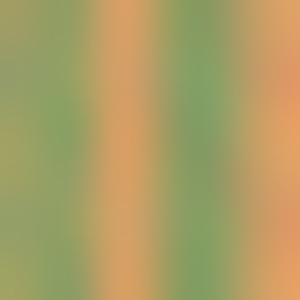

In [260]:
img = im.fromarray(noramalize(data[0]).astype('uint8'),'RGB')

basewidth = 300
wpercent = (basewidth / float(img.size[0]))
hsize = int((float(img.size[1]) * float(wpercent)))
img = img.resize((basewidth, hsize), im.LANCZOS)
img

In [202]:
import cv2

In [261]:
# an example code that works!

width = 1280
hieght = 720
channel = 3
 
fps = 30
sec = 5
 
# Syntax: VideoWriter_fourcc(c1, c2, c3, c4) # Concatenates 4 chars to a fourcc code
#  cv2.VideoWriter_fourcc('M','J','P','G') or cv2.VideoWriter_fourcc(*'MJPG)
 
fourcc = cv2.VideoWriter_fourcc(*'mp4v') # FourCC is a 4-byte code used to specify the video codec.
# A video codec is software or hardware that compresses and decompresses digital video. 
# In the context of video compression, codec is a portmanteau of encoder and decoder, 
# while a device that only compresses is typically called an encoder, and one that only 
# decompresses is a decoder. Source - Wikipedia
 
#Syntax: cv2.VideoWriter( filename, fourcc, fps, frameSize )
video = cv2.VideoWriter('test.mp4', fourcc, float(fps), (width, hieght))
 
for frame_count in range(fps*sec):
    img = np.random.randint(0,255, (hieght, width, channel), dtype = np.uint8)
    print(img.shape)
    print(img)
    video.write(img)

video.release()

(720, 1280, 3)
[[[212  13 192]
  [ 11 132 133]
  [129 115 193]
  ...
  [ 99 108 211]
  [ 35 117 221]
  [ 34  23  24]]

 [[160 218 167]
  [ 64 241  67]
  [239  43 163]
  ...
  [ 65 182  73]
  [ 15 147 202]
  [ 31 205  27]]

 [[ 86 249  93]
  [155  11 164]
  [196 220 165]
  ...
  [ 56 118  80]
  [ 64 175 145]
  [236 251  53]]

 ...

 [[188  85  65]
  [ 35 229  62]
  [216  22  44]
  ...
  [105  83 118]
  [121 151  14]
  [ 46  58 205]]

 [[133  29 228]
  [178 174  25]
  [ 30  75  50]
  ...
  [ 70 131 201]
  [163  71   2]
  [  9  29 192]]

 [[ 51 205 182]
  [132  18 124]
  [180 109 217]
  ...
  [143 221 218]
  [120 212 132]
  [140 185   0]]]
(720, 1280, 3)
[[[188  95  39]
  [186  79  38]
  [ 17  89 101]
  ...
  [ 36 126 202]
  [216 181 188]
  [123 219 226]]

 [[210 130  73]
  [244 235 218]
  [ 94 245 148]
  ...
  [ 60  50 174]
  [181  74  25]
  [ 18  63  55]]

 [[104  16  36]
  [118  97 215]
  [140 184 163]
  ...
  [210  87 110]
  [ 63 251 163]
  [141 193   0]]

 ...

 [[169 200 143]
  [243

(720, 1280, 3)
[[[221 246  65]
  [  9  26 217]
  [  4  52 102]
  ...
  [ 62  61 136]
  [ 11  26  47]
  [249 207 164]]

 [[ 45  88   8]
  [ 53  99 251]
  [ 71  12 228]
  ...
  [ 85 219  21]
  [ 24 247 147]
  [ 62 150  13]]

 [[236   6 113]
  [227 103  82]
  [ 88  20   1]
  ...
  [ 64  82 244]
  [164 245  44]
  [ 57 131 128]]

 ...

 [[ 76 145 231]
  [178 150  72]
  [252  56  89]
  ...
  [160  21 141]
  [189 165  88]
  [ 17 207   1]]

 [[ 36  17 104]
  [ 87  64  93]
  [225 176  66]
  ...
  [ 53 165  39]
  [  4 242  20]
  [164 228 120]]

 [[194 174  37]
  [158  13  17]
  [179 102 108]
  ...
  [197 204  42]
  [212 251 130]
  [215  85 118]]]
(720, 1280, 3)
[[[ 51  67 149]
  [  3   6 211]
  [ 26 200 198]
  ...
  [251 182  29]
  [237  95 189]
  [179 139 109]]

 [[162  62 239]
  [ 10  29 242]
  [ 96  26 246]
  ...
  [229 199 167]
  [192  37 221]
  [ 80 172 173]]

 [[ 35 224 217]
  [104 153  38]
  [ 80  93 108]
  ...
  [106  88  17]
  [142  68  84]
  [162  22 142]]

 ...

 [[177 195  52]
  [ 53

(720, 1280, 3)
[[[ 10 131  36]
  [193 173  11]
  [ 54  98 228]
  ...
  [ 82 103 183]
  [130 198 139]
  [ 28 170 168]]

 [[136  55 238]
  [193 195 130]
  [244  66 212]
  ...
  [102 192 163]
  [126 221  89]
  [137 191 121]]

 [[ 83 173 166]
  [ 12  53 200]
  [ 85 229  80]
  ...
  [228  44 165]
  [238 230 154]
  [ 55 204  65]]

 ...

 [[ 43 142 252]
  [ 60 131  21]
  [176  49 241]
  ...
  [ 14  80  83]
  [ 75   4 158]
  [105 174 211]]

 [[252 115  20]
  [183 245  55]
  [242  18  87]
  ...
  [217  29  32]
  [254 166  96]
  [160 126 121]]

 [[182 248  44]
  [104 246 184]
  [ 67 212 230]
  ...
  [202  34 197]
  [157  32 100]
  [ 39   9 253]]]
(720, 1280, 3)
[[[244 196 151]
  [151 144 120]
  [234  91 179]
  ...
  [ 69 187 168]
  [244  67  52]
  [  3 203 135]]

 [[128 152  99]
  [248 187 127]
  [141  58 171]
  ...
  [244   1  68]
  [181 251  26]
  [ 61 168  44]]

 [[139 146  86]
  [ 90 168  98]
  [173 219 193]
  ...
  [ 60 194  32]
  [ 24 209  12]
  [129  72 201]]

 ...

 [[ 16 252 108]
  [234

(720, 1280, 3)
[[[226 172 245]
  [ 31  99   1]
  [ 21  76 161]
  ...
  [240 238 182]
  [ 95  12  89]
  [233  93 161]]

 [[ 60 237 182]
  [197  93 159]
  [128 156 236]
  ...
  [189 219 121]
  [171 115 146]
  [ 62  74 220]]

 [[178   5 228]
  [209 116  23]
  [ 52 150  91]
  ...
  [162  96  65]
  [ 52 140 122]
  [ 12 104 214]]

 ...

 [[217  41 252]
  [194 134 147]
  [ 15 119 134]
  ...
  [129  26 212]
  [193 177  15]
  [ 62   7  56]]

 [[136 232  91]
  [ 32  23 198]
  [ 71 113 160]
  ...
  [179  59 168]
  [113   6 208]
  [222 228 172]]

 [[ 53  27 222]
  [215  23   9]
  [ 96 216 233]
  ...
  [135  41 238]
  [ 56 104  45]
  [175  14  25]]]
(720, 1280, 3)
[[[127  90  23]
  [ 41 111   2]
  [104 209 173]
  ...
  [199   9   5]
  [145 169  62]
  [166   0 217]]

 [[ 61  53  94]
  [102 250 123]
  [ 27 118 158]
  ...
  [235  62 153]
  [ 94 122 213]
  [210  32  72]]

 [[243 193 120]
  [ 70 104 152]
  [ 25 212 181]
  ...
  [ 97  15 147]
  [105 244 232]
  [ 47  34   1]]

 ...

 [[239 161 201]
  [200

(720, 1280, 3)
[[[ 20 193 164]
  [223  47  89]
  [199 231 138]
  ...
  [128  14 223]
  [107  38   2]
  [167 231 242]]

 [[  4  84  90]
  [136  71 125]
  [ 60 178  13]
  ...
  [ 41  24  80]
  [ 89 139  19]
  [ 61 249 239]]

 [[ 41 244  65]
  [ 97  65 201]
  [ 49 142 139]
  ...
  [175 243 107]
  [ 95   6  24]
  [159 164 122]]

 ...

 [[ 95 113 231]
  [245 165 173]
  [232  21 130]
  ...
  [172 173 183]
  [183  39  11]
  [ 15  29  43]]

 [[ 24 191  55]
  [ 92  72  21]
  [179  85  68]
  ...
  [135 243 245]
  [ 26 101  13]
  [248 213 163]]

 [[ 40 172  16]
  [ 36 225 169]
  [177  16 236]
  ...
  [  1 100 157]
  [ 23 157 169]
  [109  55  99]]]
(720, 1280, 3)
[[[235  19 135]
  [ 75 118  36]
  [251 229 176]
  ...
  [229  28 105]
  [137 172 215]
  [ 50 213 188]]

 [[197  24 245]
  [  7 145  97]
  [ 80 216  38]
  ...
  [131 210 247]
  [  8  75 125]
  [203  50  65]]

 [[173 114 194]
  [178 251   6]
  [167 156 191]
  ...
  [133  83  88]
  [ 34 110 253]
  [ 91 172 150]]

 ...

 [[160  59 160]
  [ 38

(720, 1280, 3)
[[[121  95 228]
  [104  72 193]
  [174  19 208]
  ...
  [ 23 211 253]
  [233  15  39]
  [121  45  40]]

 [[ 47 187 220]
  [189  40 140]
  [ 45 229 220]
  ...
  [110  22 154]
  [ 43 233  71]
  [ 30  94  32]]

 [[ 10  57  24]
  [ 32 222 132]
  [231  57 211]
  ...
  [241  68 233]
  [ 31  19 108]
  [ 61  62 168]]

 ...

 [[203  89 150]
  [128 223 253]
  [104  22  42]
  ...
  [223 217  13]
  [202  93 101]
  [ 45  98 161]]

 [[157 155  32]
  [ 52 149 108]
  [109  28   2]
  ...
  [154  94  91]
  [ 87 178 192]
  [249 156 225]]

 [[ 47  39  23]
  [106 116  85]
  [  6  37  26]
  ...
  [  1 221 119]
  [131 154 196]
  [132  21 218]]]
(720, 1280, 3)
[[[211 131  29]
  [ 57 252 205]
  [174  10 183]
  ...
  [ 78 248 162]
  [155  40 180]
  [188   1  32]]

 [[ 97  12 164]
  [ 33 163 144]
  [203  50  89]
  ...
  [ 85  23 144]
  [233 216 206]
  [119 194  63]]

 [[135 221 199]
  [135 214 185]
  [ 19 176 136]
  ...
  [251 123  10]
  [206  21  50]
  [152 213 243]]

 ...

 [[176 234   1]
  [ 51

(720, 1280, 3)
[[[219 146 156]
  [111  67 231]
  [186  85 126]
  ...
  [207  66 252]
  [ 18 159  90]
  [ 78 180  12]]

 [[100  86 106]
  [127 151 170]
  [ 53 125  54]
  ...
  [ 77 142   1]
  [227 179 126]
  [193 163 248]]

 [[ 44 174 101]
  [ 42  90 134]
  [207 191  25]
  ...
  [ 93 221  26]
  [ 64  16 221]
  [242 238  53]]

 ...

 [[119 163  81]
  [204  69 130]
  [135 148  98]
  ...
  [ 84  59 171]
  [ 26 175 229]
  [178 191 182]]

 [[ 91 106 204]
  [247 212  33]
  [234  61  26]
  ...
  [ 13 230 113]
  [ 20  77  78]
  [225 206 102]]

 [[126 138  96]
  [225   2 115]
  [136  27 152]
  ...
  [243 219 228]
  [ 93 172 109]
  [ 48  85  43]]]
(720, 1280, 3)
[[[ 44 163 215]
  [ 72 113 252]
  [ 81 112  69]
  ...
  [108 128 135]
  [ 96 132  52]
  [250 117  36]]

 [[  8   7 123]
  [120   5 183]
  [246 145 161]
  ...
  [193 233 127]
  [ 22 158  67]
  [223 236  77]]

 [[ 57   8  57]
  [102 205 234]
  [ 24  60 220]
  ...
  [139  56 149]
  [ 15 206 106]
  [ 61 135 216]]

 ...

 [[ 96 128 202]
  [ 46

(720, 1280, 3)
[[[ 99 149 146]
  [149  18  41]
  [ 76 180  82]
  ...
  [206  70  46]
  [ 65  94  85]
  [ 25  52 112]]

 [[117  54  85]
  [189 131 194]
  [137 254 114]
  ...
  [193 192 205]
  [187   1 114]
  [133 223 101]]

 [[ 79 122  73]
  [102 219 179]
  [209 120 110]
  ...
  [160  66   8]
  [ 95  98 238]
  [243  43 169]]

 ...

 [[ 30 142  49]
  [196  38 159]
  [221  22 176]
  ...
  [240  58  11]
  [109   1  32]
  [ 94 190 161]]

 [[186  59 148]
  [ 14  21 191]
  [192 146  80]
  ...
  [ 61  50  52]
  [  1 182 128]
  [ 80 128 170]]

 [[222  61 160]
  [237  11  37]
  [206  82 109]
  ...
  [ 29  17 181]
  [ 58 225  51]
  [205  39  44]]]
(720, 1280, 3)
[[[205 233  35]
  [ 85 140 253]
  [ 14  45 124]
  ...
  [194 100 145]
  [235 113 244]
  [129  77 102]]

 [[ 64  37 108]
  [ 60   6  89]
  [173 216 243]
  ...
  [168 190 145]
  [203 105  49]
  [230 203 183]]

 [[180 196 245]
  [195 234 229]
  [ 10  13 206]
  ...
  [145  84 217]
  [153  43  91]
  [113  66 104]]

 ...

 [[220 149 112]
  [201

(720, 1280, 3)
[[[121  93 186]
  [ 55  46  36]
  [ 91 236 102]
  ...
  [ 69  27 190]
  [174 199 225]
  [ 71 236 166]]

 [[ 27 196 121]
  [217 152 155]
  [223 210  65]
  ...
  [ 51  72 209]
  [ 16  37 155]
  [ 71  51 173]]

 [[218  66  88]
  [130  64 109]
  [229 184  71]
  ...
  [ 96  30  36]
  [102  54 208]
  [212 222 155]]

 ...

 [[242 223 139]
  [227  70 120]
  [226 197   9]
  ...
  [146 165 214]
  [ 12  59  67]
  [248 227 115]]

 [[ 91  17  19]
  [ 50   9 190]
  [  3 242 178]
  ...
  [ 87 206 230]
  [115  69 227]
  [  6 237 165]]

 [[245 192 204]
  [ 87 160 211]
  [121 176  16]
  ...
  [163  11 102]
  [144   5  75]
  [ 25 110 131]]]
(720, 1280, 3)
[[[130 219  70]
  [244  76 169]
  [ 38  17  37]
  ...
  [131 177 248]
  [ 45  53 144]
  [  5 164 111]]

 [[110 190  56]
  [ 87  23 115]
  [ 77  89 126]
  ...
  [100  42 102]
  [ 53  88 123]
  [101  36 212]]

 [[195 232  60]
  [ 51  59  99]
  [ 72 250 231]
  ...
  [155 246 248]
  [189 241 236]
  [140 225  49]]

 ...

 [[ 45 209  66]
  [  1

In [223]:
np.random.randint(0,255, (hieght, width, channel)).shape
g.combined_data()[0].shape
print(normalize(g.combined_data()[0]).astype(np.uint8))

[[[156 157 100]
  [152 158  99]
  [215 159 102]
  [149 157  96]
  [153 154 100]
  [212 159 102]]

 [[147 157 104]
  [155 161 100]
  [211 158 103]
  [148 158 101]
  [149 159 101]
  [211 153 102]]

 [[153 161  99]
  [144 159  98]
  [215 158 100]
  [147 154  98]
  [149 159 103]
  [217 159 100]]

 [[156 161 100]
  [152 158 102]
  [215 159 100]
  [149 157  98]
  [153 153 100]
  [212 159 102]]

 [[147 159 103]
  [155 160  98]
  [211 161 103]
  [150 157  99]
  [150 159 100]
  [211 153 101]]

 [[154 161  99]
  [145 157 100]
  [215 159 100]
  [147 156  96]
  [150 159 100]
  [217 159 100]]]


In [267]:
width = 600
height = 600
channel = 3

fps = g.timestamps.size/12.0

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video = cv2.VideoWriter('g2.mp4', fourcc, float(fps), (width, height))
 
for d in g.combined_data():
    img = normalize(d).astype(np.uint8)
    img = img.repeat(100, 0).repeat(100, 1)
    print(img.shape)
    print(img)
    video.write(img)

video.release()

(600, 600, 3)
[[[157 158 100]
  [157 158 100]
  [157 158 100]
  ...
  [218 186 101]
  [218 186 101]
  [218 186 101]]

 [[157 158 100]
  [157 158 100]
  [157 158 100]
  ...
  [218 186 101]
  [218 186 101]
  [218 186 101]]

 [[157 158 100]
  [157 158 100]
  [157 158 100]
  ...
  [218 186 101]
  [218 186 101]
  [218 186 101]]

 ...

 [[154 162  99]
  [154 162  99]
  [154 162  99]
  ...
  [212 158 100]
  [212 158 100]
  [212 158 100]]

 [[154 162  99]
  [154 162  99]
  [154 162  99]
  ...
  [212 158 100]
  [212 158 100]
  [212 158 100]]

 [[154 162  99]
  [154 162  99]
  [154 162  99]
  ...
  [212 158 100]
  [212 158 100]
  [212 158 100]]]
(600, 600, 3)
[[[148 157  99]
  [148 157  99]
  [148 157  99]
  ...
  [241 157 106]
  [241 157 106]
  [241 157 106]]

 [[148 157  99]
  [148 157  99]
  [148 157  99]
  ...
  [241 157 106]
  [241 157 106]
  [241 157 106]]

 [[148 157  99]
  [148 157  99]
  [148 157  99]
  ...
  [241 157 106]
  [241 157 106]
  [241 157 106]]

 ...

 [[148 160  97]
  [148 1

(600, 600, 3)
[[[151 157 100]
  [151 157 100]
  [151 157 100]
  ...
  [197 148  96]
  [197 148  96]
  [197 148  96]]

 [[151 157 100]
  [151 157 100]
  [151 157 100]
  ...
  [197 148  96]
  [197 148  96]
  [197 148  96]]

 [[151 157 100]
  [151 157 100]
  [151 157 100]
  ...
  [197 148  96]
  [197 148  96]
  [197 148  96]]

 ...

 [[148 156 101]
  [148 156 101]
  [148 156 101]
  ...
  [218 157  99]
  [218 157  99]
  [218 157  99]]

 [[148 156 101]
  [148 156 101]
  [148 156 101]
  ...
  [218 157  99]
  [218 157  99]
  [218 157  99]]

 [[148 156 101]
  [148 156 101]
  [148 156 101]
  ...
  [218 157  99]
  [218 157  99]
  [218 157  99]]]
(600, 600, 3)
[[[141 157 100]
  [141 157 100]
  [141 157 100]
  ...
  [232 160 108]
  [232 160 108]
  [232 160 108]]

 [[141 157 100]
  [141 157 100]
  [141 157 100]
  ...
  [232 160 108]
  [232 160 108]
  [232 160 108]]

 [[141 157 100]
  [141 157 100]
  [141 157 100]
  ...
  [232 160 108]
  [232 160 108]
  [232 160 108]]

 ...

 [[145 156  99]
  [145 1

(600, 600, 3)
[[[147 159 103]
  [147 159 103]
  [147 159 103]
  ...
  [215 162 103]
  [215 162 103]
  [215 162 103]]

 [[147 159 103]
  [147 159 103]
  [147 159 103]
  ...
  [215 162 103]
  [215 162 103]
  [215 162 103]]

 [[147 159 103]
  [147 159 103]
  [147 159 103]
  ...
  [215 162 103]
  [215 162 103]
  [215 162 103]]

 ...

 [[157 160  99]
  [157 160  99]
  [157 160  99]
  ...
  [218 174  99]
  [218 174  99]
  [218 174  99]]

 [[157 160  99]
  [157 160  99]
  [157 160  99]
  ...
  [218 174  99]
  [218 174  99]
  [218 174  99]]

 [[157 160  99]
  [157 160  99]
  [157 160  99]
  ...
  [218 174  99]
  [218 174  99]
  [218 174  99]]]
(600, 600, 3)
[[[116 158  98]
  [116 158  98]
  [116 158  98]
  ...
  [224 149 111]
  [224 149 111]
  [224 149 111]]

 [[116 158  98]
  [116 158  98]
  [116 158  98]
  ...
  [224 149 111]
  [224 149 111]
  [224 149 111]]

 [[116 158  98]
  [116 158  98]
  [116 158  98]
  ...
  [224 149 111]
  [224 149 111]
  [224 149 111]]

 ...

 [[147 158  98]
  [147 1

(600, 600, 3)
[[[215 158 101]
  [215 158 101]
  [215 158 101]
  ...
  [139 140 100]
  [139 140 100]
  [139 140 100]]

 [[215 158 101]
  [215 158 101]
  [215 158 101]
  ...
  [139 140 100]
  [139 140 100]
  [139 140 100]]

 [[215 158 101]
  [215 158 101]
  [215 158 101]
  ...
  [139 140 100]
  [139 140 100]
  [139 140 100]]

 ...

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [133 192 121]
  [133 192 121]
  [133 192 121]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [133 192 121]
  [133 192 121]
  [133 192 121]]

 [[218 157  99]
  [218 157  99]
  [218 157  99]
  ...
  [133 192 121]
  [133 192 121]
  [133 192 121]]]
(600, 600, 3)
[[[232 158 100]
  [232 158 100]
  [232 158 100]
  ...
  [198 160 108]
  [198 160 108]
  [198 160 108]]

 [[232 158 100]
  [232 158 100]
  [232 158 100]
  ...
  [198 160 108]
  [198 160 108]
  [198 160 108]]

 [[232 158 100]
  [232 158 100]
  [232 158 100]
  ...
  [198 160 108]
  [198 160 108]
  [198 160 108]]

 ...

 [[236 157 102]
  [236 1

(600, 600, 3)
[[[214 159 102]
  [214 159 102]
  [214 159 102]
  ...
  [122 165  97]
  [122 165  97]
  [122 165  97]]

 [[214 159 102]
  [214 159 102]
  [214 159 102]
  ...
  [122 165  97]
  [122 165  97]
  [122 165  97]]

 [[214 159 102]
  [214 159 102]
  [214 159 102]
  ...
  [122 165  97]
  [122 165  97]
  [122 165  97]]

 ...

 [[218 174  98]
  [218 174  98]
  [218 174  98]
  ...
  [153 162  94]
  [153 162  94]
  [153 162  94]]

 [[218 174  98]
  [218 174  98]
  [218 174  98]
  ...
  [153 162  94]
  [153 162  94]
  [153 162  94]]

 [[218 174  98]
  [218 174  98]
  [218 174  98]
  ...
  [153 162  94]
  [153 162  94]
  [153 162  94]]]
(600, 600, 3)
[[[232 158 101]
  [232 158 101]
  [232 158 101]
  ...
  [193 155 103]
  [193 155 103]
  [193 155 103]]

 [[232 158 101]
  [232 158 101]
  [232 158 101]
  ...
  [193 155 103]
  [193 155 103]
  [193 155 103]]

 [[232 158 101]
  [232 158 101]
  [232 158 101]
  ...
  [193 155 103]
  [193 155 103]
  [193 155 103]]

 ...

 [[241 157 105]
  [241 1

(600, 600, 3)
[[[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 156  98]
  [157 156  98]
  [157 156  98]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 156  98]
  [157 156  98]
  [157 156  98]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 156  98]
  [157 156  98]
  [157 156  98]]

 ...

 [[201 142  97]
  [201 142  97]
  [201 142  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]

 [[201 142  97]
  [201 142  97]
  [201 142  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]

 [[201 142  97]
  [201 142  97]
  [201 142  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]]
(600, 600, 3)
[[[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 [[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 [[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 ...

 [[233 160 108]
  [233 1

(600, 600, 3)
[[[212 159 101]
  [212 159 101]
  [212 159 101]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 [[212 159 101]
  [212 159 101]
  [212 159 101]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 [[212 159 101]
  [212 159 101]
  [212 159 101]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 ...

 [[215 161 101]
  [215 161 101]
  [215 161 101]
  ...
  [133 157  93]
  [133 157  93]
  [133 157  93]]

 [[215 161 101]
  [215 161 101]
  [215 161 101]
  ...
  [133 157  93]
  [133 157  93]
  [133 157  93]]

 [[215 161 101]
  [215 161 101]
  [215 161 101]
  ...
  [133 157  93]
  [133 157  93]
  [133 157  93]]]
(600, 600, 3)
[[[227 158 100]
  [227 158 100]
  [227 158 100]
  ...
  [194 156  99]
  [194 156  99]
  [194 156  99]]

 [[227 158 100]
  [227 158 100]
  [227 158 100]
  ...
  [194 156  99]
  [194 156  99]
  [194 156  99]]

 [[227 158 100]
  [227 158 100]
  [227 158 100]
  ...
  [194 156  99]
  [194 156  99]
  [194 156  99]]

 ...

 [[227 151 111]
  [227 1

(600, 600, 3)
[[[194 157 100]
  [194 157 100]
  [194 157 100]
  ...
  [117 159  97]
  [117 159  97]
  [117 159  97]]

 [[194 157 100]
  [194 157 100]
  [194 157 100]
  ...
  [117 159  97]
  [117 159  97]
  [117 159  97]]

 [[194 157 100]
  [194 157 100]
  [194 157 100]
  ...
  [117 159  97]
  [117 159  97]
  [117 159  97]]

 ...

 [[192 158 108]
  [192 158 108]
  [192 158 108]
  ...
  [148 155 100]
  [148 155 100]
  [148 155 100]]

 [[192 158 108]
  [192 158 108]
  [192 158 108]
  ...
  [148 155 100]
  [148 155 100]
  [148 155 100]]

 [[192 158 108]
  [192 158 108]
  [192 158 108]
  ...
  [148 155 100]
  [148 155 100]
  [148 155 100]]]
(600, 600, 3)
[[[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [136 197 132]
  [136 197 132]
  [136 197 132]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [136 197 132]
  [136 197 132]
  [136 197 132]]

 [[217 157 101]
  [217 157 101]
  [217 157 101]
  ...
  [136 197 132]
  [136 197 132]
  [136 197 132]]

 ...

 [[213 159 100]
  [213 1

(600, 600, 3)
[[[150 158 100]
  [150 158 100]
  [150 158 100]
  ...
  [151 158 101]
  [151 158 101]
  [151 158 101]]

 [[150 158 100]
  [150 158 100]
  [150 158 100]
  ...
  [151 158 101]
  [151 158 101]
  [151 158 101]]

 [[150 158 100]
  [150 158 100]
  [150 158 100]
  ...
  [151 158 101]
  [151 158 101]
  [151 158 101]]

 ...

 [[132 157  93]
  [132 157  93]
  [132 157  93]
  ...
  [151 157 100]
  [151 157 100]
  [151 157 100]]

 [[132 157  93]
  [132 157  93]
  [132 157  93]
  ...
  [151 157 100]
  [151 157 100]
  [151 157 100]]

 [[132 157  93]
  [132 157  93]
  [132 157  93]
  ...
  [151 157 100]
  [151 157 100]
  [151 157 100]]]
(600, 600, 3)
[[[193 159 102]
  [193 159 102]
  [193 159 102]
  ...
  [146 157  99]
  [146 157  99]
  [146 157  99]]

 [[193 159 102]
  [193 159 102]
  [193 159 102]
  ...
  [146 157  99]
  [146 157  99]
  [146 157  99]]

 [[193 159 102]
  [193 159 102]
  [193 159 102]
  ...
  [146 157  99]
  [146 157  99]
  [146 157  99]]

 ...

 [[193 156 103]
  [193 1

(600, 600, 3)
[[[144 160  99]
  [144 160  99]
  [144 160  99]
  ...
  [154 161 100]
  [154 161 100]
  [154 161 100]]

 [[144 160  99]
  [144 160  99]
  [144 160  99]
  ...
  [154 161 100]
  [154 161 100]
  [154 161 100]]

 [[144 160  99]
  [144 160  99]
  [144 160  99]
  ...
  [154 161 100]
  [154 161 100]
  [154 161 100]]

 ...

 [[157 155 100]
  [157 155 100]
  [157 155 100]
  ...
  [147 157 101]
  [147 157 101]
  [147 157 101]]

 [[157 155 100]
  [157 155 100]
  [157 155 100]
  ...
  [147 157 101]
  [147 157 101]
  [147 157 101]]

 [[157 155 100]
  [157 155 100]
  [157 155 100]
  ...
  [147 157 101]
  [147 157 101]
  [147 157 101]]]
(600, 600, 3)
[[[191 159  99]
  [191 159  99]
  [191 159  99]
  ...
  [149 159  94]
  [149 159  94]
  [149 159  94]]

 [[191 159  99]
  [191 159  99]
  [191 159  99]
  ...
  [149 159  94]
  [149 159  94]
  [149 159  94]]

 [[191 159  99]
  [191 159  99]
  [191 159  99]
  ...
  [149 159  94]
  [149 159  94]
  [149 159  94]]

 ...

 [[194 158 101]
  [194 1

(600, 600, 3)
[[[192 159 102]
  [192 159 102]
  [192 159 102]
  ...
  [145 156  99]
  [145 156  99]
  [145 156  99]]

 [[192 159 102]
  [192 159 102]
  [192 159 102]
  ...
  [145 156  99]
  [145 156  99]
  [145 156  99]]

 [[192 159 102]
  [192 159 102]
  [192 159 102]
  ...
  [145 156  99]
  [145 156  99]
  [145 156  99]]

 ...

 [[193 157  99]
  [193 157  99]
  [193 157  99]
  ...
  [145 156  97]
  [145 156  97]
  [145 156  97]]

 [[193 157  99]
  [193 157  99]
  [193 157  99]
  ...
  [145 156  97]
  [145 156  97]
  [145 156  97]]

 [[193 157  99]
  [193 157  99]
  [193 157  99]
  ...
  [145 156  97]
  [145 156  97]
  [145 156  97]]]
(600, 600, 3)
[[[214 159 101]
  [214 159 101]
  [214 159 101]
  ...
  [126 166  97]
  [126 166  97]
  [126 166  97]]

 [[214 159 101]
  [214 159 101]
  [214 159 101]
  ...
  [126 166  97]
  [126 166  97]
  [126 166  97]]

 [[214 159 101]
  [214 159 101]
  [214 159 101]
  ...
  [126 166  97]
  [126 166  97]
  [126 166  97]]

 ...

 [[218 174  98]
  [218 1

(600, 600, 3)
[[[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 155  99]
  [157 155  99]
  [157 155  99]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 155  99]
  [157 155  99]
  [157 155  99]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [157 155  99]
  [157 155  99]
  [157 155  99]]

 ...

 [[201 143  97]
  [201 143  97]
  [201 143  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]

 [[201 143  97]
  [201 143  97]
  [201 143  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]

 [[201 143  97]
  [201 143  97]
  [201 143  97]
  ...
  [139 143 100]
  [139 143 100]
  [139 143 100]]]
(600, 600, 3)
[[[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 [[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 [[229 158 102]
  [229 158 102]
  [229 158 102]
  ...
  [195 158 100]
  [195 158 100]
  [195 158 100]]

 ...

 [[233 160 108]
  [233 1

(600, 600, 3)
[[[194 159  99]
  [194 159  99]
  [194 159  99]
  ...
  [142 158 101]
  [142 158 101]
  [142 158 101]]

 [[194 159  99]
  [194 159  99]
  [194 159  99]
  ...
  [142 158 101]
  [142 158 101]
  [142 158 101]]

 [[194 159  99]
  [194 159  99]
  [194 159  99]
  ...
  [142 158 101]
  [142 158 101]
  [142 158 101]]

 ...

 [[192 156 105]
  [192 156 105]
  [192 156 105]
  ...
  [144 157  99]
  [144 157  99]
  [144 157  99]]

 [[192 156 105]
  [192 156 105]
  [192 156 105]
  ...
  [144 157  99]
  [144 157  99]
  [144 157  99]]

 [[192 156 105]
  [192 156 105]
  [192 156 105]
  ...
  [144 157  99]
  [144 157  99]
  [144 157  99]]]
(600, 600, 3)
[[[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 [[212 159 100]
  [212 159 100]
  [212 159 100]
  ...
  [151 158 102]
  [151 158 102]
  [151 158 102]]

 ...

 [[215 161 101]
  [215 1

[[[180. 159. 101.]
  [180. 159. 101.]
  [180. 159. 101.]
  ...
  [181. 158. 101.]
  [181. 158. 101.]
  [181. 158. 101.]]

 [[180. 159. 101.]
  [180. 159. 101.]
  [180. 159. 101.]
  ...
  [181. 158. 101.]
  [181. 158. 101.]
  [181. 158. 101.]]

 [[180. 159. 101.]
  [180. 159. 101.]
  [180. 159. 101.]
  ...
  [181. 158. 101.]
  [181. 158. 101.]
  [181. 158. 101.]]

 ...

 [[180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]
  ...
  [180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]]

 [[180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]
  ...
  [180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]]

 [[180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]
  ...
  [180. 158. 101.]
  [180. 158. 101.]
  [180. 158. 101.]]]


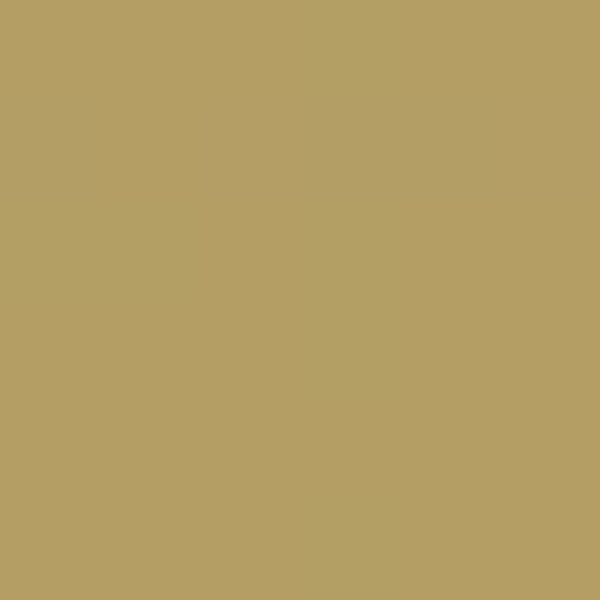

In [295]:


avg_data = sum(data)/len(data)
avg_data_100 = avg_data.repeat(100, 0).repeat(100, 1)
print(np.round(normalize(avg_data_100)))

img = im.fromarray(normalize(avg_data_100).astype('uint8'),'RGB')
img
# print(img)
# basewidth = 600
# wpercent = (basewidth / float(img.size[0]))
# hsize = int((float(img.size[1]) * float(wpercent)))
# img = img.resize((basewidth, hsize), im.LANCZOS)
# img

In [200]:
import imageio

In [201]:
# writer = imageio.get_writer('all_channels.mp4', fps=30)
# writer_shearx = imageio.get_writer('shear_x.mp4', fps=30)
# writer_sheary = imageio.get_writer('shear_y.mp4', fps=30)
# writer_pressure = imageio.get_writer('pressure.mp4', fps=30)


# for instance in data:
#     img = im.fromarray(normalize(instance).astype('uint8'),'RGB')
#     img = img.resize((basewidth, hsize), im.LANCZOS)
#     pressure, shear_x, shear_y = img.split()
    
#     writer.append_data(np.array(img))
#     writer_pressure.append_data(np.array(pressure))
#     writer_shearx.append_data(np.array(shear_x))
#     writer_sheary.append_data(np.array(shear_y))

# writer.close()
# writer_pressure.close()
# writer_shearx.close()
# writer_sheary.close()

FileNotFoundError: [Errno 2] No such file or directory: '/usr/bin/ffmpeg'

# 3D CNN for video classification

Follow tutorial: https://www.tensorflow.org/tutorials/video/video_classification

In [ ]:
import tqdm
import random
import pathlib
import itertools
import collections

import cv2
import einops
import numpy as np
import remotezip as rz
import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf
import keras
from keras import layers

In [ ]:
def list_files_per_class(zip_url):
    """
    List the files in each class of the dataset given the zip URL.

    Args:
      zip_url: URL from which the files can be unzipped. 

    Return:
      files: List of files in each of the classes.
    """
    files = []
    with rz.RemoteZip(URL) as zip:
        for zip_info in zip.infolist():
            files.append(zip_info.filename)
    return files

def get_class(fname):
  """
    Retrieve the name of the class given a filename.

    Args:
      fname: Name of the file in the UCF101 dataset.

    Return:
      Class that the file belongs to.
  """
  return fname.split('_')[-3]

def get_files_per_class(files):
  """
    Retrieve the files that belong to each class. 

    Args:
      files: List of files in the dataset.

    Return:
      Dictionary of class names (key) and files (values).
  """
    files_for_class = collections.defaultdict(list)
    for fname in files:
        class_name = get_class(fname)
        files_for_class[class_name].append(fname)
    return files_for_class

def download_from_zip(zip_url, to_dir, file_names):
    """
    Download the contents of the zip file from the zip URL.

    Args:
      zip_url: Zip URL containing data.
      to_dir: Directory to download data to.
      file_names: Names of files to download.
    """
    with rz.RemoteZip(zip_url) as zip:
        for fn in tqdm.tqdm(file_names):
            class_name = get_class(fn)
            zip.extract(fn, str(to_dir / class_name))
            unzipped_file = to_dir / class_name / fn

            fn = pathlib.Path(fn).parts[-1]
            output_file = to_dir / class_name / fn
            unzipped_file.rename(output_file,)

def split_class_lists(files_for_class, count):
    """
    Returns the list of files belonging to a subset of data as well as the remainder of
    files that need to be downloaded.

    Args:
      files_for_class: Files belonging to a particular class of data.
      count: Number of files to download.

    Return:
      split_files: Files belonging to the subset of data.
      remainder: Dictionary of the remainder of files that need to be downloaded.
    """
    split_files = []
    remainder = {}
    for cls in files_for_class:
        split_files.extend(files_for_class[cls][:count])
        remainder[cls] = files_for_class[cls][count:]
    return split_files, remainder

def download_ufc_101_subset(zip_url, num_classes, splits, download_dir):
    """
    Download a subset of the UFC101 dataset and split them into various parts, such as
    training, validation, and test. 

    Args:
      zip_url: Zip URL containing data.
      num_classes: Number of labels.
      splits: Dictionary specifying the training, validation, test, etc. (key) division of data 
              (value is number of files per split).
      download_dir: Directory to download data to.

    Return:
      dir: Posix path of the resulting directories containing the splits of data.
    """
    files = list_files_per_class(zip_url)
    for f in files:
        tokens = f.split('/')
        if len(tokens) <= 2:
            files.remove(f) # Remove that item from the list if it does not have a filename

    files_for_class = get_files_per_class(files)

    classes = list(files_for_class.keys())[:num_classes]

    for cls in classes:
        new_files_for_class = files_for_class[cls]
        random.shuffle(new_files_for_class)
        files_for_class[cls] = new_files_for_class

    # Only use the number of classes you want in the dictionary
    files_for_class = {x: files_for_class[x] for x in list(files_for_class)[:num_classes]}

    dirs = {}
    for split_name, split_count in splits.items():
        print(split_name, ":")
        split_dir = download_dir / split_name
        split_files, files_for_class = split_class_lists(files_for_class, split_count)
        download_from_zip(zip_url, split_dir, split_files)
        dirs[split_name] = split_dir
        
    return dirs

def format_frames(frame, output_size):
    """
    Pad and resize an image from a video.

    Args:
      frame: Image that needs to resized and padded. 
      output_size: Pixel size of the output frame image.

    Return:
      Formatted frame with padding of specified output size.
    """
    frame = tf.image.convert_image_dtype(frame, tf.float32)
    frame = tf.image.resize_with_pad(frame, *output_size)
    return frame

def frames_from_video_file(video_path, n_frames, output_size = (224,224), frame_step = 15):
    """
    Creates frames from each video file present for each category.

    Args:
      video_path: File path to the video.
      n_frames: Number of frames to be created per video file.
      output_size: Pixel size of the output frame image.

    Return:
      An NumPy array of frames in the shape of (n_frames, height, width, channels).
    """
    # Read each video frame by frame
    result = []
    src = cv2.VideoCapture(str(video_path))  

    video_length = src.get(cv2.CAP_PROP_FRAME_COUNT)

    need_length = 1 + (n_frames - 1) * frame_step

    if need_length > video_length:
        start = 0
    else:
        max_start = video_length - need_length
        start = random.randint(0, max_start + 1)

    src.set(cv2.CAP_PROP_POS_FRAMES, start)
    # ret is a boolean indicating whether read was successful, frame is the image itself
    ret, frame = src.read()
    result.append(format_frames(frame, output_size))

    for _ in range(n_frames - 1):
        for _ in range(frame_step):
            ret, frame = src.read()
        if ret:
            frame = format_frames(frame, output_size)
            result.append(frame)
        else:
            result.append(np.zeros_like(result[0]))
    src.release()
    result = np.array(result)[..., [2, 1, 0]]

    return result

class FrameGenerator:
    def __init__(self, path, n_frames, training = False):
    """ Returns a set of frames with their associated label. 

      Args:
        path: Video file paths.
        n_frames: Number of frames. 
        training: Boolean to determine if training dataset is being created.
    """
        self.path = path
        self.n_frames = n_frames
        self.training = training
        self.class_names = sorted(set(p.name for p in self.path.iterdir() if p.is_dir()))
        self.class_ids_for_name = dict((name, idx) for idx, name in enumerate(self.class_names))

    def get_files_and_class_names(self):
        video_paths = list(self.path.glob('*/*.avi'))
        classes = [p.parent.name for p in video_paths] 
        return video_paths, classes

    def __call__(self):
        video_paths, classes = self.get_files_and_class_names()

        pairs = list(zip(video_paths, classes))

        if self.training:
            random.shuffle(pairs)

        for path, name in pairs:
            video_frames = frames_from_video_file(path, self.n_frames) 
            label = self.class_ids_for_name[name] # Encode labels
            yield video_frames, label

In [ ]:
URL = 'https://storage.googleapis.com/thumos14_files/UCF101_videos.zip'
download_dir = pathlib.Path('./UCF101_subset/')
subset_paths = download_ufc_101_subset(URL, 
                        num_classes = 10, 
                        splits = {"train": 30, "val": 10, "test": 10},
                        download_dir = download_dir)

In [ ]:
n_frames = 10
batch_size = 8

output_signature = (tf.TensorSpec(shape = (None, None, None, 3), dtype = tf.float32),
                    tf.TensorSpec(shape = (), dtype = tf.int16))

train_ds = tf.data.Dataset.from_generator(FrameGenerator(subset_paths['train'], n_frames, training=True),
                                          output_signature = output_signature)


# Batch the data
train_ds = train_ds.batch(batch_size)

val_ds = tf.data.Dataset.from_generator(FrameGenerator(subset_paths['val'], n_frames),
                                        output_signature = output_signature)
val_ds = val_ds.batch(batch_size)

test_ds = tf.data.Dataset.from_generator(FrameGenerator(subset_paths['test'], n_frames),
                                         output_signature = output_signature)

test_ds = test_ds.batch(batch_size)

In [ ]:
# Define the dimensions of one frame in the set of frames created
HEIGHT = 224
WIDTH = 224

In [ ]:
class Conv2Plus1D(keras.layers.Layer):
    def __init__(self, filters, kernel_size, padding):
    """
      A sequence of convolutional layers that first apply the convolution operation over the
      spatial dimensions, and then the temporal dimension. 
    """
    super().__init__()
    self.seq = keras.Sequential([  
        # Spatial decomposition
        layers.Conv3D(filters=filters,
                      kernel_size=(1, kernel_size[1], kernel_size[2]),
                      padding=padding),
        # Temporal decomposition
        layers.Conv3D(filters=filters, 
                      kernel_size=(kernel_size[0], 1, 1),
                      padding=padding)
        ])

    def call(self, x):
        return self.seq(x)

In [ ]:
class ResidualMain(keras.layers.Layer):
    """
    Residual block of the model with convolution, layer normalization, and the
    activation function, ReLU.
    """
    def __init__(self, filters, kernel_size):
        super().__init__()
        self.seq = keras.Sequential([
            Conv2Plus1D(filters=filters,
                        kernel_size=kernel_size,
                        padding='same'),
            layers.LayerNormalization(),
            layers.ReLU(),
            Conv2Plus1D(filters=filters, 
                        kernel_size=kernel_size,
                        padding='same'),
            layers.LayerNormalization()
        ])

    def call(self, x):
        return self.seq(x)

In [ ]:
class Project(keras.layers.Layer):
    """
    Project certain dimensions of the tensor as the data is passed through different 
    sized filters and downsampled. 
    """
    def __init__(self, units):
        super().__init__()
        self.seq = keras.Sequential([
            layers.Dense(units),
            layers.LayerNormalization()
        ])

    def call(self, x):
        return self.seq(x)

In [ ]:
def add_residual_block(input, filters, kernel_size):
    """
    Add residual blocks to the model. If the last dimensions of the input data
    and filter size does not match, project it such that last dimension matches.
    """
    out = ResidualMain(filters, 
                     kernel_size)(input)

    res = input
    # Using the Keras functional APIs, project the last dimension of the tensor to
    # match the new filter size
    if out.shape[-1] != input.shape[-1]:
        res = Project(out.shape[-1])(res)

    return layers.add([res, out])

In [ ]:
class ResizeVideo(keras.layers.Layer):
    def __init__(self, height, width):
        super().__init__()
        self.height = height
        self.width = width
        self.resizing_layer = layers.Resizing(self.height, self.width)

    def call(self, video):
    """
      Use the einops library to resize the tensor.  

      Args:
        video: Tensor representation of the video, in the form of a set of frames.

      Return:
        A downsampled size of the video according to the new height and width it should be resized to.
    """
        # b stands for batch size, t stands for time, h stands for height, 
        # w stands for width, and c stands for the number of channels.
        old_shape = einops.parse_shape(video, 'b t h w c')
        images = einops.rearrange(video, 'b t h w c -> (b t) h w c')
        images = self.resizing_layer(images)
        videos = einops.rearrange(
            images, '(b t) h w c -> b t h w c',
            t = old_shape['t'])
        return videos

In [ ]:
input_shape = (None, 10, HEIGHT, WIDTH, 3)
input = layers.Input(shape=(input_shape[1:]))
x = input

x = Conv2Plus1D(filters=16, kernel_size=(3, 7, 7), padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.ReLU()(x)
x = ResizeVideo(HEIGHT // 2, WIDTH // 2)(x)

# Block 1
x = add_residual_block(x, 16, (3, 3, 3))
x = ResizeVideo(HEIGHT // 4, WIDTH // 4)(x)

# Block 2
x = add_residual_block(x, 32, (3, 3, 3))
x = ResizeVideo(HEIGHT // 8, WIDTH // 8)(x)

# Block 3
x = add_residual_block(x, 64, (3, 3, 3))
x = ResizeVideo(HEIGHT // 16, WIDTH // 16)(x)

# Block 4
x = add_residual_block(x, 128, (3, 3, 3))

x = layers.GlobalAveragePooling3D()(x)
x = layers.Flatten()(x)
x = layers.Dense(10)(x)

model = keras.Model(input, x)

In [ ]:
frames, label = next(iter(train_ds))
model.build(frames)

In [ ]:
# Visualize the model
keras.utils.plot_model(model, expand_nested=True, dpi=60, show_shapes=True)

In [ ]:
model.compile(loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True), 
              optimizer = keras.optimizers.Adam(learning_rate = 0.0001), 
              metrics = ['accuracy'])

In [ ]:
history = model.fit(x = train_ds,
                    epochs = 50, 
                    validation_data = val_ds)

In [ ]:
def plot_history(history):
    """
    Plotting training and validation learning curves.

    Args:
      history: model history with all the metric measures
    """
    fig, (ax1, ax2) = plt.subplots(2)

    fig.set_size_inches(18.5, 10.5)

    # Plot loss
    ax1.set_title('Loss')
    ax1.plot(history.history['loss'], label = 'train')
    ax1.plot(history.history['val_loss'], label = 'test')
    ax1.set_ylabel('Loss')

    # Determine upper bound of y-axis
    max_loss = max(history.history['loss'] + history.history['val_loss'])

    ax1.set_ylim([0, np.ceil(max_loss)])
    ax1.set_xlabel('Epoch')
    ax1.legend(['Train', 'Validation']) 

    # Plot accuracy
    ax2.set_title('Accuracy')
    ax2.plot(history.history['accuracy'],  label = 'train')
    ax2.plot(history.history['val_accuracy'], label = 'test')
    ax2.set_ylabel('Accuracy')
    ax2.set_ylim([0, 1])
    ax2.set_xlabel('Epoch')
    ax2.legend(['Train', 'Validation'])

    plt.show()

plot_history(history)

In [ ]:
model.evaluate(test_ds, return_dict=True)

In [ ]:
def get_actual_predicted_labels(dataset): 
    """
    Create a list of actual ground truth values and the predictions from the model.

    Args:
      dataset: An iterable data structure, such as a TensorFlow Dataset, with features and labels.

    Return:
      Ground truth and predicted values for a particular dataset.
    """
    actual = [labels for _, labels in dataset.unbatch()]
    predicted = model.predict(dataset)

    actual = tf.stack(actual, axis=0)
    predicted = tf.concat(predicted, axis=0)
    predicted = tf.argmax(predicted, axis=1)

    return actual, predicted

In [ ]:
fg = FrameGenerator(subset_paths['train'], n_frames, training=True)
labels = list(fg.class_ids_for_name.keys())

In [ ]:
actual, predicted = get_actual_predicted_labels(train_ds)
plot_confusion_matrix(actual, predicted, labels, 'training')

In [ ]:
actual, predicted = get_actual_predicted_labels(test_ds)
plot_confusion_matrix(actual, predicted, labels, 'test')

In [ ]:
def calculate_classification_metrics(y_actual, y_pred, labels):
    """
    Calculate the precision and recall of a classification model using the ground truth and
    predicted values. 

    Args:
      y_actual: Ground truth labels.
      y_pred: Predicted labels.
      labels: List of classification labels.

    Return:
      Precision and recall measures.
    """
    cm = tf.math.confusion_matrix(y_actual, y_pred)
    tp = np.diag(cm) # Diagonal represents true positives
    precision = dict()
    recall = dict()
    for i in range(len(labels)):
    col = cm[:, i]
    fp = np.sum(col) - tp[i] # Sum of column minus true positive is false negative

    row = cm[i, :]
    fn = np.sum(row) - tp[i] # Sum of row minus true positive, is false negative

    precision[labels[i]] = tp[i] / (tp[i] + fp) # Precision 

    recall[labels[i]] = tp[i] / (tp[i] + fn) # Recall

    return precision, recall

In [ ]:
precision, recall = calculate_classification_metrics(actual, predicted, labels) # Test dataset

In [ ]:
precision

In [ ]:
recall